# Mise en place du notebook

## Import des modules

In [1]:
# pour développement
from pympler import asizeof
import mesfonctions
from importlib import reload
mesfonctions = reload(mesfonctions)

In [2]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from dataprep.eda import create_report
from sklearn import preprocessing
import pickle
import warnings
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering,\
    AffinityPropagation, MeanShift, Birch
from sklearn.metrics import silhouette_score, silhouette_samples, \
    adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, \
    fclusterdata
from statistics import mean, stdev, quantiles

NumExpr defaulting to 8 threads.


## Fonctions courantes

In [3]:
def filtre_dataframe_par_periode(df, colonnes, debut_periode, fin_periode):
    """ Filtre le dataframe avec le critère : 
        debut_periode < df['order_purchase_timestamp'] < fin_periode
    Args :
    - df : dataframe pandas à filtrer
    - colonnes : string ou liste de strings ; colonnes à conserver
    - debut_periode : Dtype timedelta64[ns]
    - fin_periode : Dtype timedelta64[ns]
    Returns : 
    - dataframe pandas filtré.
    """
    ser_bool = (df['order_purchase_timestamp'] >
                debut_periode) & (df['order_purchase_timestamp'] < fin_periode)
    return df[colonnes][ser_bool]

In [4]:
def diagramme_silhouette(data_scaled_trim_X, kmeans_per_k):
    """ Affichage du diagramme de silhouette
    Args : 
    - kmeans_per_k : liste des modélisations pour k=1 (oui, k=1) à k=k_max.
    - data_scaled_trim_X : dataframe pandas converti, centré et normalisé.
    Returns :
    - tracés matplotlib (pour k=2 à k=k_max).
    """
    plt.style.use('seaborn')
    plt.figure(figsize=(11, 13), edgecolor='black', linewidth=4)

    for k in (2, 3, 4, 5, 6, 7, 8, 9, 10):
        plt.subplot(3, 3, k - 1)

        y_pred = kmeans_per_k[k - 1].labels_
        silhouette_coefficients = silhouette_samples(data_scaled_trim_X,
                                                     y_pred)

        padding = len(data_scaled_trim_X) // 30
        pos = padding
        ticks = []

        # on trie les clusters du plus petit au plus grand
        taille_clusters = {}
        for i in range(k):
            taille_clusters[i] = len(silhouette_coefficients[y_pred == i])
        taille_clusters = {
            k: v
            for k, v in sorted(taille_clusters.items(),
                               key=lambda item: item[1])
        }
        i_color = 0
        for i in reversed(taille_clusters.keys()):
            coeffs = silhouette_coefficients[y_pred == i]
            coeffs.sort()
            color = mpl.cm.Spectral(i_color / (k - 1))
            i_color += 1
            plt.fill_betweenx(np.arange(pos, pos + len(coeffs)),
                              0,
                              coeffs,
                              facecolor=color,
                              edgecolor=color,
                              alpha=1)
            ticks.append(pos + len(coeffs) // 2)
            pos += len(coeffs) + padding

        plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
        plt.gca().yaxis.set_major_formatter(
            FixedFormatter(list(reversed(taille_clusters.keys()))))
        if k in (2, 5, 8):
            plt.ylabel("Cluster")
        plt.gca().set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
        if k in (8, 9, 10):
            plt.xlabel("Coefficient de silhouette")
        plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
        plt.title("$k={}$".format(k), fontsize=14)

    plt.show()

## Gestion des paramètres d'affichage de Jupyter

In [5]:
from IPython.core.display import HTML
plt.style.use('seaborn')

# user warnings
warnings.simplefilter(action='default', category=UserWarning)

# pour gérer l'affichage des dataframes pandas
pd.options.display.max_rows = 100
pd.options.display.max_columns = 200
pd.set_option("colheader_justify", "left")

# pour gérer l'affichage des arrays numpy
# 230 sur config bureau, 165 sur config portable
np.set_printoptions(linewidth=165)

# pour afficher les gros fichiers sur toute la largeur de l'écran
HTML("<style>.container { width:95% }</style>")

# Chargement des données (pickle)

In [6]:
data_trim = pickle.load(open('data_trim.pkl', 'rb'))
data_scaled_trim = pickle.load(open('data_scaled_trim.pkl', 'rb'))

In [7]:
data_trim[1]

,nb_ordres,montant_total,montant_moyen,installments,review_score
0,1.0,146.87,146.87,2.0,4.0
18,1.0,102.03,102.03,2.0,3.0
23,1.0,94.63,94.63,1.0,5.0
27,1.0,47.59,47.59,1.0,3.0
63,1.0,146.21,146.21,1.0,4.0
...,...,...,...,...,...
99418,1.0,58.95,58.95,1.0,4.0
99423,1.0,102.03,102.03,1.0,1.0
99427,1.0,130.85,130.85,1.0,4.0
99429,1.0,102.03,102.03,1.0,5.0


# Clustering

## Clustering par k-means

### Trimestre 1

In [8]:
data_scaled_trim_X = data_scaled_trim[1]

kmeans_per_k = [
    KMeans(n_clusters=k, random_state=0).fit(data_scaled_trim_X)
    for k in range(1, 15)
]

#### Méthode du coude sur l'inertie pour déterminer le k optimum

###### Avec Pyplot

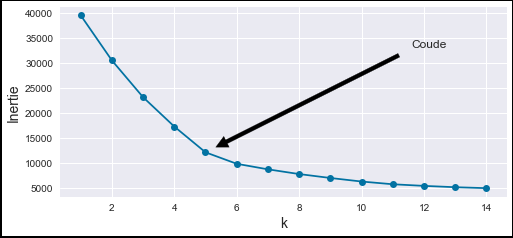

In [9]:
inertias = [model.inertia_ for model in kmeans_per_k]
plt.figure(figsize=(8, 3.5), edgecolor='black', linewidth=4)
plt.plot(range(1, len(inertias)+1), inertias, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Inertie", fontsize=14)
k_coude = 5
plt.annotate('Coude',
             xy=(k_coude, inertias[k_coude-1]),
             xytext=(0.8, 0.8),
             textcoords='figure fraction',
             fontsize=12,
             arrowprops=dict(facecolor='black', shrink=0.05)
             )
plt.show()

On observe un coude.

###### Avec Yellowbrick

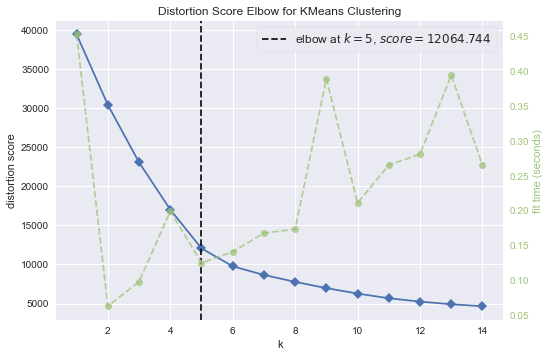

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [10]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 15))

visualizer.fit(data_scaled_trim_X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

#### Score de silhouette pour déterminer le k optimum

In [11]:
silhouette_scores = [silhouette_score(data_scaled_trim[1], model.labels_)
                     for model in kmeans_per_k[1:]]  # k doit être > 1

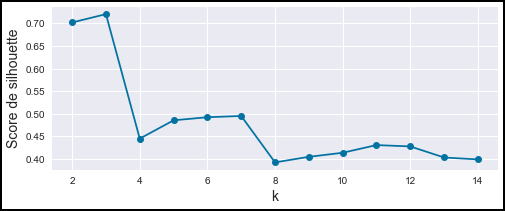

In [12]:
plt.figure(figsize=(8, 3), edgecolor='black', linewidth=4)
plt.plot(range(2, len(silhouette_scores) + 2), silhouette_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Score de silhouette", fontsize=14)
plt.show()

Le graphique recommande k=3.

#### Diagrammes de silhouette

###### Pyplot

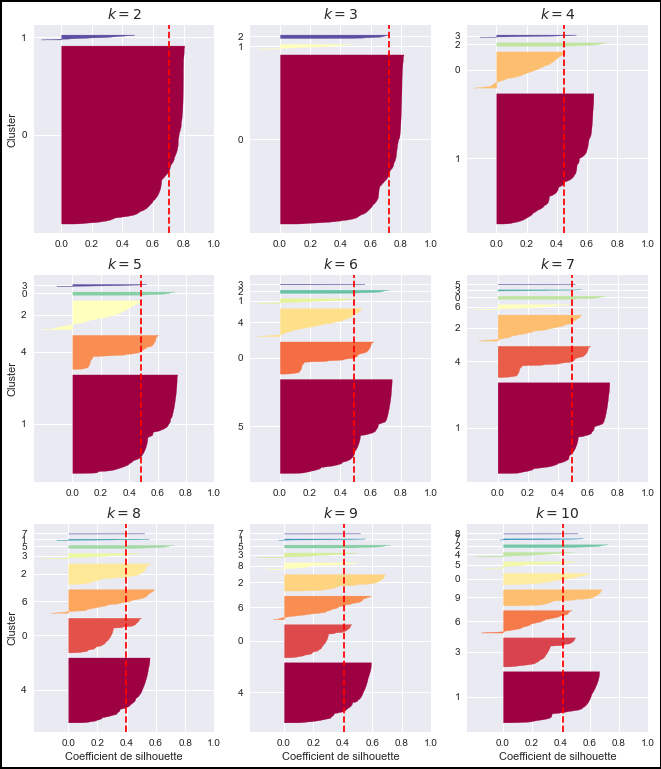

In [13]:
diagramme_silhouette(data_scaled_trim_X, kmeans_per_k)

Note : parfois le graphe a des scores négatifs, ce n'est pas un bug. Il s'agit de points trop éloignés des autres membres du clusters.  

Pour notre problématique marketing, le point faible du k-means est qu'il retourne des clusters avec des effectifs trop différents.

###### Yellowbrick

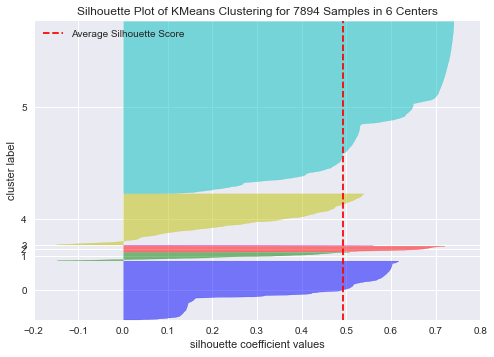

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 7894 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [14]:
from yellowbrick.cluster import SilhouetteVisualizer

model = KMeans(6, random_state=0)
# Instantiate the clustering model and visualizer
visualizer = SilhouetteVisualizer(model, colors='reset')

visualizer.fit(data_scaled_trim[1])        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

On retrouve bien la même silhouette dans le tracé "pyplot".

Note : inconvénient de YB : le fit du modèle est recalculé à chaque update de la visualisation. Si le fit est très long, l'update est très long. Pas de tri possible.

#### Stabilité par rapport à l'initialisation pour le clustering k-means

In [15]:
def stabilite_convergence_kmeans(data,
                                 n_clusters=6,
                                 tol=1e-10,
                                 n_runs=200,
                                 trace_double=False):
    """ Trace l'inertie et l'ARI obtenus pour n_runs modélisations 
    consécutives de sklearn.cluster.KMeans() avec des initialisations 
    différentes.
    La modélisation de référence pour l'ARI est la modélisation de plus 
    faible inertie.
    Args : 
    - data : array numpy contenant la data à fitter par KMeans.
    - n_clusters : idem argument n_clusters de sklearn.cluster.KMeans().
    - tol : idem argument tol de sklearn.cluster.KMeans().
    - n_runs : nb de modélisations testées.
    - trace_double : tracé de l'inertie et de l'ARI (triés) de chacune des 
    n_runs modélisations.
    Returns :
    - void (tracés matplotlib).
    """

    # calculs des k-means avec des initialisations différentes
    inerties = []
    n_iters = []
    cluster_centers = []
    labels = []
    for _ in range(n_runs):
        model = KMeans(n_clusters=n_clusters,
                       n_init=1,
                       random_state=None,
                       tol=tol).fit(data)  # random_state aléatoire
        inerties.append(model.inertia_)
        n_iters.append(model.n_iter_)
        cluster_centers.append(model.cluster_centers_)
        labels.append(model.labels_)

    # traitement du résultat
    zipped = zip(inerties, n_iters, cluster_centers, labels)
    resultats_tries = sorted(
        list(zipped), key=lambda resultat: resultat[0])  # tri sur l'inertie
    inerties_triees = [t[0] for t in resultats_tries]
    n_iters_triees = [t[1] for t in resultats_tries]
    cluster_centers_tries = [t[2] for t in resultats_tries]
    labels_tries = [t[3] for t in resultats_tries]

    # calcul des ARI ; la réf est la modélisation de plus basse inertie
    adj_rand_scores = [
        adjusted_rand_score(labels_tries[0], labelss)
        for labelss in labels_tries
    ]
    quartiles = [
        round(i * 1000) / 1000 for i in quantiles(adj_rand_scores, n=4)
    ]

    #     Tracé double
    if trace_double:
        fig, ax1 = plt.subplots(1, 1, edgecolor='black', linewidth=4)
        ax2 = ax1.twinx()  # Twin the axis
        inerties_triees_normalisees = [
            100 * inertie / inerties_triees[0] for inertie in inerties_triees
        ]
        # Plotting
        ax1.plot(list(range(n_runs)), inerties_triees_normalisees, '-r')
        ax1.set_ylim(100, 101)
        ax2.bar(list(range(n_runs)),
                adj_rand_scores,
                color='navy',
                width=1,
                alpha=0.4)
        ax2.set_ylim(0, 1)
        # Color the axis and add labels
        ax1.set_ylabel('Inertie (normalisée)', color='r')
        ax2.set_ylabel('ARI', color='navy')
        ax1.tick_params(axis='y', colors='r')
        ax2.tick_params(axis='y', colors='navy')
        ax1.set_xlabel('N° modélisation', size=10)
        ax1.set_title(
            f'Inerties et ARI pour {n_runs} modélisations (n_clusters = \
            {str(n_clusters)}, tol = {str(tol)})'
        )
        ax1.set_yticks([100, 100.2, 100.4, 100.6, 100.8, 101])
        # Set the spine colors.
        for ax in (ax1, ax2):
            ax.spines['left'].set_color('r')
            ax.spines['right'].set_color('navy')
        plt.show()

    # Histogramme
    plt.figure(edgecolor='black', linewidth=4)
    plt.hist(adj_rand_scores,
             bins=100,
             density=True,
             range=(0, 1),
             edgecolor='navy')
    bottom, top = plt.ylim()
    plt.xticks(ticks=[i * 0.1 for i in range(11)])
    plt.xlim(0, 1)
    plt.ylim(top=top)
    plt.tick_params(axis='x',
                    color='black',
                    bottom=True,
                    top=False,
                    length=2,
                    width=1)
    plt.tick_params(axis='y',
                    color='black',
                    bottom=True,
                    top=False,
                    length=2,
                    width=1)
    plt.xlabel('Adjusted Rand Index')
    plt.ylabel('Fréquence (%)')
    plt.title(f'Histogramme (100 classes) des ARI')
    plt.annotate(
        f'Paramètres : {n_runs} modélisations (n_clusters = \
        {str(n_clusters)}, tol = {str(tol)})',
        xy=(0.05, top * 0.95),
        size=11)
    plt.annotate(
        f'Quartiles : {str(quartiles[0])}, \
        {str(quartiles[1])}, {str(quartiles[2])}',
        xy=(0.05, top * 0.8))
    plt.show()

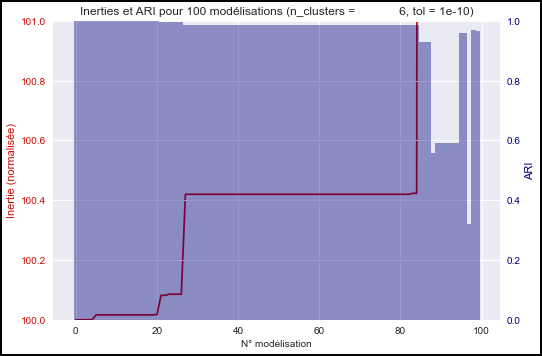

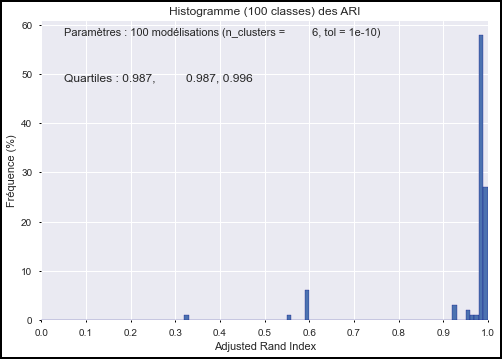

In [16]:
# test unitaire
stabilite_convergence_kmeans(data_scaled_trim_X,
                             n_clusters=6,
                             tol=1e-10,
                             n_runs=100,
                             trace_double=True)

###### Tracé d'histogrammes des Adjusted Rand Scores

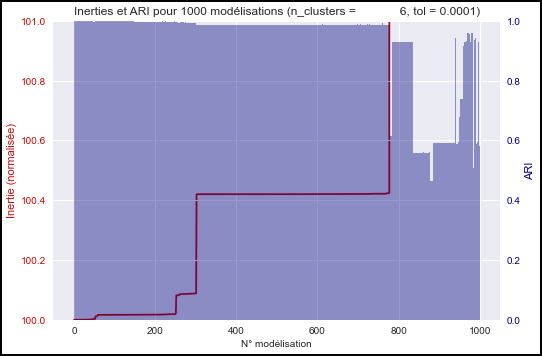

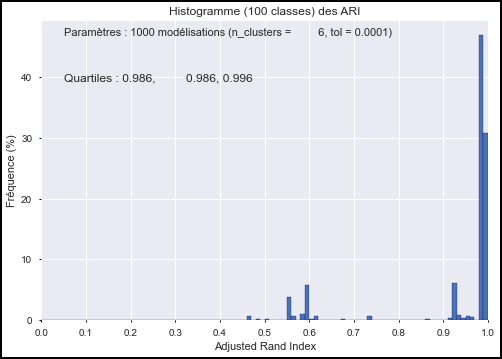

In [17]:
stabilite_convergence_kmeans(data_scaled_trim_X,
                             n_clusters=6,
                             tol=1e-4,
                             n_runs=1000,
                             trace_double=True)

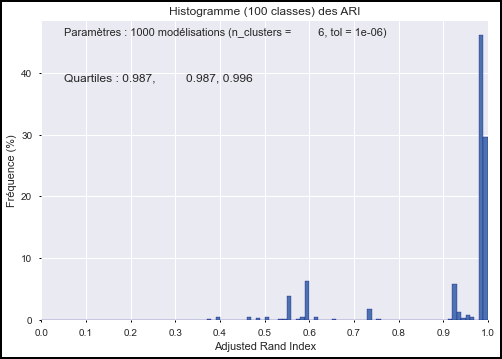

In [18]:
stabilite_convergence_kmeans(data_scaled_trim_X,
                             n_clusters=6,
                             tol=1e-6,
                             n_runs=1000)

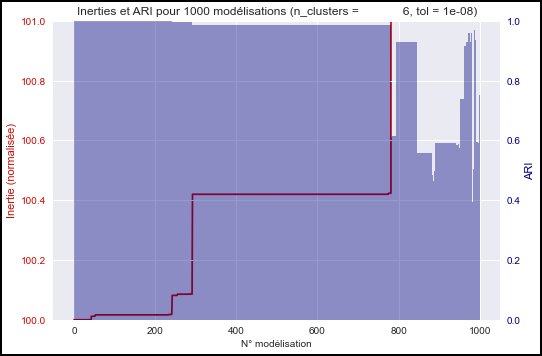

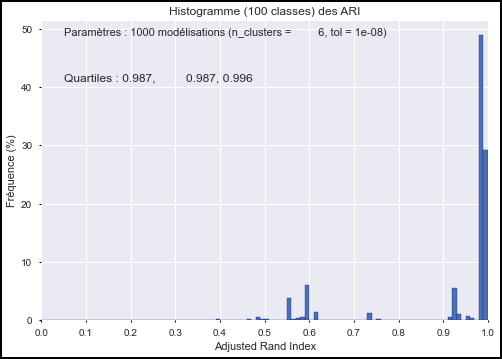

In [19]:
stabilite_convergence_kmeans(data_scaled_trim_X,
                             n_clusters=6,
                             tol=1e-8,
                             n_runs=1000,
                             trace_double=True)

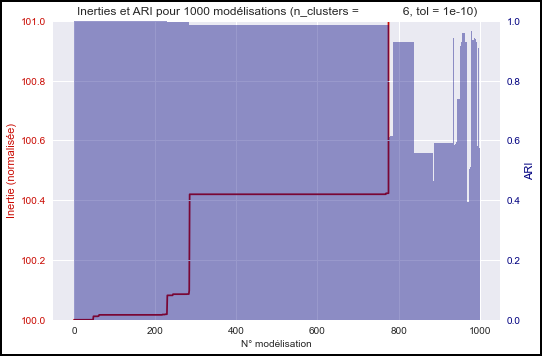

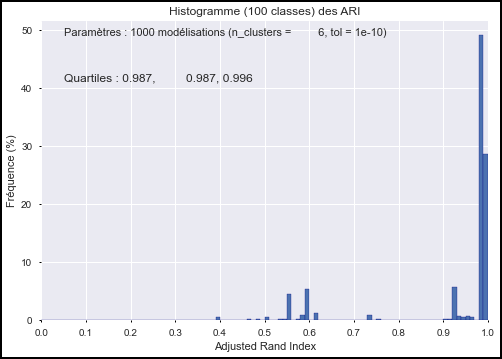

In [20]:
stabilite_convergence_kmeans(data_scaled_trim_X,
                             n_clusters=6,
                             tol=1e-10,
                             n_runs=1000,
                             trace_double=True)

In [21]:
proba = 1-(1-0.75)**10

Pour n_clusters = 6, 75% des partitionnements convergent vers une partition très proche (inertie et ARI très proches (ARI >98%), mais pas égales) de la partition de plus basse inertie trouvée.  
Avec n_init=10 (valeur par défaut de sklearn), la probabilité de terminer très proche de cette partition est de : p = {{proba}}

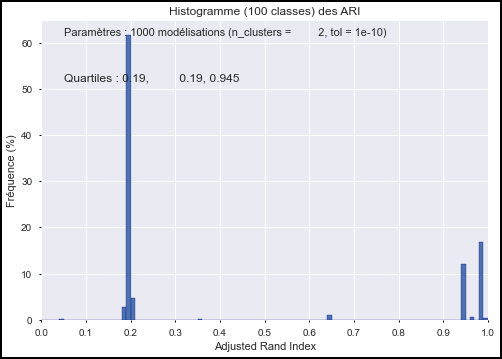

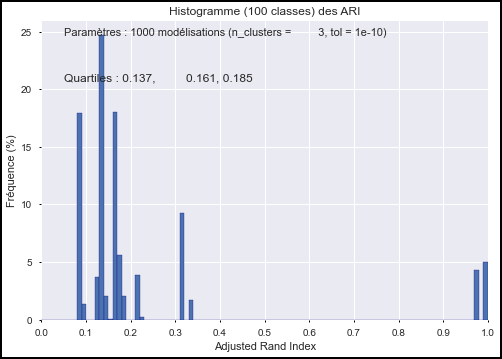

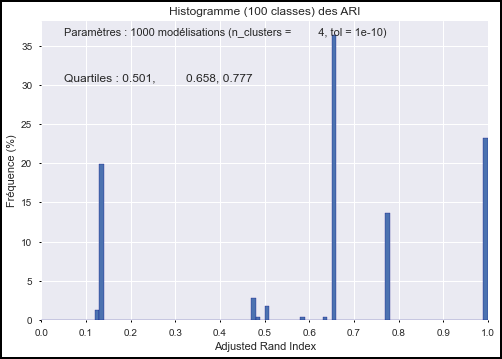

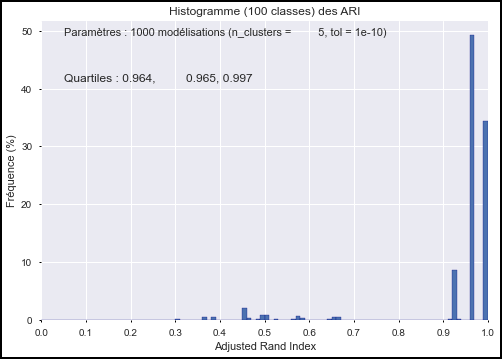

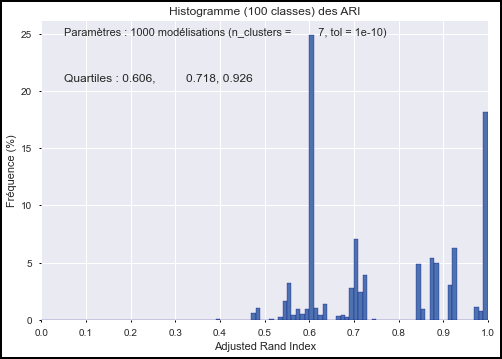

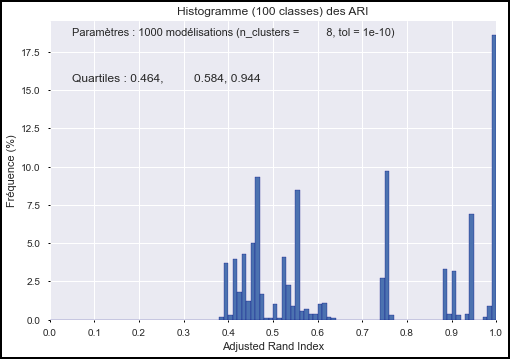

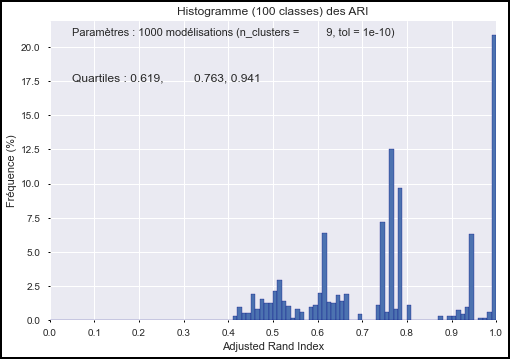

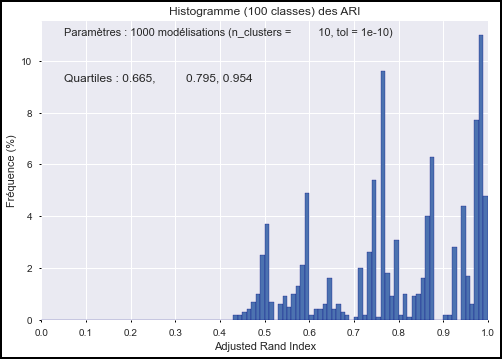

In [22]:
for n_clusters in [2, 3, 4, 5, 7, 8, 9, 10]:
    stabilite_convergence_kmeans(data_scaled_trim_X,
                                 n_clusters=n_clusters,
                                 tol=1e-10,
                                 n_runs=1000)

###### Conclusion sur la stabilité par rapport à l'initialisation

Pour un n_clusters donné, avec différentes initialisations ("random_state"), on retombe rarement sur le partitionnement de plus faible inertie.  
Cependant, et avec n_init suffisamment élevé, on retombe sur un partitionnement très proche (ARI > 0.99) du partitionnement du plus faible inertie.

#### Pair plots des clients

In [23]:
def affichage_pairplot_kmeans(n_clusters, data_trim_X):
    """ Affiche les joint plots et les labels (issus du clustering 
    par k-means) pour diverses variables.
    Args : 
    - n_clusters : nb de clusters.
    - data_trim_X : dataframe pandas converti.
    Returns : void (tracé matplotlib).

    Note : il y a un message d'erreur récurrent "Dataset has 0 variance; 
    skipping density estimate".
    Il se produit lorsque toutes les valeurs d'une variable pour un label 
    donné sont identiques. Ca évite un pic de Dirac.
    """

    data_trim_X = data_trim_X.copy()

    data_scaled_trim_X = preprocessing.StandardScaler().fit_transform(
        data_trim_X)
    kmeans = KMeans(n_clusters, random_state=0)
    labels = kmeans.fit_predict(data_scaled_trim_X)

    # calcul de l'effectif
    bincounts = list(np.bincount(labels))

    # tri des clusters par taille
    taille_clusters = {}
    for i in range(n_clusters):
        taille_clusters[i] = bincounts[i]
    taille_clusters = {
        k: v
        for k, v in sorted(
            taille_clusters.items(), key=lambda item: item[1], reverse=True)
    }
    print("Effectifs des clusters :")
    zipped = zip([chr(65 + i) for i in range(len(taille_clusters.values()))],
                 taille_clusters.values())
    print([(i, j) for i, j in zipped])

    # remplacement des labels numériques par des labels alphabétiques
    ser_labels = pd.Series(labels, index=data_trim_X.index)
    ser_labels.replace(
        [i for i in taille_clusters.keys()],
        [chr(65 + i) for i in range(len(taille_clusters.keys()))],
        inplace=True
    )  # taille_clusters.keys() contient les labels triés à rempacer
    # chr(65) correspond à 'A'

    # Finalisation du dataframe
    data_trim_X['Cluster'] = ser_labels

    # ajout de lignes "dummy" en début de data frame pour que les labels \
    # de la légende soient tracés dans l'ordre ABCDEFG
    for i in range(n_clusters):
        df_dummy = data_trim_X.iloc[[0]].copy()
        df_dummy['Cluster'] = chr(65 + n_clusters - 1 - i)
        data_trim_X = pd.concat([df_dummy, data_trim_X])


#     display(data_trim_X.head(10))

# affichage du pairplot
    plt.style.use('seaborn')
    palette_full = [
        "yellow", "orange", "red", "green", "tab:blue", "black", "pink"
    ]
    palette = palette_full[:n_clusters]
    warnings.simplefilter(action='ignore', category=UserWarning)
    pp = sns.pairplot(data_trim_X,
                      hue='Cluster',
                      palette=palette,
                      plot_kws={
                          "s": 20,
                          'alpha': 0.4
                      })
    warnings.simplefilter(action='default', category=UserWarning)
    pp.axes[1, 1].set_xlim(-100, 5000)  # montant total
    pp.axes[1, 1].set_ylim(-100, 5000)  # montant total
    pp.axes[2, 2].set_xlim(-100, 5000)  # montant moyen
    pp.axes[2, 2].set_ylim(-100, 5000)  # montant moyen
    pp.axes[3, 3].set_xlim(-0.5, 20.5)  # installments
    pp.axes[3, 3].set_ylim(-0.5, 20.5)  # installments
    pp.axes[4, 4].set_xlim(0.5, 5.5)  # review_score
    pp.axes[4, 4].set_ylim(0.5, 5.5)  # review_score
    plt.show()

Effectifs des clusters :
[('A', 4576), ('B', 1567), ('C', 1359), ('D', 221), ('E', 154), ('F', 17)]


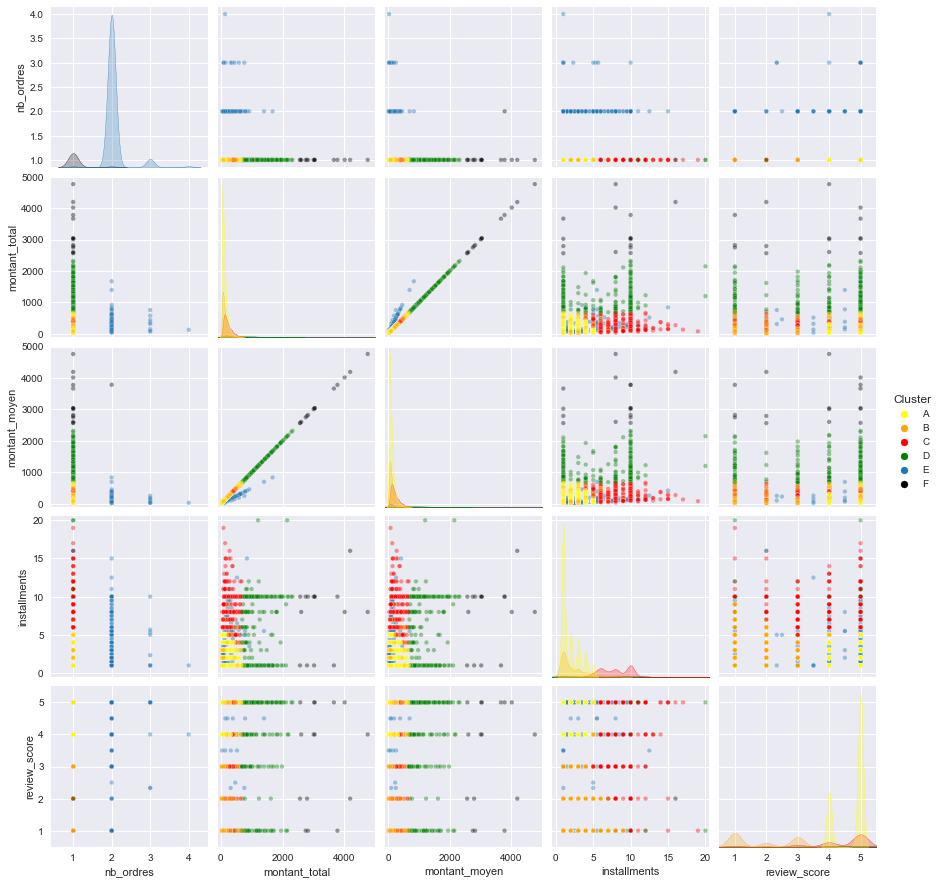

In [24]:
affichage_pairplot_kmeans(6, data_trim[1])

### Trimestre 2

In [25]:
data_scaled_trim_X = data_scaled_trim[2]

kmeans_per_k = [
    KMeans(n_clusters=k, random_state=0).fit(data_scaled_trim_X)
    for k in range(1, 15)
]

#### Méthode du coude sur l'inertie pour déterminer le k optimum

###### Avec Pyplot

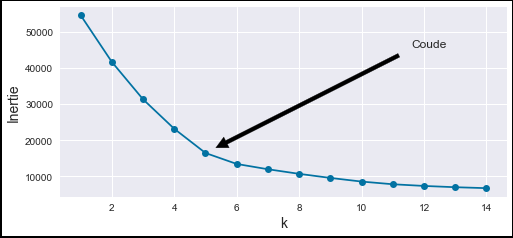

In [26]:
inertias = [model.inertia_ for model in kmeans_per_k]
plt.figure(figsize=(8, 3.5), edgecolor='black', linewidth=4)
plt.plot(range(1, len(inertias)+1), inertias, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Inertie", fontsize=14)
k_coude = 5
plt.annotate('Coude',
             xy=(k_coude, inertias[k_coude-1]),
             xytext=(0.8, 0.8),
             textcoords='figure fraction',
             fontsize=12,
             arrowprops=dict(facecolor='black', shrink=0.05)
             )
plt.show()

On observe un coude.

###### Avec Yellowbrick

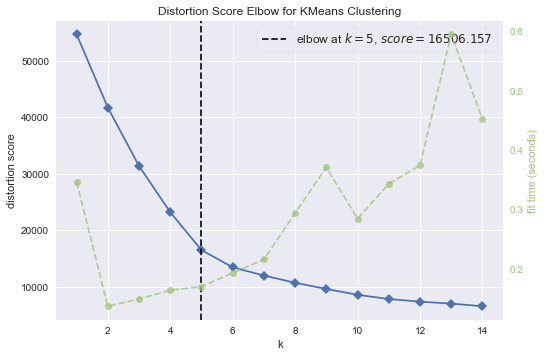

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [27]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 15))

visualizer.fit(data_scaled_trim_X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

#### Score de silhouette pour déterminer le k optimum

In [28]:
silhouette_scores = [silhouette_score(data_scaled_trim_X, model.labels_)
                     for model in kmeans_per_k[1:]]  # k doit être > 1

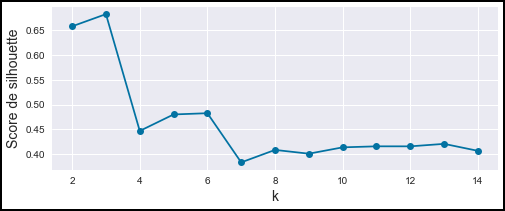

In [29]:
plt.figure(figsize=(8, 3), edgecolor='black', linewidth=4)
plt.plot(range(2, len(silhouette_scores) + 2), silhouette_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Score de silhouette", fontsize=14)
plt.show()

Le graphique recommande k=3.

#### Diagrammes de silhouette

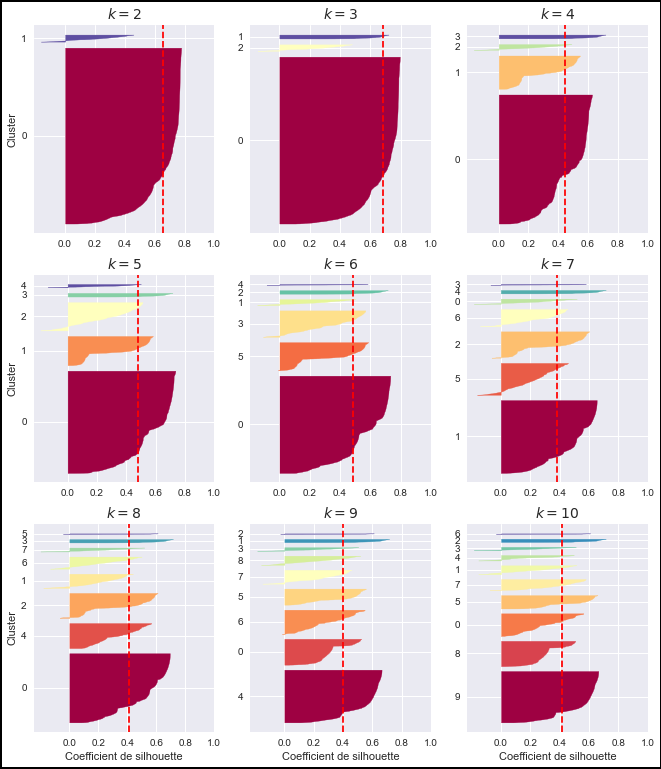

In [30]:
diagramme_silhouette(data_scaled_trim_X, kmeans_per_k)

#### Stabilité par rapport à l'initialisation pour le clustering k-means

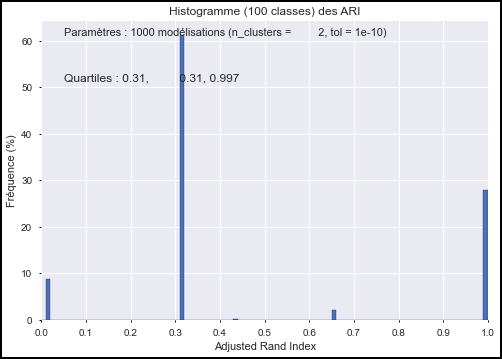

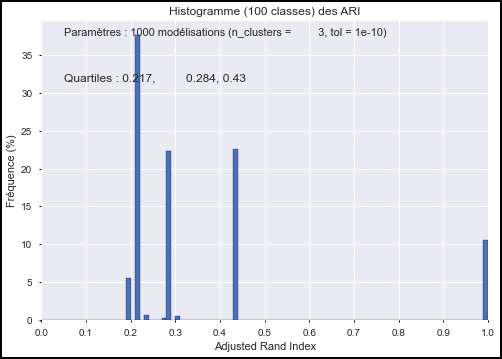

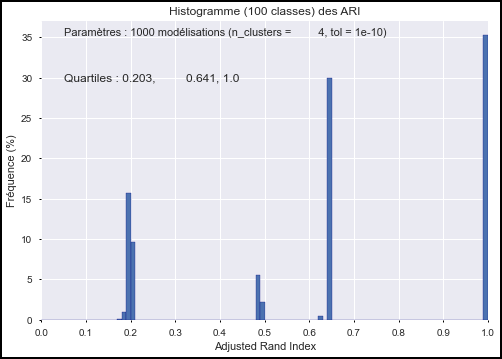

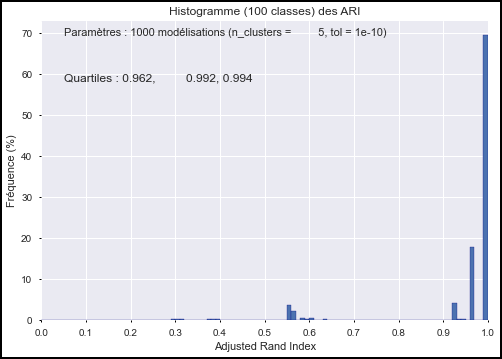

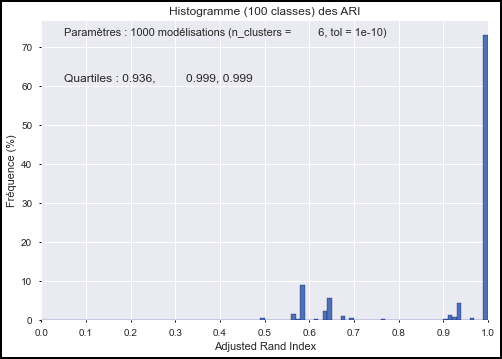

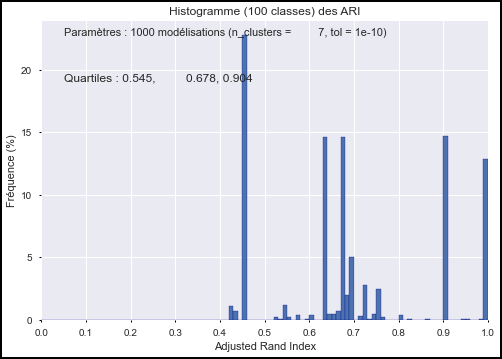

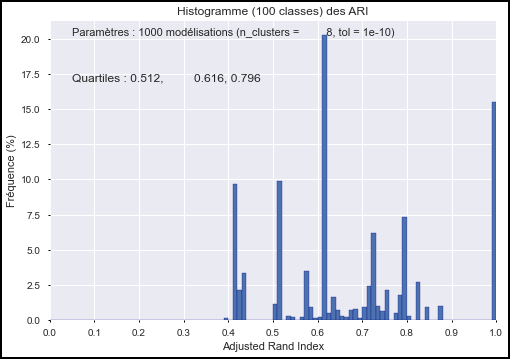

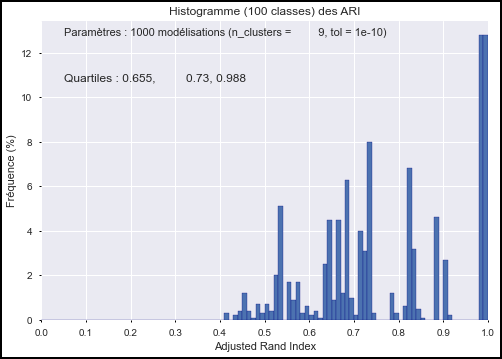

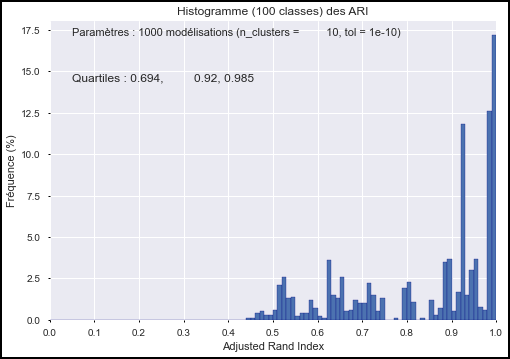

In [31]:
for n_clusters in range(2, 11):
    stabilite_convergence_kmeans(data_scaled_trim_X,
                                 n_clusters=n_clusters,
                                 tol=1e-10,
                                 n_runs=1000)

#### Pair plots des clients

Effectifs des clusters :
[('A', 6566), ('B', 1900), ('C', 1780), ('D', 397), ('E', 241), ('F', 52)]


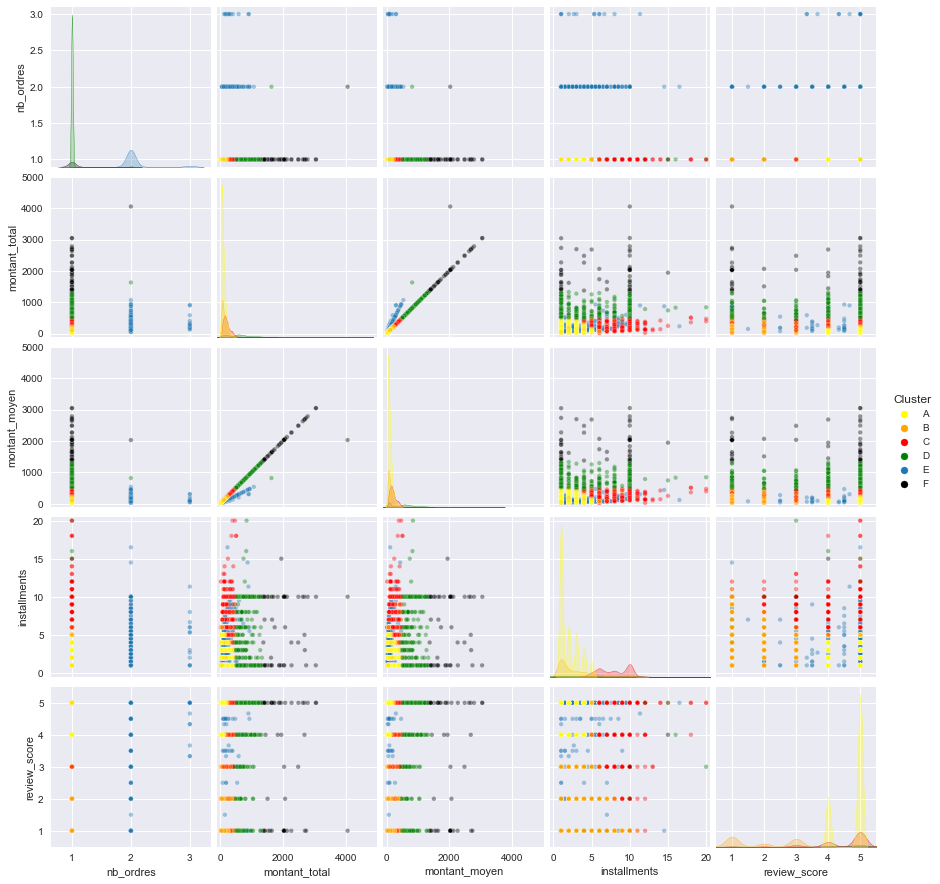

In [32]:
affichage_pairplot_kmeans(6, data_trim[2])

### Trimestre 3

In [33]:
data_scaled_trim_X = data_scaled_trim[3]

kmeans_per_k = [
    KMeans(n_clusters=k, random_state=0).fit(data_scaled_trim_X)
    for k in range(1, 15)
]

#### Méthode du coude sur l'inertie pour déterminer le k optimum

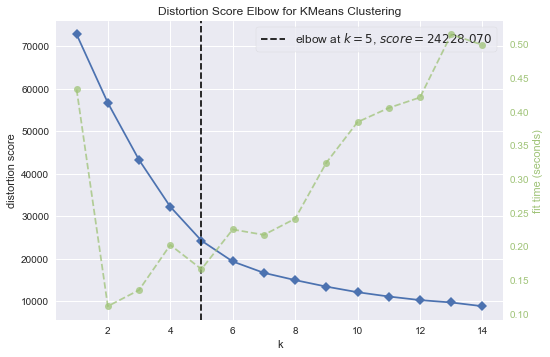

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [34]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 15))

visualizer.fit(data_scaled_trim_X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

#### Score de silhouette pour déterminer le k optimum

In [35]:
silhouette_scores = [silhouette_score(data_scaled_trim_X, model.labels_)
                     for model in kmeans_per_k[1:]]  # k doit être > 1

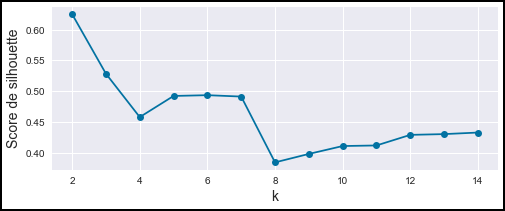

In [36]:
plt.figure(figsize=(8, 3), edgecolor='black', linewidth=4)
plt.plot(range(2, len(silhouette_scores) + 2), silhouette_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Score de silhouette", fontsize=14)
plt.show()

Le graphique recommande k=2.

#### Diagrammes de silhouette

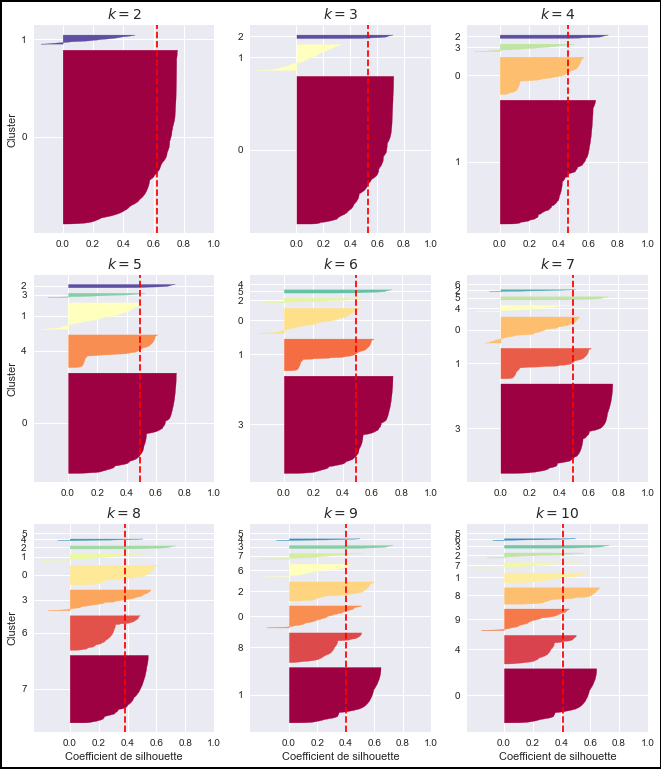

In [37]:
diagramme_silhouette(data_scaled_trim_X, kmeans_per_k)

#### Pair plots des clients

Effectifs des clusters :
[('A', 8742), ('B', 2851), ('C', 2278), ('D', 402), ('E', 286), ('F', 1)]


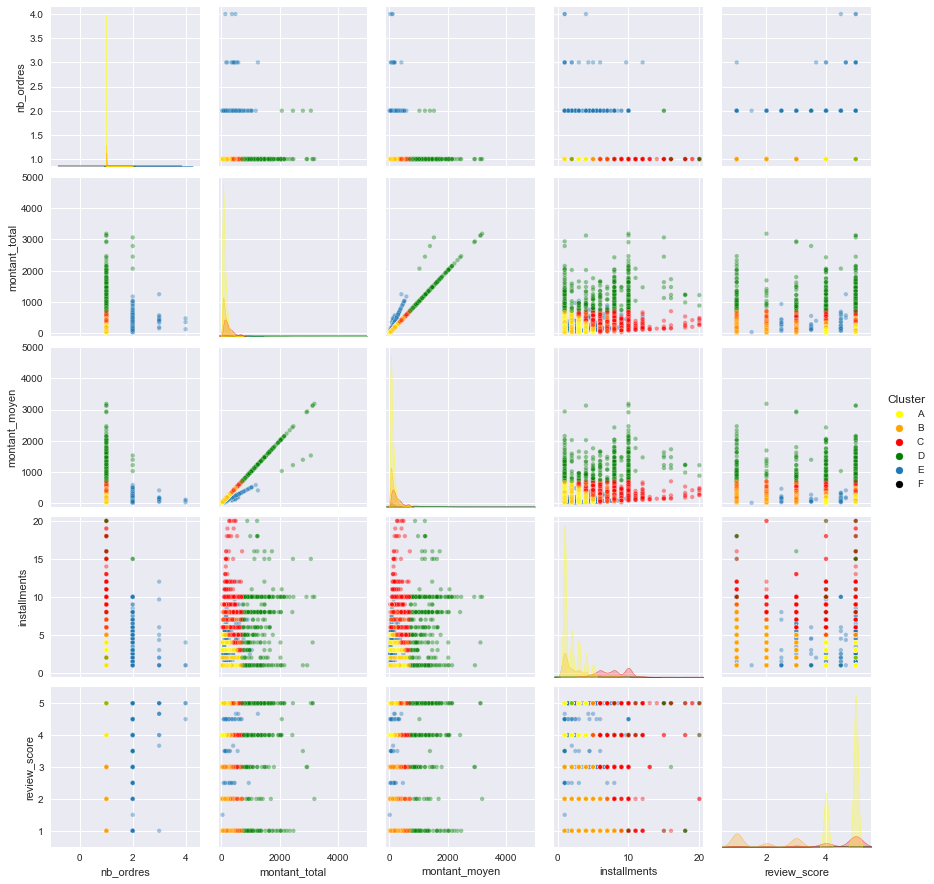

In [38]:
affichage_pairplot_kmeans(6, data_trim[3])

### Trimestre 4

In [39]:
data_scaled_trim_X = data_scaled_trim[4]

kmeans_per_k = [
    KMeans(n_clusters=k, random_state=0).fit(data_scaled_trim_X)
    for k in range(1, 15)
]

#### Méthode du coude sur l'inertie pour déterminer le k optimum

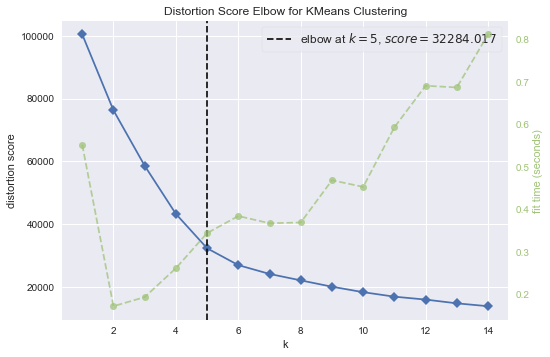

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [40]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 15))

visualizer.fit(data_scaled_trim_X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

#### Score de silhouette pour déterminer le k optimum

In [41]:
silhouette_scores = [silhouette_score(data_scaled_trim_X, model.labels_)
                     for model in kmeans_per_k[1:]]  # k doit être > 1

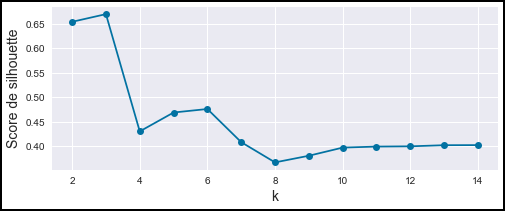

In [42]:
plt.figure(figsize=(8, 3), edgecolor='black', linewidth=4)
plt.plot(range(2, len(silhouette_scores) + 2), silhouette_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Score de silhouette", fontsize=14)
plt.show()

#### Diagrammes de silhouette

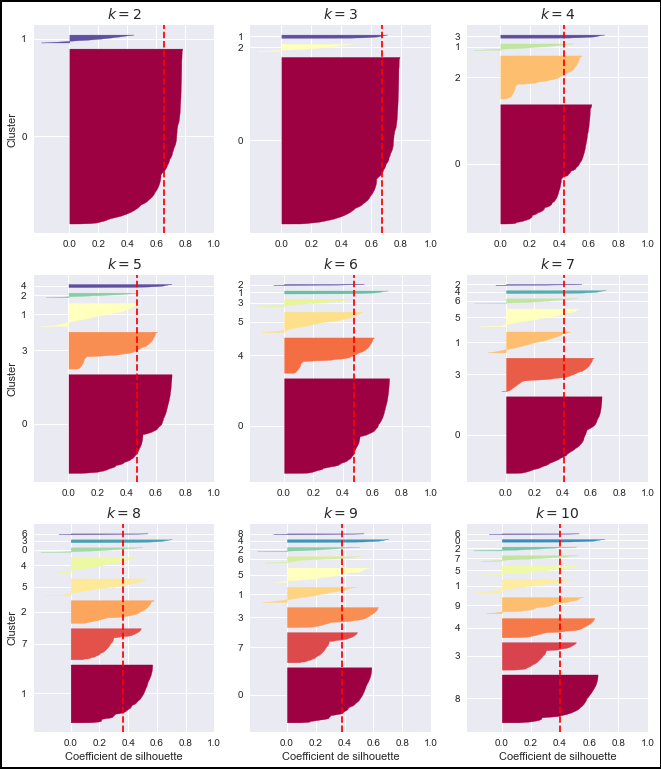

In [43]:
diagramme_silhouette(data_scaled_trim_X, kmeans_per_k)

#### Pair plots des clients

Effectifs des clusters :
[('A', 11742), ('B', 4390), ('C', 2520), ('D', 920), ('E', 373), ('F', 139)]


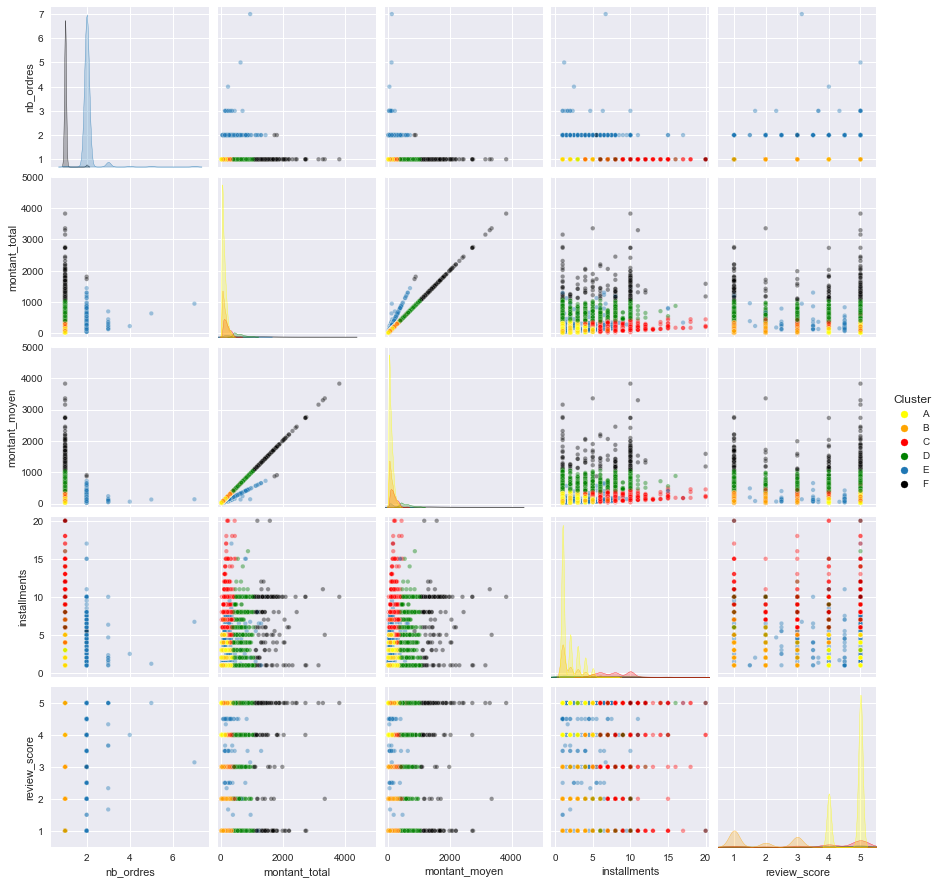

In [44]:
affichage_pairplot_kmeans(6, data_trim[4])

### Trimestre 5

In [45]:
data_scaled_trim_X = data_scaled_trim[5]

kmeans_per_k = [
    KMeans(n_clusters=k, random_state=0).fit(data_scaled_trim_X)
    for k in range(1, 15)
]

#### Méthode du coude sur l'inertie pour déterminer le k optimum

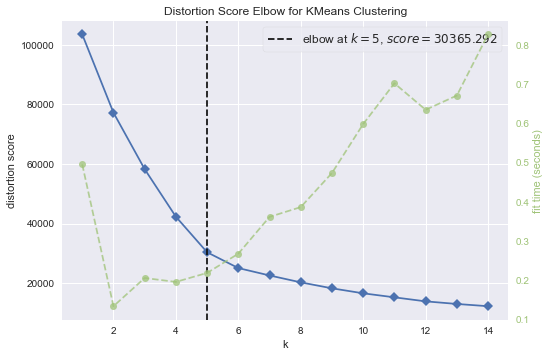

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [46]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 15))

visualizer.fit(data_scaled_trim_X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

#### Score de silhouette pour déterminer le k optimum

In [47]:
silhouette_scores = [silhouette_score(data_scaled_trim_X, model.labels_)
                     for model in kmeans_per_k[1:]]  # k doit être > 1

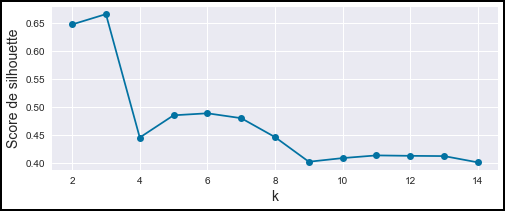

In [48]:
plt.figure(figsize=(8, 3), edgecolor='black', linewidth=4)
plt.plot(range(2, len(silhouette_scores) + 2), silhouette_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Score de silhouette", fontsize=14)
plt.show()

#### Diagrammes de silhouette

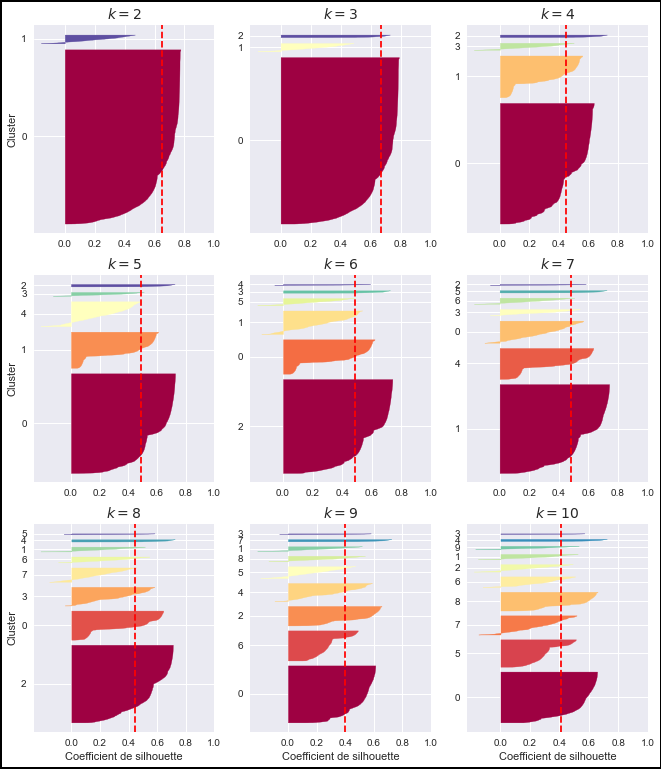

In [49]:
diagramme_silhouette(data_scaled_trim_X, kmeans_per_k)

#### Pair plots des clients

Effectifs des clusters :
[('A', 11984), ('B', 4391), ('C', 2991), ('D', 893), ('E', 300), ('F', 125)]


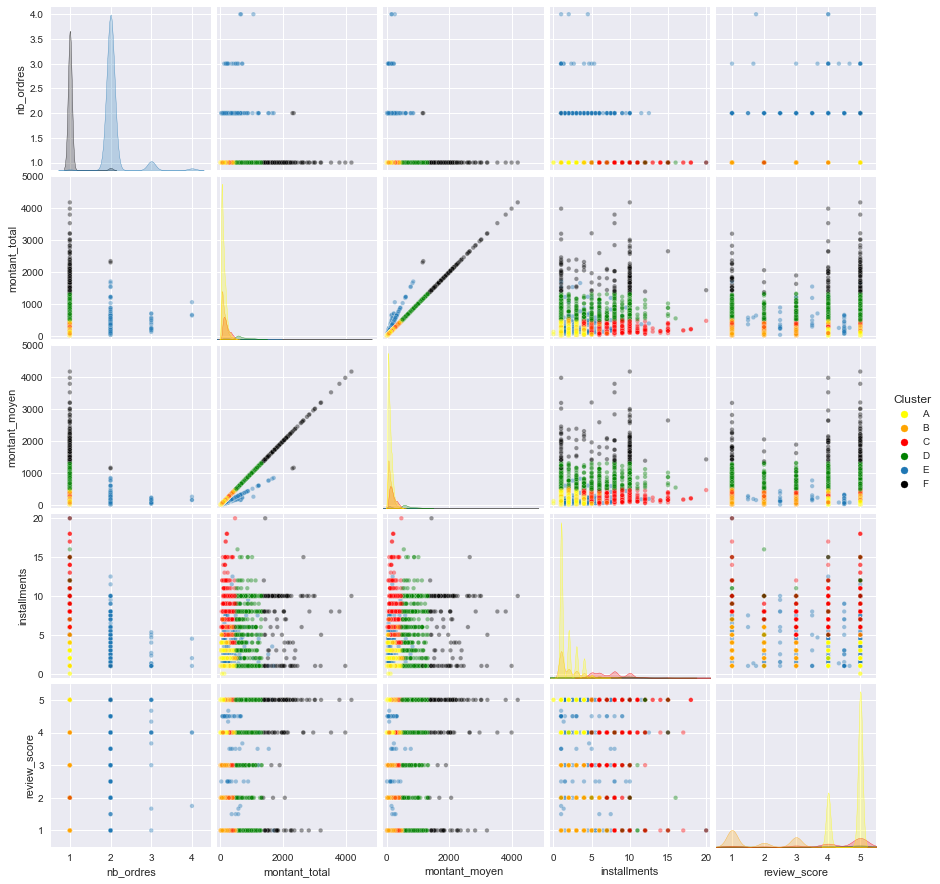

In [50]:
affichage_pairplot_kmeans(6, data_trim[5])

### Trimestre 6

In [51]:
data_scaled_trim_X = data_scaled_trim[6]

kmeans_per_k = [
    KMeans(n_clusters=k, random_state=0).fit(data_scaled_trim_X)
    for k in range(1, 15)
]

#### Méthode du coude sur l'inertie pour déterminer le k optimum

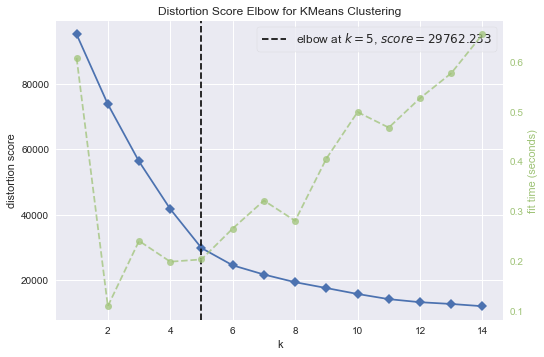

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [52]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 15))

visualizer.fit(data_scaled_trim_X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

#### Score de silhouette pour déterminer le k optimum

In [53]:
silhouette_scores = [silhouette_score(data_scaled_trim_X, model.labels_)
                     for model in kmeans_per_k[1:]]  # k doit être > 1

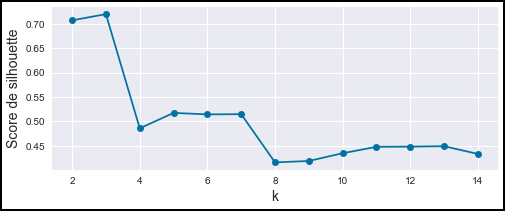

In [54]:
plt.figure(figsize=(8, 3), edgecolor='black', linewidth=4)
plt.plot(range(2, len(silhouette_scores) + 2), silhouette_scores, "bo-")
plt.xlabel("k", fontsize=14)
plt.ylabel("Score de silhouette", fontsize=14)
plt.show()

Le graphique recommande k=2.

#### Diagrammes de silhouette

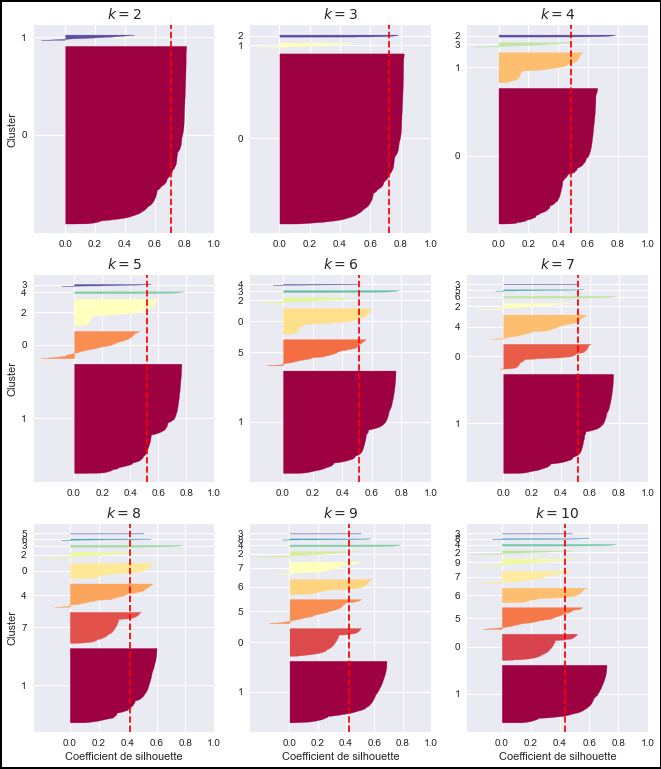

In [55]:
diagramme_silhouette(data_scaled_trim_X, kmeans_per_k)

#### Stabilité par rapport à l'initialisation pour le clustering k-means

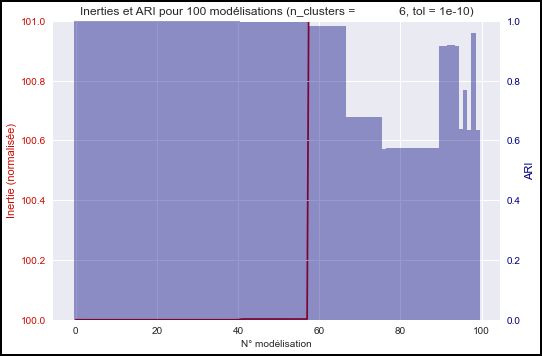

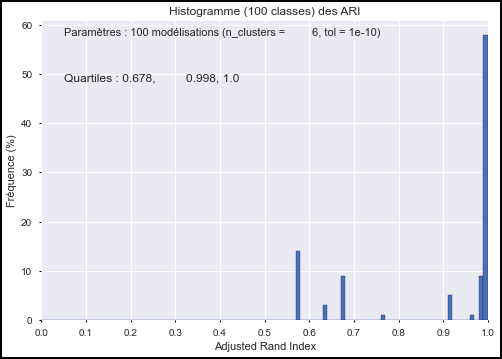

In [56]:
stabilite_convergence_kmeans(data_scaled_trim[6],
                             n_clusters=6,
                             tol=1e-10,
                             n_runs=100,
                             trace_double=True)

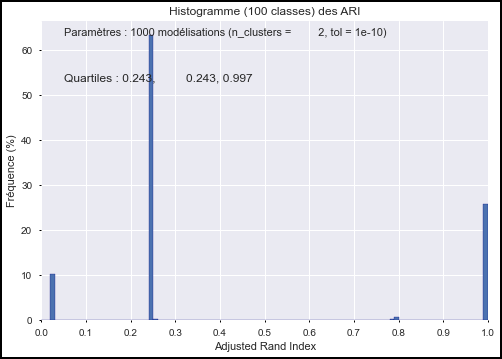

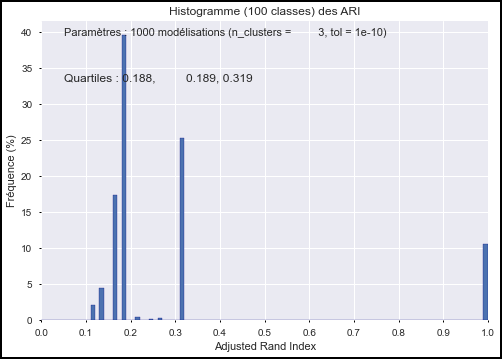

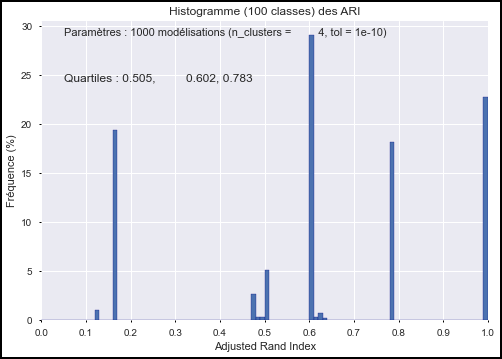

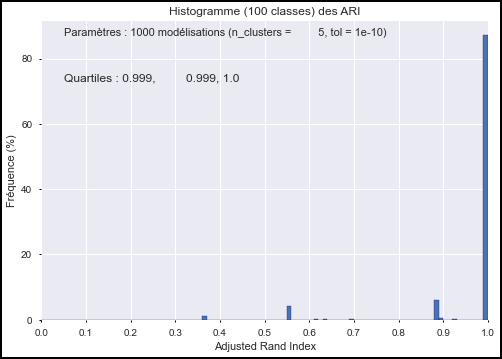

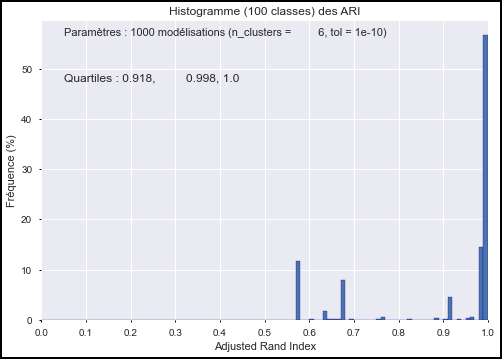

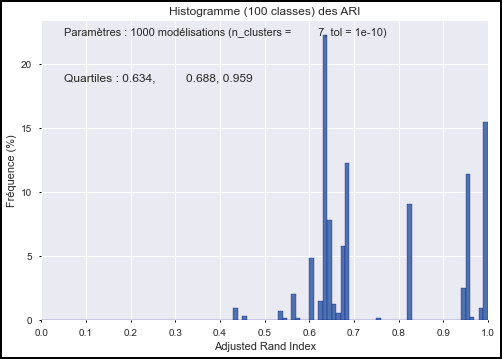

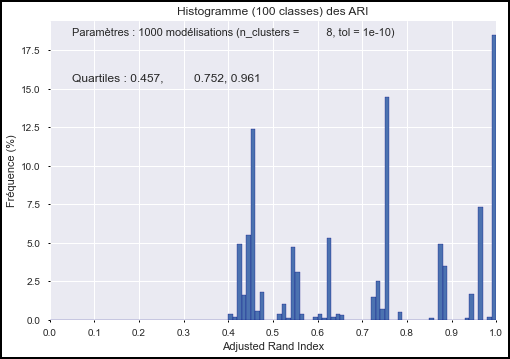

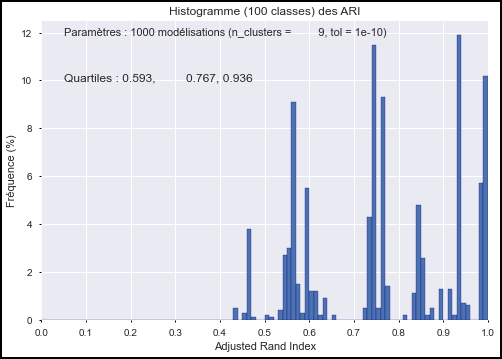

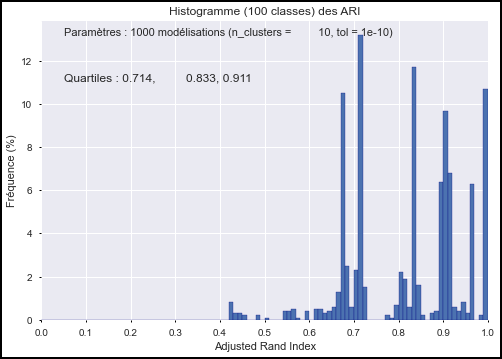

In [57]:
for n_clusters in range(2, 11):
    stabilite_convergence_kmeans(data_scaled_trim[6],
                                 n_clusters=n_clusters,
                                 tol=1e-10,
                                 n_runs=1000)

#### Pair plots des clients

Effectifs des clusters :
[('A', 12049), ('B', 3057), ('C', 3015), ('D', 627), ('E', 225), ('F', 85)]


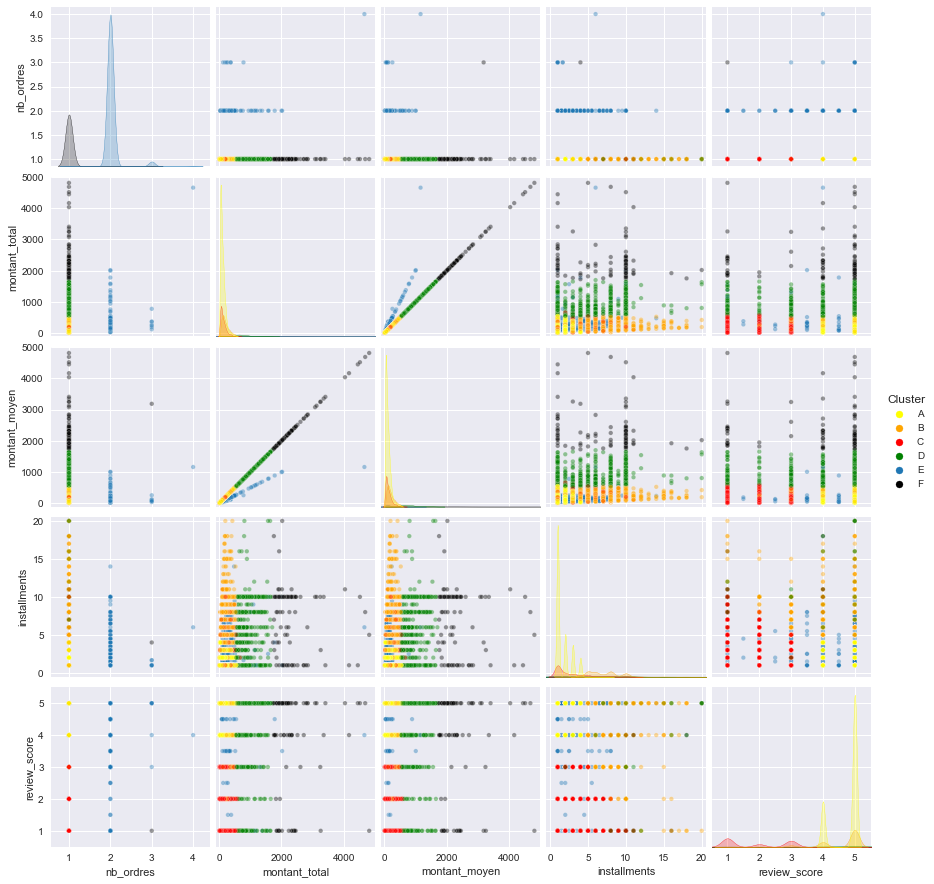

In [58]:
affichage_pairplot_kmeans(6, data_trim[6])

### Stabilité inter-trimestre des clusters

In [59]:
np.set_printoptions(edgeitems=20)

#### Stabilité des clusters obtenus avec k=6

In [60]:
# Hyperparamètres utilisés
n_clusters = 6
n_init = 10
random_state = 0
tol = 1e-10
models = [k for k in range(7)]

###### Trimestre 1

In [61]:
models[1] = KMeans(n_clusters=n_clusters,
                   n_init=n_init,
                   random_state=random_state,
                   tol=tol).fit(data_scaled_trim[1])
labels_trim_1 = models[1].labels_
print("Labels :")
print(labels_trim_1)
print("\nCluster centers :")
print(models[1].cluster_centers_)

Labels :
[1 4 1 4 1 1 1 1 4 1 1 2 1 1 1 0 4 1 1 1 ... 2 1 1 4 1 1 1 1 4 1 2 4 1 1 1 1 4 1 1 4]

Cluster centers :
[[ 6.84674647  0.37586478 -0.13237644  0.23217012  0.03851613]
 [-0.13707454 -0.21705754 -0.21462117 -0.45714196  0.50559346]
 [-0.13707454  0.17846112  0.19894703  1.65076211  0.20709244]
 [-0.13707454  3.41790131  3.58621949  1.1757061  -0.12616709]
 [-0.13707454 -0.18141818 -0.1773554  -0.30066599 -1.6377899 ]
 [ 0.24868889 13.04526699 12.79322482  1.41495745 -0.39212321]]


In [62]:
# prédiction du label des data du trimestre 1 avec le modèle de \
# clustering du trimestre 1
labels_trim_1_from_model_trim_1 = models[1].predict(data_scaled_trim[1])
print("Labels :")
print(labels_trim_1_from_model_trim_1)
# ARI
ARI = adjusted_rand_score(labels_trim_1, labels_trim_1_from_model_trim_1)
print(f"\nARI = {round(ARI*1000)/10}%")

Labels :
[1 4 1 4 1 1 1 1 4 1 1 2 1 1 1 0 4 1 1 1 ... 2 1 1 4 1 1 1 1 4 1 2 4 1 1 1 1 4 1 1 4]

ARI = 100.0%


###### Trimestre 2

In [63]:
models[2] = KMeans(n_clusters=n_clusters,
                   n_init=n_init,
                   random_state=random_state,
                   tol=tol).fit(data_scaled_trim[2])
labels_trim_2 = models[2].labels_
print("Labels :")
print(labels_trim_2)
print("\nCluster centers :")
print(models[2].cluster_centers_)

Labels :
[0 4 0 5 1 3 0 1 0 0 0 3 4 0 0 0 0 5 3 0 ... 1 0 0 0 0 0 0 1 3 0 0 3 1 0 0 0 1 0 0 0]

Cluster centers :
[[-0.14735009 -0.26287535 -0.25371242 -0.45127143  0.45674478]
 [-0.14735009  0.20708399  0.22882525  1.63696245  0.27022947]
 [-0.02392633  9.21417791  9.27248974  1.03664239 -0.8015387 ]
 [-0.14735009 -0.194016   -0.18301006 -0.20271351 -1.79654604]
 [ 6.48680512  0.50025358 -0.14453138  0.24076217 -0.08362946]
 [-0.13149465  2.86088229  2.94308312  0.81541808 -0.0093891 ]]


In [64]:
# prédiction du label des data du trimestre 2 avec le modèle de clustering \
# du trimestre 1
labels_trim_2_from_model_trim_1 = models[1].predict(data_scaled_trim[2])
print("Labels :")
print(labels_trim_2_from_model_trim_1)
# ARI
ARI = adjusted_rand_score(labels_trim_2, labels_trim_2_from_model_trim_1)
print(f"\nARI = {round(ARI*1000)/10}%")

Labels :
[1 0 1 3 2 4 1 2 1 1 1 4 0 1 1 1 1 3 4 1 ... 2 1 1 1 1 1 1 2 4 1 1 4 2 1 1 1 2 1 1 1]

ARI = 97.2%


In [65]:
# prédiction du label des data du trimestre 1 avec le modèle de clustering \
# du trimestre 2
labels_trim_1_from_model_trim_2 = models[2].predict(data_scaled_trim[1])
print("Labels :")
print(labels_trim_1_from_model_trim_2)
# ARI
ARI = adjusted_rand_score(labels_trim_1, labels_trim_1_from_model_trim_2)
print(f"\nARI = {round(ARI*1000)/10}%")

Labels :
[0 3 0 3 0 0 0 0 3 0 0 1 0 0 0 4 3 0 0 0 ... 1 0 0 3 0 0 0 0 3 0 1 3 0 0 0 0 3 0 0 3]

ARI = 97.5%


###### Trimestre 3

In [66]:
models[3] = KMeans(n_clusters=n_clusters,
                   n_init=n_init,
                   random_state=random_state,
                   tol=tol).fit(data_scaled_trim[3])
labels_trim_3 = models[3].labels_
print("Labels :")
print(labels_trim_3)
print("\nCluster centers :")
print(models[3].cluster_centers_)

Labels :
[4 2 0 0 2 2 0 0 0 0 2 2 0 1 0 0 0 0 2 0 ... 1 1 0 0 0 2 0 0 1 1 2 2 2 2 2 0 0 0 2 5]

Cluster centers :
[[-1.37726143e-01 -2.30673306e-01 -2.21903274e-01 -4.24212948e-01  4.93686205e-01]
 [-1.37726143e-01  2.89165373e-01  3.06839104e-01  1.73846971e+00  2.08676349e-01]
 [-1.37726143e-01 -1.55545158e-01 -1.45488345e-01 -2.68532854e-01 -1.66901296e+00]
 [-1.37726143e-01  5.32631431e+01  5.41881451e+01 -7.40394020e-01 -2.28036310e+00]
 [ 6.78272797e+00  4.18874251e-01 -1.36012446e-01  9.20416288e-02  1.58001816e-02]
 [-7.26192388e-02  4.06911765e+00  4.09945987e+00  1.21190577e+00 -8.86735173e-02]]


In [67]:
# prédiction du label des data du trimestre 3 avec le modèle de clustering \
# du trimestre 1
labels_trim_3_from_model_trim_1 = models[1].predict(data_scaled_trim[3])
print("Labels :")
print(labels_trim_3_from_model_trim_1)
# ARI
ARI = adjusted_rand_score(labels_trim_3, labels_trim_3_from_model_trim_1)
print(f"\nARI = {round(ARI*1000)/10}%")

Labels :
[0 4 1 1 4 4 1 1 1 1 4 4 1 2 1 1 1 1 4 1 ... 2 2 1 1 1 4 1 1 2 2 4 4 4 4 4 1 1 1 4 3]

ARI = 96.7%


In [68]:
# prédiction du label des data du trimestre 1 avec le modèle de clustering \
# du trimestre 3
labels_trim_1_from_model_trim_3 = models[3].predict(data_scaled_trim[1])
print("Labels :")
print(labels_trim_1_from_model_trim_3)
# ARI
ARI = adjusted_rand_score(labels_trim_1, labels_trim_1_from_model_trim_3)
print(f"\nARI = {round(ARI*1000)/10}%")

Labels :
[0 2 0 2 0 0 0 0 2 0 0 1 0 0 0 4 2 0 0 0 ... 1 0 0 2 0 0 0 0 2 0 1 2 0 0 0 0 2 0 0 2]

ARI = 97.7%


###### Trimestre 4

In [69]:
models[4] = KMeans(n_clusters=n_clusters,
                   n_init=n_init,
                   random_state=random_state,
                   tol=tol).fit(data_scaled_trim[4])

###### Trimestre 5

In [70]:
models[5] = KMeans(n_clusters=n_clusters,
                   n_init=n_init,
                   random_state=random_state,
                   tol=tol).fit(data_scaled_trim[5])

###### Trimestre 6

In [71]:
models[6] = KMeans(n_clusters=n_clusters,
                   n_init=n_init,
                   random_state=random_state,
                   tol=tol).fit(data_scaled_trim[6])

###### Prédiction du label des data du trimestre Y avec le modèle de clustering du trimestre X, puis calcul de ARI

In [72]:
scores_model_trim_precedent = []  # scores des modèles des trimestres n-1
for trim_Y in range(2, 7):
    labels_trim_Y = models[trim_Y].labels_
    for trim_X in range(1, trim_Y):
        labels_trim_Y_from_model_trim_X = models[trim_X].predict(
            data_scaled_trim[trim_Y])
        ARI = adjusted_rand_score(labels_trim_Y,
                                  labels_trim_Y_from_model_trim_X)
        print(
            f"Labels du TRIMESTRE {trim_Y} prédits avec modèle du trimestre \
            {trim_X} : ARI = {round(ARI*100)}%"
        )
        if trim_X == trim_Y - 1:
            scores_model_trim_precedent.append(f"{round(ARI*100)}% ")
    print("---------------------------------------------------------")
print("Scores des modèles des trimestres n-1 :")
print(scores_model_trim_precedent)

Labels du TRIMESTRE 2 prédits avec modèle du trimestre             1 : ARI = 97%
---------------------------------------------------------
Labels du TRIMESTRE 3 prédits avec modèle du trimestre             1 : ARI = 97%
Labels du TRIMESTRE 3 prédits avec modèle du trimestre             2 : ARI = 95%
---------------------------------------------------------
Labels du TRIMESTRE 4 prédits avec modèle du trimestre             1 : ARI = 92%
Labels du TRIMESTRE 4 prédits avec modèle du trimestre             2 : ARI = 79%
Labels du TRIMESTRE 4 prédits avec modèle du trimestre             3 : ARI = 95%
---------------------------------------------------------
Labels du TRIMESTRE 5 prédits avec modèle du trimestre             1 : ARI = 98%
Labels du TRIMESTRE 5 prédits avec modèle du trimestre             2 : ARI = 87%
Labels du TRIMESTRE 5 prédits avec modèle du trimestre             3 : ARI = 95%
Labels du TRIMESTRE 5 prédits avec modèle du trimestre             4 : ARI = 95%
----------------

#### Stabilité des clusters obtenus avec k=2 à 10 (prédiction du trimestre n basée sur data trimestre n-1)

In [73]:
k_min = 2
k_max = 10
# calcul des modèles
models = [
    [0 for k in range(k_max + 1)] for trim_X in range(7)
]  # format : models[trim_X][k]. Liste des modèles des trimestres X \
# (X = 0 à 6) et n_clusters
for trim_X in range(0, 7):
    for k in range(k_min, k_max + 1):
        models[trim_X][k] = KMeans(n_clusters=k,
                                   n_init=100,
                                   random_state=0,
                                   tol=1e-10).fit(data_scaled_trim[trim_X])

In [74]:
# Prédiction du label des data du trimestre Y avec le modèle de clustering \
# du trimestre X (avec X = Y-1), pour n_clusters=k
ARIs = np.zeros((7, k_max + 1))
for trim_Y in range(2, 7):
    for k in range(k_min, k_max + 1):
        labels_trim_Y = models[trim_Y][k].labels_
        labels_trim_Y_from_model_trim_X = models[trim_Y - 1][k].predict(
            data_scaled_trim[trim_Y])
        ARIs[trim_Y][k] = adjusted_rand_score(labels_trim_Y,
                                              labels_trim_Y_from_model_trim_X)

In [75]:
ARIs

array([[0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.88186997, 0.9342904 , 0.98276946, 0.98661344, 0.97317935, 0.68176031, 0.42211255, 0.86924867, 0.87139947],
       [0.        , 0.        , 0.87657085, 0.90643787, 0.97901877, 0.97913249, 0.95235424, 0.69176702, 0.42861407, 0.89839788, 0.89183375],
       [0.        , 0.        , 0.90412265, 0.92680236, 0.98492075, 0.97987822, 0.95383541, 0.72701459, 0.44666851, 0.82494989, 0.81419751],
       [0.        , 0.        , 0.9763728 , 0.97735649, 0.99595128, 0.99316972, 0.95102423, 0.73405083, 0.85191708, 0.86697273, 0.89823566],
       [0.        , 0.        , 0.82879106, 0.87360441, 0.97459184, 0.97089039, 0.97421624, 0.93882482, 0.53326028, 0.7218627 , 0.88955653]])

In [76]:
ARIs[3]

array([0.        , 0.        , 0.87657085, 0.90643787, 0.97901877, 0.97913249, 0.95235424, 0.69176702, 0.42861407, 0.89839788, 0.89183375])

In [77]:
ARIs[:, 6]

array([0.        , 0.        , 0.97317935, 0.95235424, 0.95383541, 0.95102423, 0.97421624])

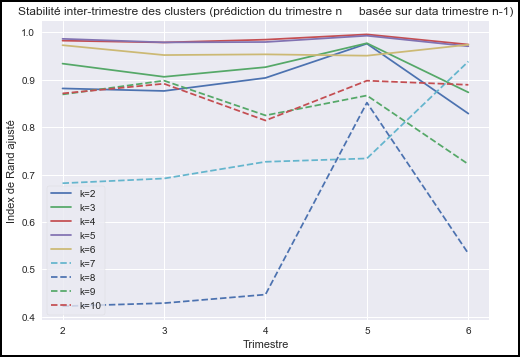

In [78]:
plt.figure(edgecolor='black', linewidth=4)
for k in range(k_min, k_max + 1):
    if k > 6:
        linestyle = 'dashed'
    else:
        linestyle = 'solid'
    plt.plot(range(2, 7), ARIs[2:7, k], linestyle=linestyle)
plt.legend([f'k={str(k)}' for k in range(k_min, k_max + 1)], frameon=True)
plt.xlabel('Trimestre')
plt.xticks([2, 3, 4, 5, 6])
plt.ylabel('Index de Rand ajusté')
plt.title(
    f'Stabilité inter-trimestre des clusters (prédiction du trimestre n \
    basée sur data trimestre n-1)'
)
plt.show()

#### Stabilité des clusters obtenus avec k=2 à 10 (prédiction du trimestre n basée sur data trimestre n-2)

In [79]:
# Prédiction du label des data du trimestre Y avec le modèle de clustering \
#  du trimestre X (avec X = Y-2), pour n_clusters=k
ARIs_2 = np.zeros((7, k_max + 1))
for trim_Y in range(3, 7):
    for k in range(k_min, k_max + 1):
        labels_trim_Y = models[trim_Y][k].labels_
        labels_trim_Y_from_model_trim_X = models[trim_Y - 2][k].predict(
            data_scaled_trim[trim_Y])
        ARIs_2[trim_Y][k] = adjusted_rand_score(
            labels_trim_Y, labels_trim_Y_from_model_trim_X)

In [80]:
ARIs_2

array([[0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.74814552, 0.82631809, 0.96023973, 0.9805056 , 0.96413139, 0.96902229, 0.95374757, 0.97255774, 0.97165834],
       [0.        , 0.        , 0.93789047, 0.95808442, 0.85487889, 0.82243875, 0.78932231, 0.53834431, 0.76609703, 0.87225818, 0.85676835],
       [0.        , 0.        , 0.94746331, 0.95772761, 0.99001904, 0.97867889, 0.95092107, 0.91935226, 0.50196632, 0.75197929, 0.91537405],
       [0.        , 0.        , 0.85524167, 0.89660668, 0.98016244, 0.96651291, 0.92168178, 0.71224961, 0.47245441, 0.80638046, 0.76428529]])

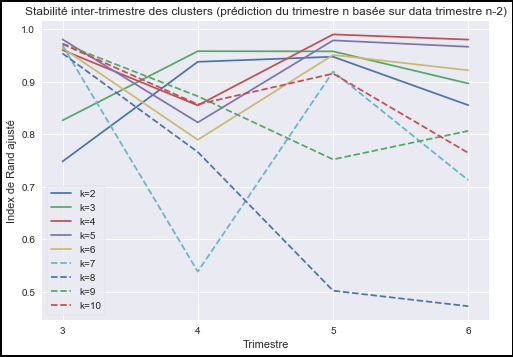

In [81]:
plt.figure(edgecolor='black', linewidth=4)
for k in range(k_min, k_max+1):
    if k > 6:
        linestyle = 'dashed'
    else:
        linestyle = 'solid'
    plt.plot(range(3, 7), ARIs_2[3:7, k], linestyle=linestyle)
plt.legend([f'k={str(k)}' for k in range(k_min, k_max+1)], frameon=True)
plt.xlabel('Trimestre')
plt.xticks([3, 4, 5, 6])
plt.ylabel('Index de Rand ajusté')
plt.title(f'Stabilité inter-trimestre des clusters (prédiction du trimestre \
n basée sur data trimestre n-2)')
plt.show()

#### Stabilité des scores de silhouettes

##### Score = f(trimestre)

In [82]:
# Prédiction du label des data du trimestre Y avec le modèle de clustering \
# du trimestre X, pour n_clusters=k
scores_silhouettes = np.zeros((7, k_max + 1))
for trim_X in range(1, 7):
    for k in range(k_min, k_max + 1):
        scores_silhouettes[trim_X][k] = silhouette_score(
            data_scaled_trim[trim_X], models[trim_X][k].labels_)

In [83]:
scores_silhouettes[1, :]     # 1er trimestre

array([0.        , 0.        , 0.70176295, 0.72022833, 0.4425193 , 0.48572858, 0.49264631, 0.49522215, 0.39260529, 0.40243486, 0.41395448])

In [84]:
scores_silhouettes

array([[0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.70176295, 0.72022833, 0.4425193 , 0.48572858, 0.49264631, 0.49522215, 0.39260529, 0.40243486, 0.41395448],
       [0.        , 0.        , 0.65887279, 0.6825158 , 0.44648288, 0.48019129, 0.48237734, 0.38761121, 0.40486743, 0.40089536, 0.4134025 ],
       [0.        , 0.        , 0.62590602, 0.65029391, 0.45839604, 0.49257159, 0.49384139, 0.49767972, 0.38509435, 0.39846848, 0.41040295],
       [0.        , 0.        , 0.65380235, 0.66970743, 0.42983489, 0.4684753 , 0.47560316, 0.40643367, 0.41329367, 0.38510008, 0.39801314],
       [0.        , 0.        , 0.64696423, 0.66505691, 0.44558169, 0.48519391, 0.48879005, 0.48022817, 0.43660198, 0.40234719, 0.41029826],
       [0.        , 0.        , 0.70694044, 0.7196501 , 0.48543405, 0.51706775, 0.51410059, 0.51453261, 0.41603986, 0.41911345, 0.43635765]])

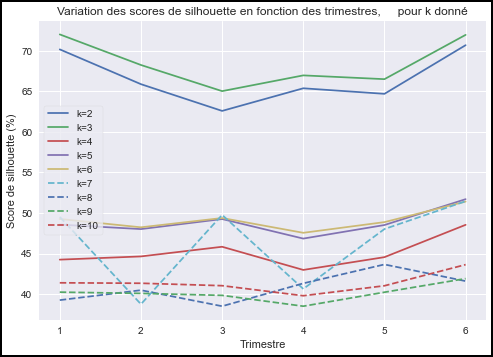

In [85]:
plt.figure(edgecolor='black', linewidth=4)
for k in range(k_min, k_max + 1):
    if k > 6:
        linestyle = 'dashed'
    else:
        linestyle = 'solid'
    plt.plot(range(1, 7),
             100 * scores_silhouettes[1:7, k],
             linestyle=linestyle)
plt.legend([f'k={str(k)}' for k in range(k_min, k_max + 1)],
           frameon=True,
           loc='center left')
plt.xlabel('Trimestre')
plt.xticks([1, 2, 3, 4, 5, 6])
plt.ylabel('Score de silhouette (%)')
plt.title(
    f'Variation des scores de silhouette en fonction des trimestres, \
    pour k donné'
)
plt.show()

##### Score = f(k)

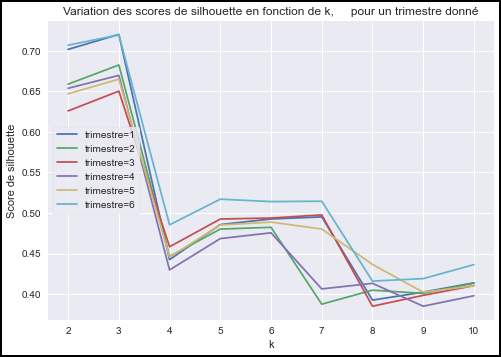

In [86]:
plt.figure(edgecolor='black', linewidth=4)
for trim in range(1, 7):
    plt.plot(range(k_min, k_max + 1), scores_silhouettes[trim,
                                                         k_min:k_max + 1])
plt.legend([f'trimestre={str(trim)}' for trim in range(1, 7)],
           frameon=True,
           loc='center left')
plt.xlabel('k')
plt.xticks(list(range(k_min, k_max + 1)))
plt.ylabel('Score de silhouette')
plt.title(
    f'Variation des scores de silhouette en fonction de k, \
    pour un trimestre donné'
)
plt.show()

#### Comparaison des silhouettes des différents trimestres (k=5 et k=6)

In [87]:
def comparaison_silhouettes(k=6):
    """Trace les silhouettes pour k donné, pour les 6 trimestres
    Args :
    - k : nb de clusters.
    Returns :
    - void
    """
    plt.style.use('seaborn')
    plt.figure(figsize=(11, 9),
               edgecolor='black',
               linewidth=4,
               tight_layout=True)

    for trim_X in range(1, 7):
        plt.subplot(3, 2, trim_X)

        y_pred = models[trim_X][k].labels_
        silhouette_coefficients = silhouette_samples(data_scaled_trim[trim_X],
                                                     y_pred)

        padding = len(data_scaled_trim[trim_X]) // 30
        pos = padding
        ticks = []

        # on trie les clusters du plus petit au plus grand
        taille_clusters = {}
        for i in range(k):
            taille_clusters[i] = len(silhouette_coefficients[y_pred == i])
        taille_clusters = {
            ke: v
            for ke, v in sorted(taille_clusters.items(),
                                key=lambda item: item[1])
        }

        # affichage de chaque cluster
        i_color = 0
        for i in reversed(taille_clusters.keys()):
            coeffs = silhouette_coefficients[y_pred == i]
            coeffs.sort()
            color = mpl.cm.Spectral(i_color / (k - 1))
            i_color += 1
            plt.fill_betweenx(np.arange(pos, pos + len(coeffs)),
                              0,
                              coeffs,
                              facecolor=color,
                              edgecolor=color,
                              alpha=1)
            ticks.append(pos + len(coeffs) // 2)
            pos += len(coeffs) + padding

        plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
        plt.gca().yaxis.set_major_formatter(
            FixedFormatter(list(reversed(taille_clusters.keys()))))
        if trim_X in (1, 3, 5):
            plt.ylabel("Cluster")
        plt.gca().set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])
        if trim_X in (5, 6):
            plt.xlabel("Coefficient de silhouette")
        plt.title(f"Trimestre {trim_X}", fontsize=14)

    plt.show()

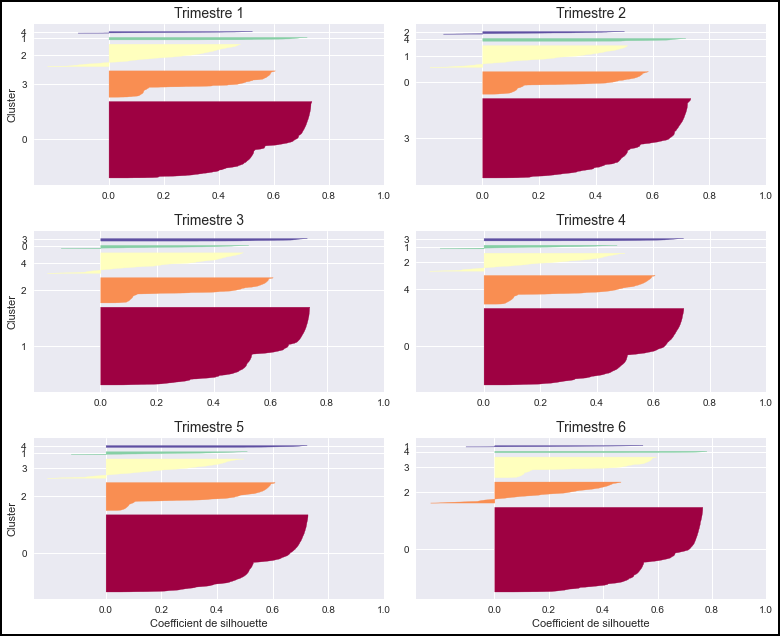

In [88]:
comparaison_silhouettes(k=5)

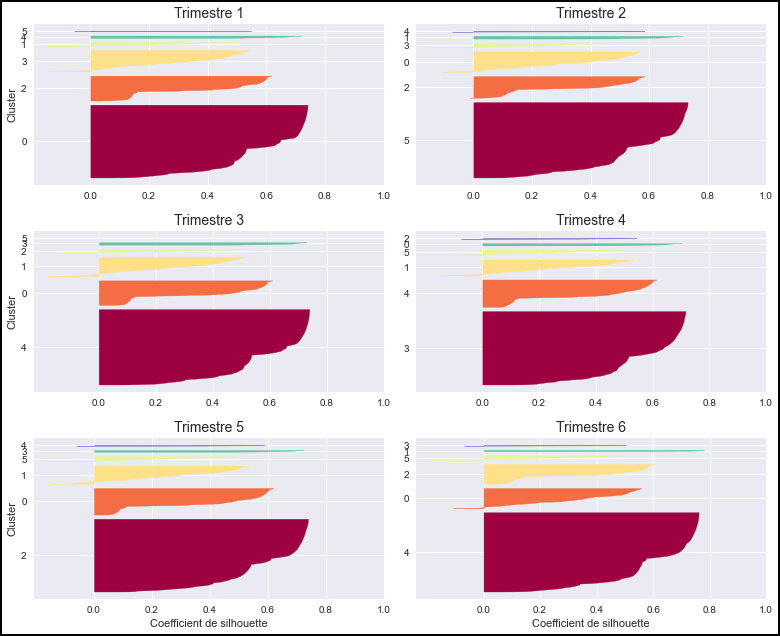

In [89]:
comparaison_silhouettes(k=6)

### Personae

#### Fonction

In [90]:
def personae(trim_X, k):
    """Retourne un dataframe avec les personae. Les lignes sont triées \
    par effectif décroissant.
    Args :
    - trim_X : n° de trimestre.
    - k : nb de clusters.
    Returns :
    - dataframe pandas avec les coordonnées des centre des clusters \
    dans les coordonnées.
    """
    data_trim_X = data_trim[trim_X]
    std_scale_trim_X = preprocessing.StandardScaler().fit(data_trim_X)

    # coordonnées des centres
    cluster_centers_scaled = models[trim_X][k].cluster_centers_
    cluster_centers = std_scale_trim_X.inverse_transform(
        cluster_centers_scaled)
    cluster_centers = pd.DataFrame(
        cluster_centers,
        index=[f'centre_{str(i)}' for i in range(k)],
        columns=data_trim_X.columns)

    # effectifs et fréquences
    effectifs = [(models[trim_X][k].labels_ == i).sum() for i in range(k)]
    cluster_centers['effectif'] = effectifs
    cluster_centers['frequence%'] = cluster_centers['effectif'] / (
        sum(effectifs)) * 100

    # tri par effectif décroissant
    cluster_centers.sort_values('effectif', ascending=False, inplace=True)

    return cluster_centers

#### Calcul de personae

##### Trimestre 1

In [91]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=1, k=2))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.02,137.51,134.97,3.12,4.06,7682,97.31
centre_1,1.02,1358.65,1331.55,7.29,3.89,212,2.69


In [92]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=1, k=3))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,135.37,135.37,3.11,4.06,7533,95.43
centre_1,1.00,1365.74,1347.45,7.29,3.89,207,2.62
centre_2,2.06,272.11,132.82,3.91,4.11,154,1.95


In [93]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=1, k=4))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,134.89,134.89,3.09,4.74,5736,72.66
centre_1,1.00,141.43,141.43,3.21,1.91,1811,22.94
centre_3,1.01,1412.45,1392.83,7.16,3.96,193,2.44
centre_2,2.06,272.11,132.82,3.91,4.11,154,1.95


In [94]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=1, k=5))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,111.19,111.19,1.97,4.74,4669,59.15
centre_3,1.00,122.93,122.93,2.49,1.86,1610,20.40
centre_2,1.00,293.07,293.07,8.09,4.34,1366,17.30
centre_1,2.06,272.11,132.82,3.91,4.11,154,1.95
centre_4,1.01,1947.96,1908.11,6.63,3.56,95,1.20


In [95]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=1, k=6))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,111.32,111.32,1.90,4.74,4575,57.96
centre_2,1.00,121.16,121.16,2.36,1.86,1567,19.85
centre_3,1.00,216.23,216.23,8.04,4.33,1351,17.11
centre_1,1.00,1068.40,1068.40,6.62,3.92,228,2.89
centre_4,2.06,272.11,132.82,3.91,4.11,154,1.95
centre_5,1.05,3556.65,3357.40,7.63,3.68,19,0.24


In [96]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=1, k=7))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_1,1.00,109.26,109.26,1.89,4.74,4543,57.55
centre_3,1.00,119.49,119.49,2.36,1.86,1564,19.81
centre_0,1.00,197.88,197.88,8.04,4.34,1297,16.43
centre_6,1.00,787.95,787.95,6.48,4.06,269,3.41
centre_2,2.06,272.11,132.82,3.91,4.11,154,1.95
centre_5,1.00,1931.05,1931.05,6.42,3.58,60,0.76
centre_4,1.14,4960.42,4419.59,7.71,3.86,7,0.09


##### Trimestre 6

In [97]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=2))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.01,136.51,135.12,2.74,4.26,18510,97.12
centre_1,1.03,1222.38,1186.77,6.67,3.98,548,2.88


In [98]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=3))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,135.31,135.31,2.74,4.26,18299,96.02
centre_1,1.00,1210.28,1198.35,6.77,4.01,534,2.80
centre_2,2.04,330.58,158.37,2.84,4.19,225,1.18


In [99]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=4))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,134.50,134.50,2.70,4.77,15049,78.96
centre_1,1.00,148.93,148.93,2.97,1.93,3312,17.38
centre_3,1.00,1281.58,1268.08,6.71,4.15,472,2.48
centre_2,2.04,330.58,158.37,2.84,4.19,225,1.18


In [100]:
personae_trim_6_k_5 = personae(trim_X=6, k=5)
commentaires = [
    'Client typique (petit montant, peu d\'installments, satisfait)',
    'Client qui paie en un grand nombre de fois (installments = 7.3)',
    'Client insatisfait (review score de 1.9)',
    'Client qui passe plus de 2 ordres durant le trimestre',
    'Client qui a passé une très grosse commande (1860 reals)'
]
personae_trim_6_k_5['commentaire'] = commentaires
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae_trim_6_k_5)

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%,commentaire
centre_0,1.00,112.45,112.45,1.78,4.77,12482,65.49,"Client typique (petit montant, peu d'installments, satisfait)"
centre_2,1.00,296.73,296.73,7.33,4.54,3103,16.28,Client qui paie en un grand nombre de fois (installments = 7.3)
centre_3,1.00,138.48,138.48,2.43,1.87,3046,15.98,Client insatisfait (review score de 1.9)
centre_4,2.04,330.58,158.37,2.84,4.19,225,1.18,Client qui passe plus de 2 ordres durant le trimestre
centre_1,1.01,1861.84,1830.31,6.61,3.93,202,1.06,Client qui a passé une très grosse commande (1860 reals)


In [101]:
personae_trim_6_k_6 = personae(trim_X=6, k=6)
commentaires = [
    'Client typique (petit montant, peu d\'installments, satisfait)',
    'Client qui paie en un grand nombre de fois (installments = 7.1)',
    'Client insatisfait (review score de 1.9)',
    'Client qui a passé une grosse commande (840 reals)',
    'Client qui passe plus de 2 ordres durant le trimestre',
    'Client qui a passé une très grosse commande (2570 reals)',
]
personae_trim_6_k_6['cluster'] = ['A', 'B', 'C', 'D', 'E', 'F']
personae_trim_6_k_6['commentaire'] = commentaires

print("TABLEAU POUR COMPARAISON AVEC clustering hiérarchique agglomératif :")
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae_trim_6_k_6)

TABLEAU POUR COMPARAISON AVEC clustering hiérarchique agglomératif :


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%,cluster,commentaire
centre_4,1.00,111.96,111.96,1.67,4.77,12038,63.17,A,"Client typique (petit montant, peu d'installments, satisfait)"
centre_0,1.00,198.65,198.65,7.15,4.62,3044,15.97,B,Client qui paie en un grand nombre de fois (installments = 7.1)
centre_2,1.00,133.37,133.37,2.44,1.87,3010,15.79,C,Client insatisfait (review score de 1.9)
centre_5,1.00,835.43,835.43,5.96,4.13,655,3.44,D,Client qui a passé une grosse commande (840 reals)
centre_1,2.04,330.58,158.37,2.84,4.19,225,1.18,E,Client qui passe plus de 2 ordres durant le trimestre
centre_3,1.02,2570.97,2496.91,6.87,3.77,86,0.45,F,Client qui a passé une très grosse commande (2570 reals)


In [102]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=7))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,110.36,110.36,1.67,4.77,11996,62.94
centre_1,1.00,131.15,131.15,2.43,1.87,2994,15.71
centre_5,1.00,186.32,186.32,7.17,4.63,2908,15.26
centre_3,1.00,688.41,688.41,5.76,4.17,769,4.04
centre_2,2.04,330.58,158.37,2.84,4.19,225,1.18
centre_6,1.00,1809.44,1809.44,6.73,3.99,157,0.82
centre_4,1.22,5599.79,4892.16,4.67,3.11,9,0.05


In [103]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=8))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_1,1.00,110.52,110.52,1.66,5.00,9244,48.50
centre_7,1.00,113.59,113.59,1.78,3.72,3858,20.24
centre_4,1.00,185.04,185.04,7.20,4.64,2870,15.06
centre_0,1.00,140.59,140.59,2.74,1.23,1935,10.15
centre_2,1.00,690.54,690.54,5.75,4.21,760,3.99
centre_3,2.04,330.58,158.37,2.84,4.19,225,1.18
centre_6,1.00,1809.44,1809.44,6.73,3.99,157,0.82
centre_5,1.22,5599.79,4892.16,4.67,3.11,9,0.05


In [104]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=9))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,101.96,101.96,1.35,5.00,7906,41.48
centre_8,1.00,109.40,109.40,1.61,3.70,3572,18.74
centre_6,1.00,164.66,164.66,4.47,4.79,3070,16.11
centre_2,1.00,138.66,138.66,2.55,1.23,1884,9.89
centre_4,1.00,220.40,220.40,8.89,4.41,1572,8.25
centre_1,1.00,736.23,736.23,5.58,4.19,682,3.58
centre_5,2.04,330.58,158.37,2.84,4.19,225,1.18
centre_3,1.00,1881.42,1881.42,6.86,3.91,138,0.72
centre_7,1.22,5599.79,4892.16,4.67,3.11,9,0.05


In [105]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(personae(trim_X=6, k=10))

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_7,1.00,94.07,94.07,1.21,5.00,7014,36.80
centre_8,1.00,100.15,100.15,1.63,3.70,3456,18.13
centre_0,1.00,125.95,125.95,4.23,4.84,3245,17.03
centre_3,1.00,141.17,141.17,2.66,1.23,1917,10.06
centre_4,1.00,232.83,232.83,8.73,4.47,1671,8.77
centre_2,1.00,408.50,408.50,2.42,4.63,1003,5.26
centre_6,1.00,917.29,917.29,6.96,4.01,422,2.21
centre_1,2.04,330.58,158.37,2.84,4.19,225,1.18
centre_9,1.00,2091.25,2091.25,7.25,3.79,96,0.50
centre_5,1.22,5599.79,4892.16,4.67,3.11,9,0.05


Note : pour k=3 à k=10, on obtient exactement le même cluster (coordonnées et effectif) pour la persona "plus de 2 ordres par trimestre". Mais pas pour k=2.  

##### Comparaisons k=5

In [106]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    for trim in range(7):
        print(f"---------- Trimestre {trim} : ----------")
        display(personae(trim_X=trim, k=5))

---------- Trimestre 0 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,110.53,110.71,1.84,4.74,56898,61.04
centre_2,1.00,128.51,128.75,2.27,1.83,18316,19.65
centre_1,1.00,252.35,252.19,7.79,4.31,14459,15.51
centre_3,1.01,1284.10,1270.12,6.31,3.79,1965,2.11
centre_4,2.05,296.49,141.82,3.33,4.03,1578,1.69


---------- Trimestre 1 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,111.19,111.19,1.97,4.74,4669,59.15
centre_3,1.00,122.93,122.93,2.49,1.86,1610,20.40
centre_2,1.00,293.07,293.07,8.09,4.34,1366,17.30
centre_1,2.06,272.11,132.82,3.91,4.11,154,1.95
centre_4,1.01,1947.96,1908.11,6.63,3.56,95,1.20


---------- Trimestre 2 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_3,1.00,104.17,104.17,2.07,4.75,6724,61.49
centre_0,1.00,120.22,120.22,2.65,1.90,1907,17.44
centre_1,1.00,244.26,244.26,8.03,4.45,1845,16.87
centre_4,2.05,255.35,124.31,3.98,4.07,241,2.20
centre_2,1.01,1183.19,1170.21,5.64,3.90,219,2.00


---------- Trimestre 3 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_1,1.00,114.20,114.20,1.88,4.74,8759,60.16
centre_2,1.00,132.52,132.52,2.31,1.82,2848,19.56
centre_4,1.00,252.93,252.93,7.92,4.34,2311,15.87
centre_0,1.01,1295.61,1281.04,6.49,3.95,356,2.45
centre_3,2.06,278.01,134.87,3.32,4.09,286,1.96


---------- Trimestre 4 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,108.02,108.02,1.78,4.74,11899,59.25
centre_4,1.00,122.62,122.62,2.08,1.79,4453,22.17
centre_2,1.00,219.02,219.02,7.81,4.13,2794,13.91
centre_1,1.01,941.04,936.63,6.05,3.45,566,2.82
centre_3,2.06,288.81,141.34,3.34,3.90,372,1.85


---------- Trimestre 5 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,112.16,112.16,1.78,4.74,12351,59.71
centre_2,1.00,131.84,131.84,2.16,1.77,4481,21.66
centre_3,1.00,259.60,259.60,7.64,4.16,3080,14.89
centre_1,1.00,1238.76,1233.85,6.49,3.75,472,2.28
centre_4,2.07,313.52,151.48,3.02,3.93,300,1.45


---------- Trimestre 6 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,112.45,112.45,1.78,4.77,12482,65.49
centre_2,1.00,296.73,296.73,7.33,4.54,3103,16.28
centre_3,1.00,138.48,138.48,2.43,1.87,3046,15.98
centre_4,2.04,330.58,158.37,2.84,4.19,225,1.18
centre_1,1.01,1861.84,1830.31,6.61,3.93,202,1.06


On observe que l'on retrouve les mêmes segmentations mois après mois. Les valeurs des personae (et leur fréquence) diffèrent 
d'un trimestre à l'autre, mais les personae restent identiques.

##### Comparaisons k=6

In [107]:
with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    for trim in range(1, 7):
        print(f"---------- Trimestre {trim} : ----------")
        display(personae(trim_X=trim, k=6))

---------- Trimestre 1 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_0,1.00,111.32,111.32,1.90,4.74,4575,57.96
centre_2,1.00,121.16,121.16,2.36,1.86,1567,19.85
centre_3,1.00,216.23,216.23,8.04,4.33,1351,17.11
centre_1,1.00,1068.40,1068.40,6.62,3.92,228,2.89
centre_4,2.06,272.11,132.82,3.91,4.11,154,1.95
centre_5,1.05,3556.65,3357.40,7.63,3.68,19,0.24


---------- Trimestre 2 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_5,1.00,103.10,103.10,2.00,4.75,6566,60.04
centre_2,1.00,116.84,116.84,2.71,1.90,1901,17.38
centre_0,1.00,196.86,196.86,7.97,4.52,1780,16.28
centre_3,1.00,726.31,724.26,5.62,4.16,397,3.63
centre_1,2.05,255.35,124.31,3.98,4.07,241,2.20
centre_4,1.02,1993.84,1954.10,6.25,3.16,51,0.47


---------- Trimestre 3 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_4,1.00,113.48,113.48,1.88,4.74,8742,6.00e+01
centre_0,1.00,132.51,132.51,2.32,1.82,2851,1.96e+01
centre_1,1.00,245.16,245.16,7.91,4.35,2280,1.57e+01
centre_2,1.01,1202.66,1189.69,6.45,3.95,400,2.75e+00
centre_3,2.06,278.01,134.87,3.32,4.09,286,1.96e+00
centre_5,1.00,13664.08,13664.08,1.00,1.00,1,6.87e-03


---------- Trimestre 4 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_3,1.00,104.37,104.37,1.78,4.74,11742,58.46
centre_4,1.00,119.04,119.04,2.06,1.79,4391,21.86
centre_1,1.00,186.98,186.98,7.92,4.15,2526,12.58
centre_5,1.00,586.32,586.32,5.19,3.68,913,4.55
centre_0,2.06,291.91,142.90,3.36,3.90,373,1.86
centre_2,1.01,1572.70,1559.93,7.39,3.32,139,0.69


---------- Trimestre 5 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_2,1.00,109.64,109.64,1.70,4.74,11985,57.94
centre_0,1.00,126.19,126.19,2.13,1.76,4393,21.24
centre_1,1.00,196.75,196.75,7.36,4.24,2989,14.45
centre_5,1.00,735.93,735.93,6.31,3.74,892,4.31
centre_3,2.07,313.52,151.48,3.02,3.93,300,1.45
centre_4,1.02,1979.65,1961.09,6.84,3.83,125,0.60


---------- Trimestre 6 : ----------


,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%
centre_4,1.00,111.96,111.96,1.67,4.77,12038,63.17
centre_0,1.00,198.65,198.65,7.15,4.62,3044,15.97
centre_2,1.00,133.37,133.37,2.44,1.87,3010,15.79
centre_5,1.00,835.43,835.43,5.96,4.13,655,3.44
centre_1,2.04,330.58,158.37,2.84,4.19,225,1.18
centre_3,1.02,2570.97,2496.91,6.87,3.77,86,0.45


On observe que l'on retrouve les mêmes segmentations trimestre après trimestre.  
Les valeurs des personae (et leur fréquence) diffèrent d'un trimestre à l'autre, mais les personae restent identiques.

## Clustering hiérarchique agglomératif

### Dendrogrammes

#### Dendrogramme pour l'union des données (trimestres 1 à 6)

Le dendrogramme complet ne peut être calculé (pas assez de RAM, complexité algo ~O(n²) en RAM et en CPU). On se contente de le calculer sur 40% des données.

In [108]:
linkage_matrix = linkage(data_trim[0].sample(frac=0.4, random_state=None),
                         method='ward')

{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [25.0, 25.0, 35.0, 35.0],
  [10.0, 10.0, 30.0, 30.0],
  [45.0, 45.0, 55.0, 55.0],
  [65.0, 65.0, 75.0, 75.0],
  [50.0, 50.0, 70.0, 70.0],
  [20.0, 20.0, 60.0, 60.0],
  [85.0, 85.0, 95.0, 95.0],
  [105.0, 105.0, 115.0, 115.0],
  [90.0, 90.0, 110.0, 110.0],
  [125.0, 125.0, 135.0, 135.0],
  [145.0, 145.0, 155.0, 155.0],
  [130.0, 130.0, 150.0, 150.0],
  [100.0, 100.0, 140.0, 140.0],
  [40.0, 40.0, 120.0, 120.0]],
 'dcoord': [[0.0, 1381.6211797905098, 1381.6211797905098, 0.0],
  [0.0, 2850.681713421916, 2850.681713421916, 0.0],
  [1381.6211797905098,
   5382.6621389158845,
   5382.6621389158845,
   2850.681713421916],
  [0.0, 2711.97370243836, 2711.97370243836, 0.0],
  [0.0, 4427.608314823063, 4427.608314823063, 0.0],
  [2711.97370243836, 9210.255173691758, 9210.255173691758, 4427.608314823063],
  [5382.6621389158845,
   19201.16643144647,
   19201.16643144647,
   9210.255173691758],
  [0.0, 8282.839592389028, 8282.839592389028, 0.0],
  [0.0, 13456.38

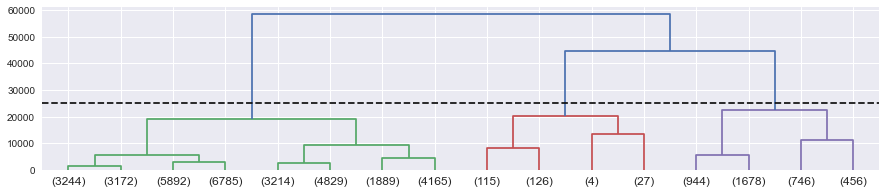

In [109]:
plt.figure(figsize=(15, 3), edgecolor='black')
plt.axhline(25000, c='k', linestyle='--')
dendrogram(linkage_matrix, orientation='top', p=3, truncate_mode='level')

En faisant varier le random_state pour l'échantillonnage, on observe que l'on obtient des dendrogrammes très différents => les clusters ne sont pas fiables.

#### Dendrogramme pour chaque trimestre

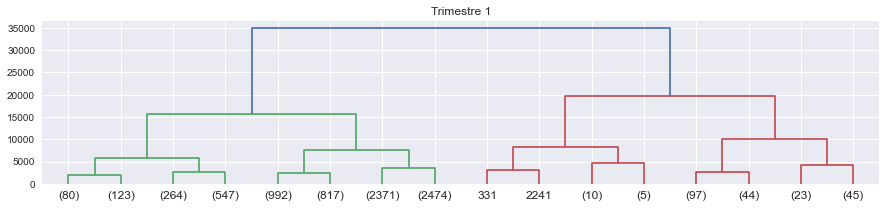

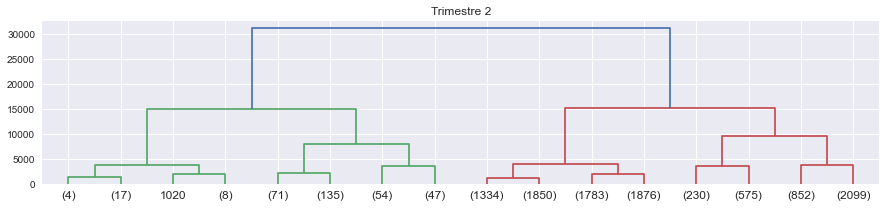

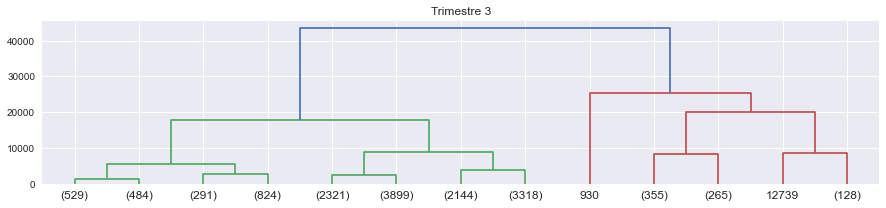

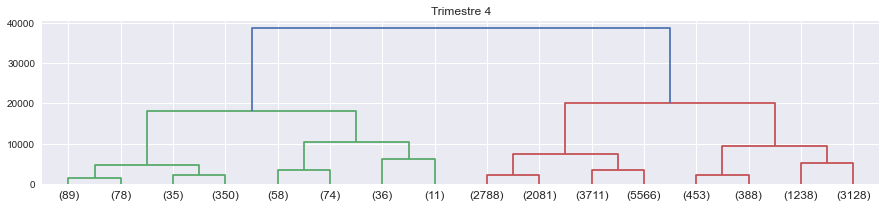

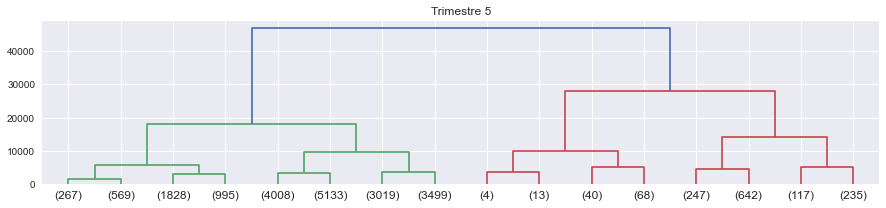

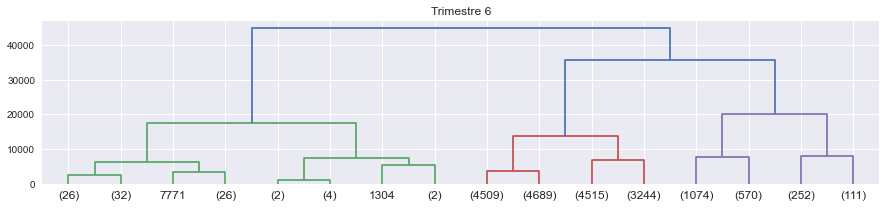

In [110]:
for trim in range(1, 7):
    linkage_matrix = linkage(data_trim[trim], method='ward')
    plt.figure(figsize=(15, 3), edgecolor='black')
    plt.title("Trimestre " + str(trim))
    dendrogram(linkage_matrix, orientation='top', p=3, truncate_mode='level')

### Pair plots des clients

#### Fonction affichage_pairplot_clustagglo()

In [111]:
def affichage_pairplot_clustagglo(n_clusters, data_trim_X):
    """ Affiche les joint plots et les labels (issus du clustering 
    agglomératif hiérarchique) pour diverses variables.
    Args : 
    - n_clusters : nb de clusters.
    - data_trim_X : dataframe pandas converti.
    Returns : void (tracé matplotlib).

    Note : il y a un message d'erreur récurrent "Dataset has 0 variance; 
    skipping density estimate".
    Il se produit lorsque toutes les valeurs d'une variable pour un label 
    donné sont identiques. Ca évite un pic de Dirac.
    """

    data_trim_X = data_trim_X.copy()

    data_scaled_trim_X = preprocessing.StandardScaler().fit_transform(
        data_trim_X)
    labels = fclusterdata(data_scaled_trim_X,
                          t=n_clusters,
                          criterion='maxclust',
                          method='ward')

    # calcul de l'effectif
    bincounts = list(np.bincount(labels))
    #     print(bincounts)

    # tri des clusters par taille
    taille_clusters = {}
    for i in range(1, n_clusters + 1):
        taille_clusters[i] = bincounts[i]
    taille_clusters = {
        k: v
        for k, v in sorted(
            taille_clusters.items(), key=lambda item: item[1], reverse=True)
    }
    print("Effectifs des clusters :")
    zipped = zip([chr(65 + i) for i in range(len(taille_clusters.values()))],
                 taille_clusters.values())
    print([(i, j) for i, j in zipped])

    # remplacement des labels numériques par des labels alphabétiques
    ser_labels = pd.Series(labels, index=data_trim_X.index)
    ser_labels.replace(
        [i for i in taille_clusters.keys()],
        [chr(65 + i) for i in range(len(taille_clusters.keys()))],
        inplace=True
    )  # taille_clusters.keys() contient les labels triés à rempacer

    # Finalisation du dataframe
    data_trim_X['Cluster'] = ser_labels
    # il faut retrier le dataframe dans l'ordre des labels (1, 2, 3, ...)  \
    # pour que la légende ('A', 'B', 'C', ...) du tracé soit dans le bon ordre
    data_trim_X.sort_values(by='Cluster', inplace=True)

    # affichage du pairplot
    plt.style.use('seaborn')
    palette_full = [
        "yellow", "orange", "red", "green", "tab:blue", "black", "pink"
    ]
    palette = palette_full[:n_clusters]
    warnings.simplefilter(action='ignore', category=UserWarning)
    pp = sns.pairplot(data_trim_X,
                      hue='Cluster',
                      palette=palette,
                      plot_kws={
                          "s": 20,
                          'alpha': 0.4
                      })
    warnings.simplefilter(action='default', category=UserWarning)
    pp.axes[1, 1].set_xlim(-100, 5000)  # montant total
    pp.axes[1, 1].set_ylim(-100, 5000)  # montant total
    pp.axes[2, 2].set_xlim(-100, 5000)  # montant moyen
    pp.axes[2, 2].set_ylim(-100, 5000)  # montant moyen
    pp.axes[3, 3].set_xlim(-0.5, 20.5)  # installments
    pp.axes[3, 3].set_ylim(-0.5, 20.5)  # installments
    pp.axes[4, 4].set_xlim(0.5, 5.5)  # review_score
    pp.axes[4, 4].set_ylim(0.5, 5.5)  # review_score
    plt.show()

Effectifs des clusters :
[('A', 4337), ('B', 2266), ('C', 906), ('D', 209), ('E', 154), ('F', 22)]


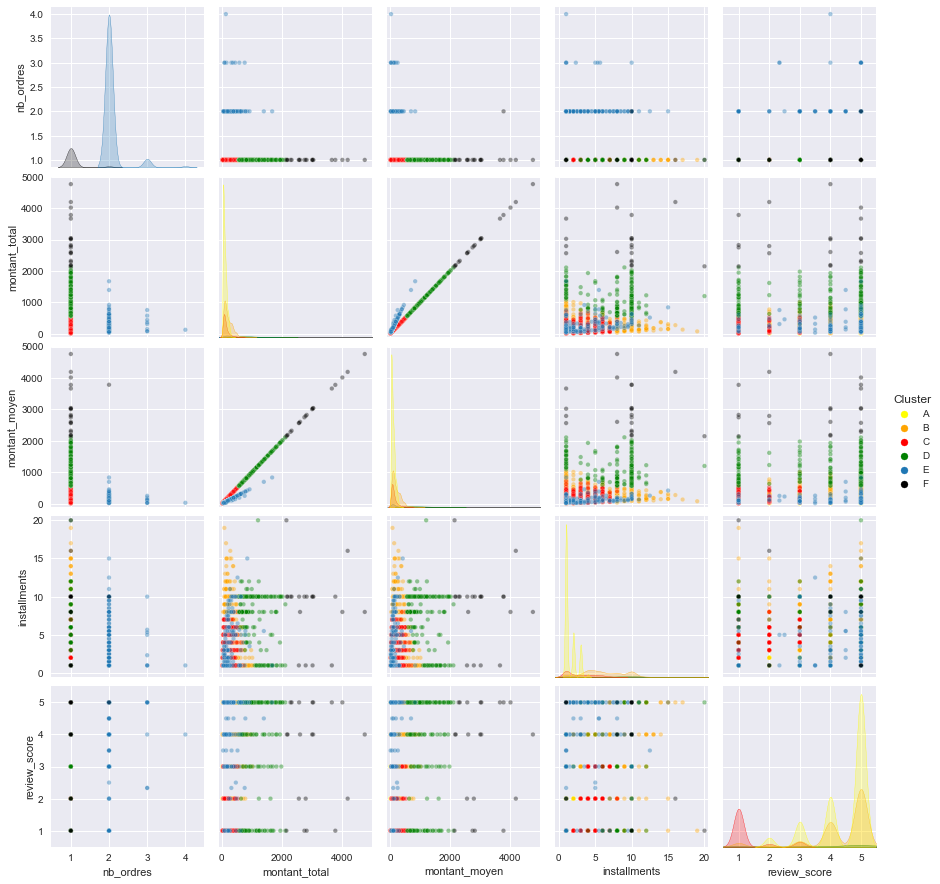

In [112]:
# test unitaire (pour développement)
affichage_pairplot_clustagglo(6, data_trim[1])

#### n_clusters = 4, trimestres 1 à 6

---------------------- Trimestre 1 ----------------------
Effectifs des clusters :
[('A', 6603), ('B', 906), ('C', 231), ('D', 154)]


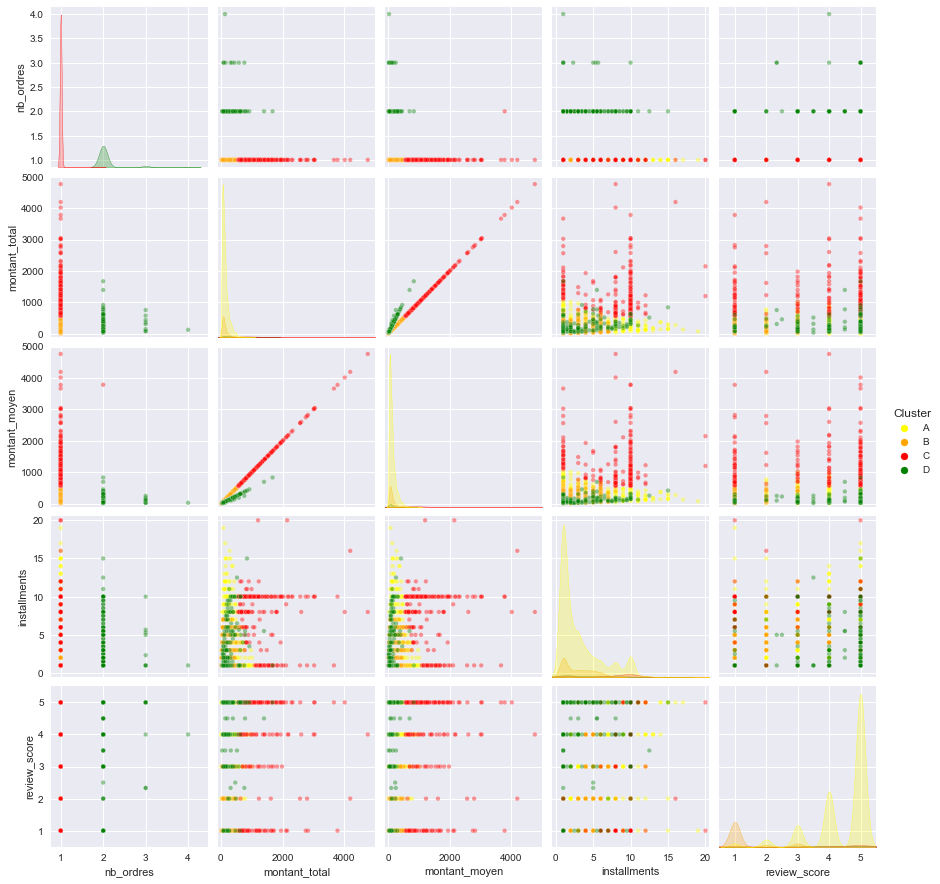

---------------------- Trimestre 2 ----------------------
Effectifs des clusters :
[('A', 9158), ('B', 1105), ('C', 431), ('D', 242)]


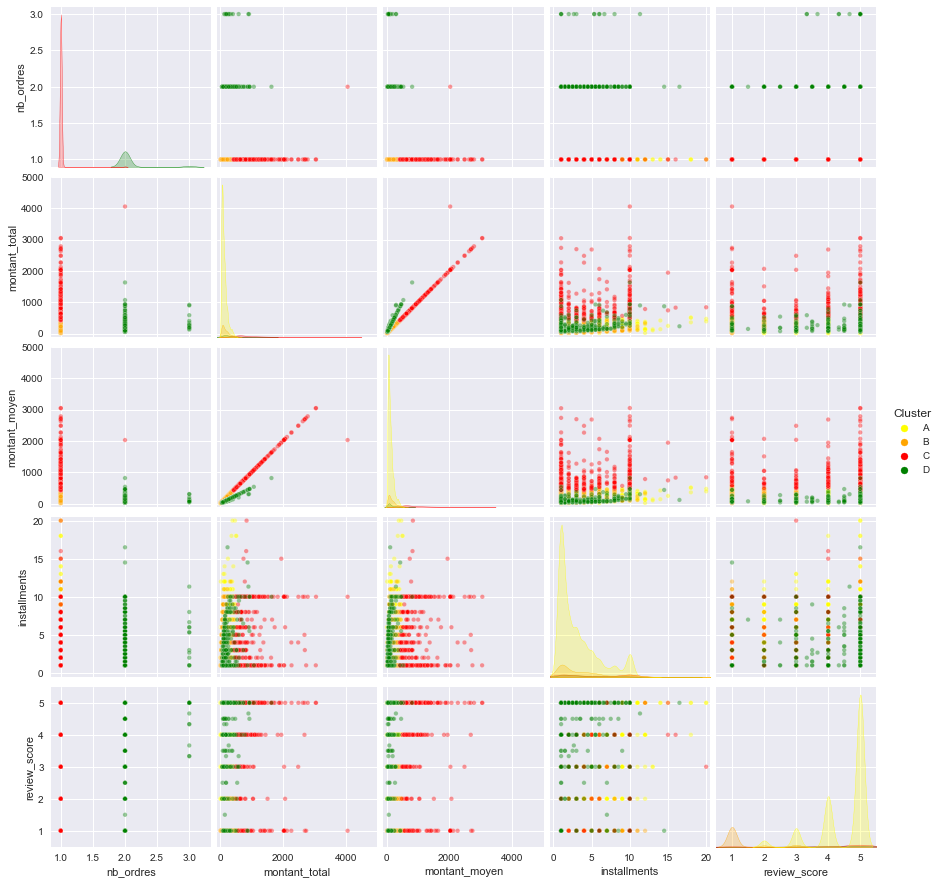

---------------------- Trimestre 3 ----------------------
Effectifs des clusters :
[('A', 12121), ('B', 1602), ('C', 551), ('D', 286)]


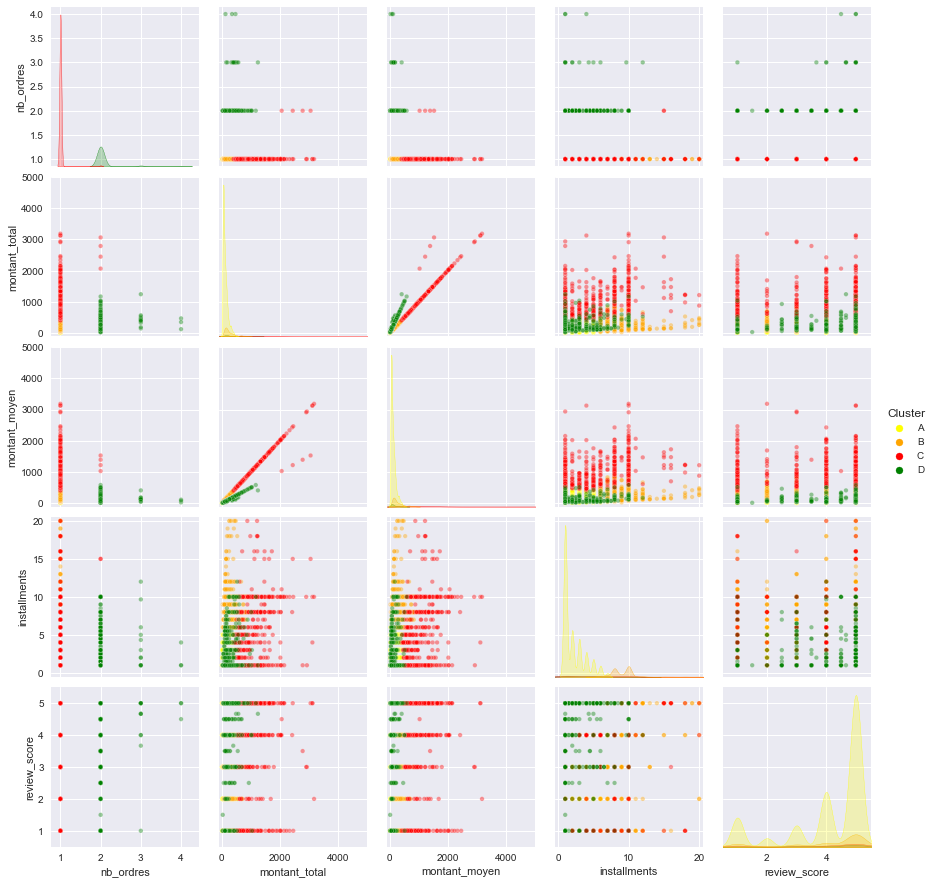

---------------------- Trimestre 4 ----------------------
Effectifs des clusters :
[('A', 14303), ('B', 4744), ('C', 662), ('D', 375)]


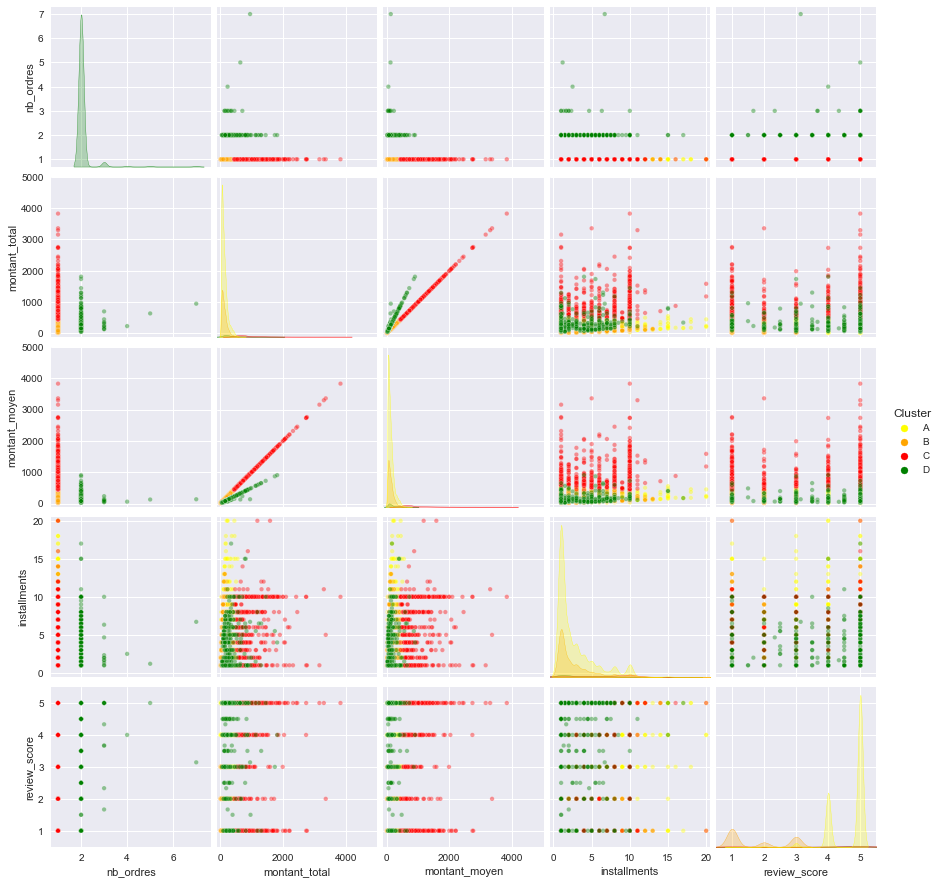

---------------------- Trimestre 5 ----------------------
Effectifs des clusters :
[('A', 16841), ('B', 2795), ('C', 746), ('D', 302)]


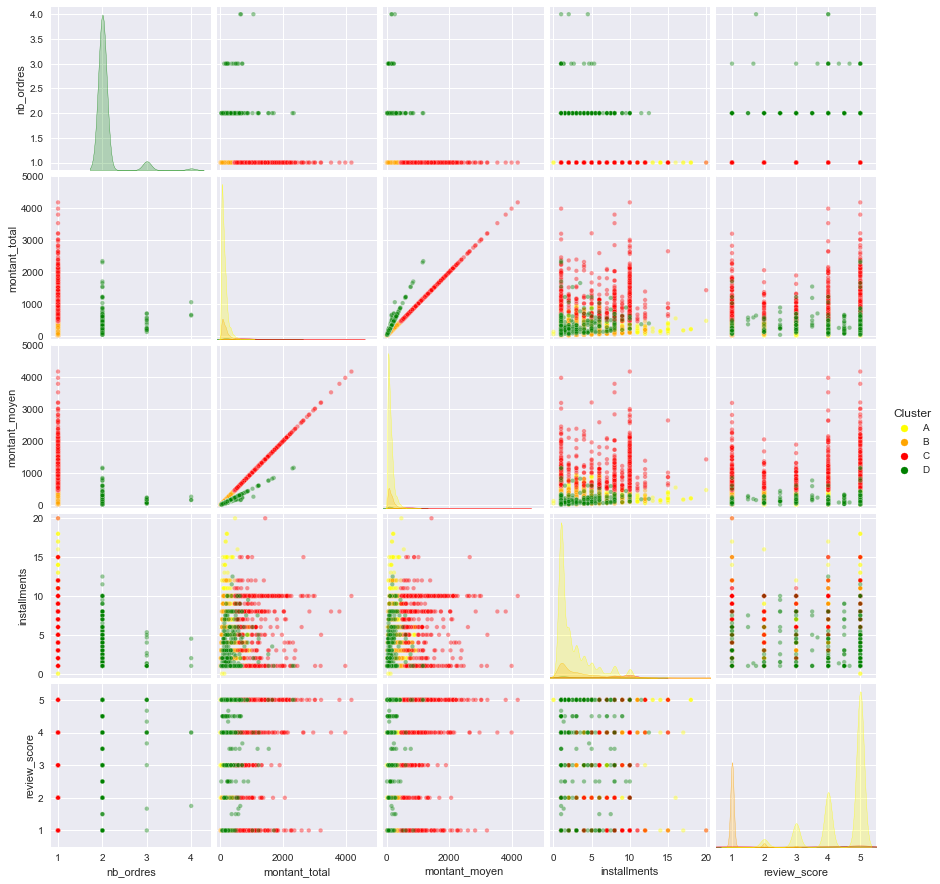

---------------------- Trimestre 6 ----------------------
Effectifs des clusters :
[('A', 16847), ('B', 1777), ('C', 224), ('D', 210)]


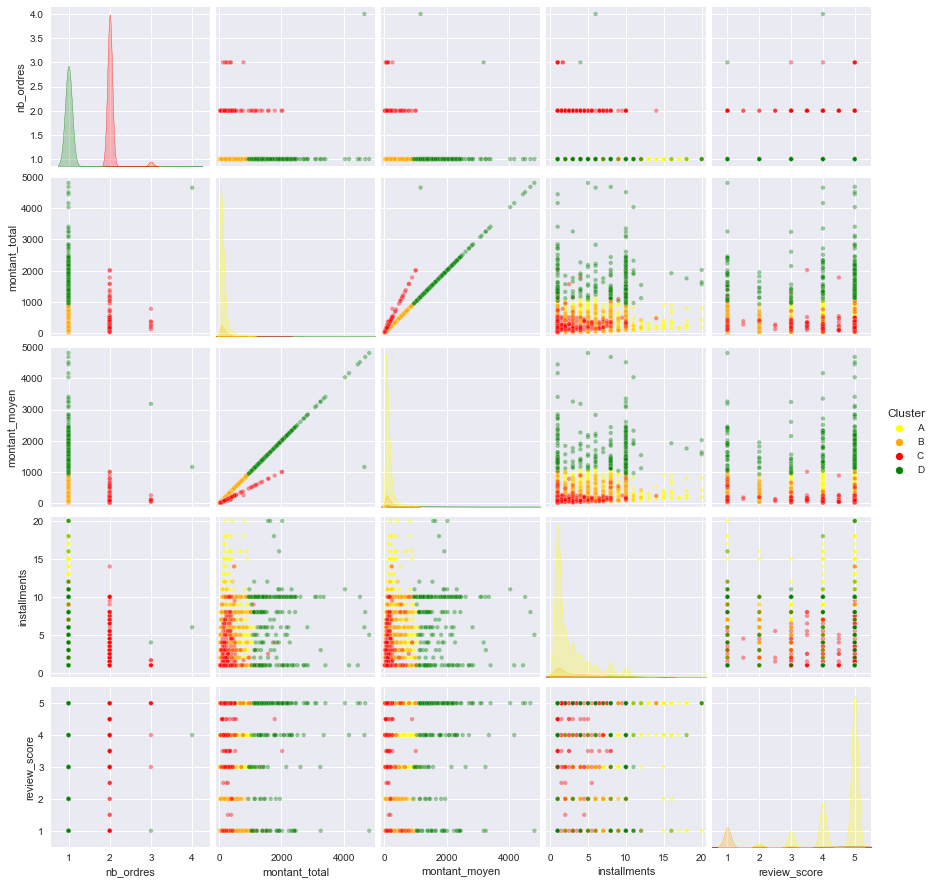

In [113]:
for trim in range(1, 7):
    print(f"---------------------- Trimestre {trim} ----------------------")
    affichage_pairplot_clustagglo(n_clusters=4, data_trim_X=data_trim[trim])

#### n_clusters = 5, trimestres 1 à 6

---------------------- Trimestre 1 ----------------------
Effectifs des clusters :
[('A', 4337), ('B', 2266), ('C', 906), ('D', 231), ('E', 154)]


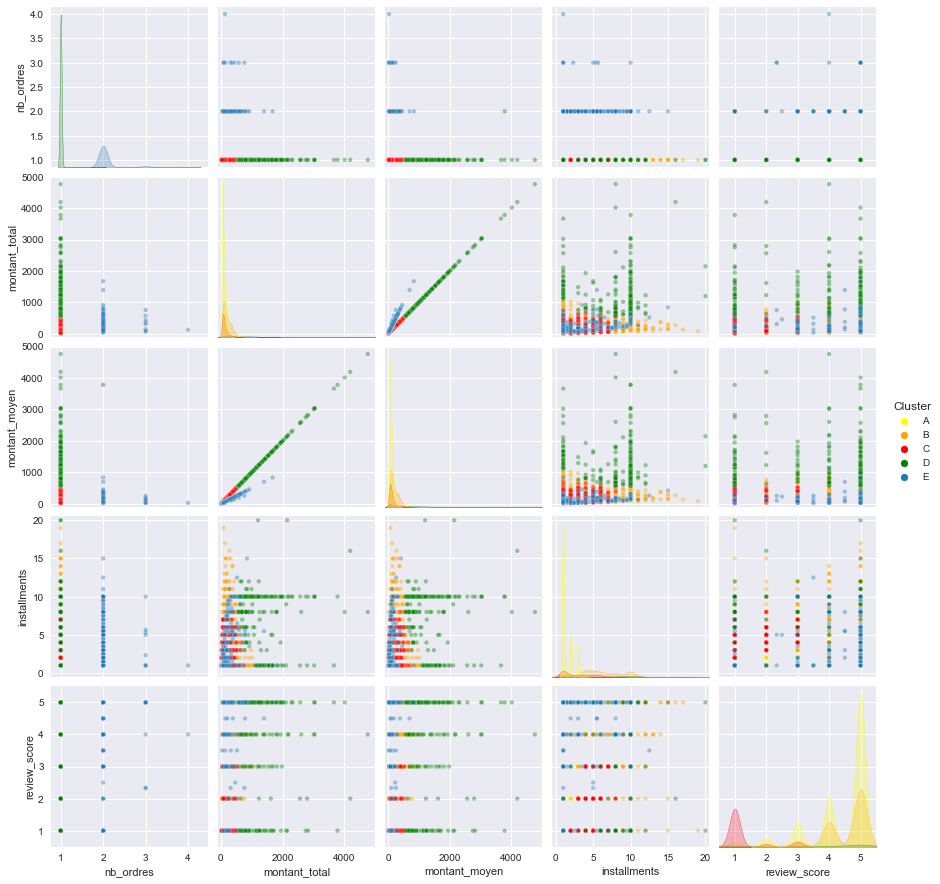

---------------------- Trimestre 2 ----------------------
Effectifs des clusters :
[('A', 6255), ('B', 2903), ('C', 1105), ('D', 431), ('E', 242)]


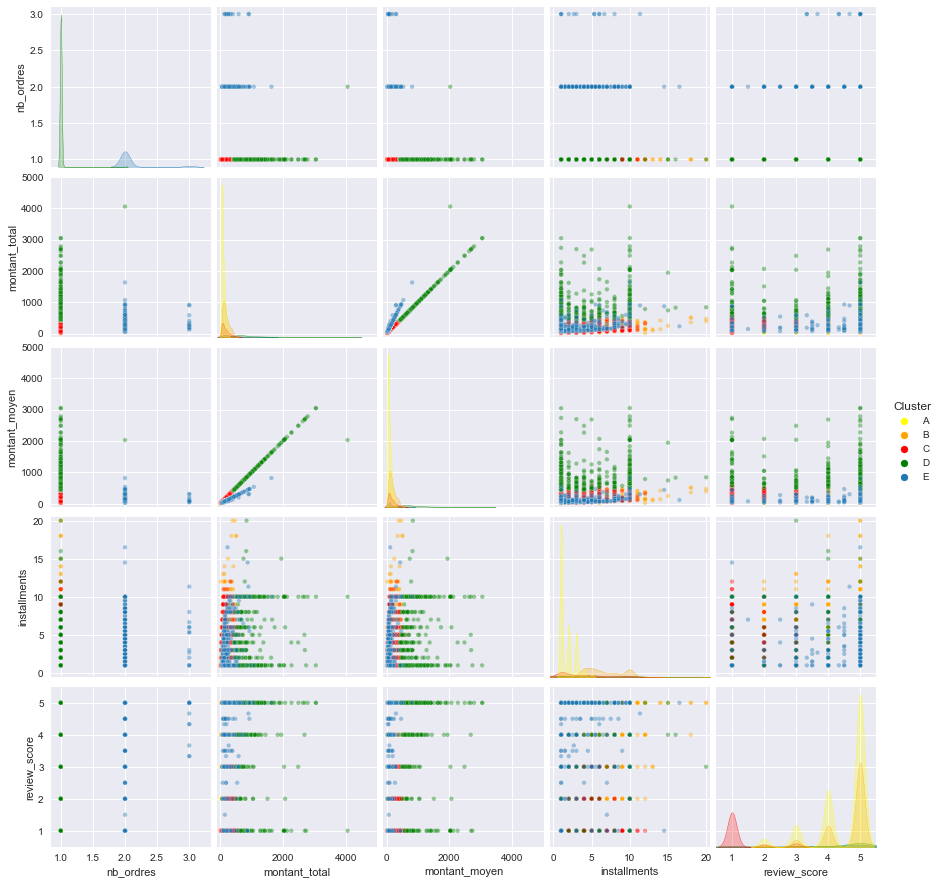

---------------------- Trimestre 3 ----------------------
Effectifs des clusters :
[('A', 10600), ('B', 1602), ('C', 1521), ('D', 551), ('E', 286)]


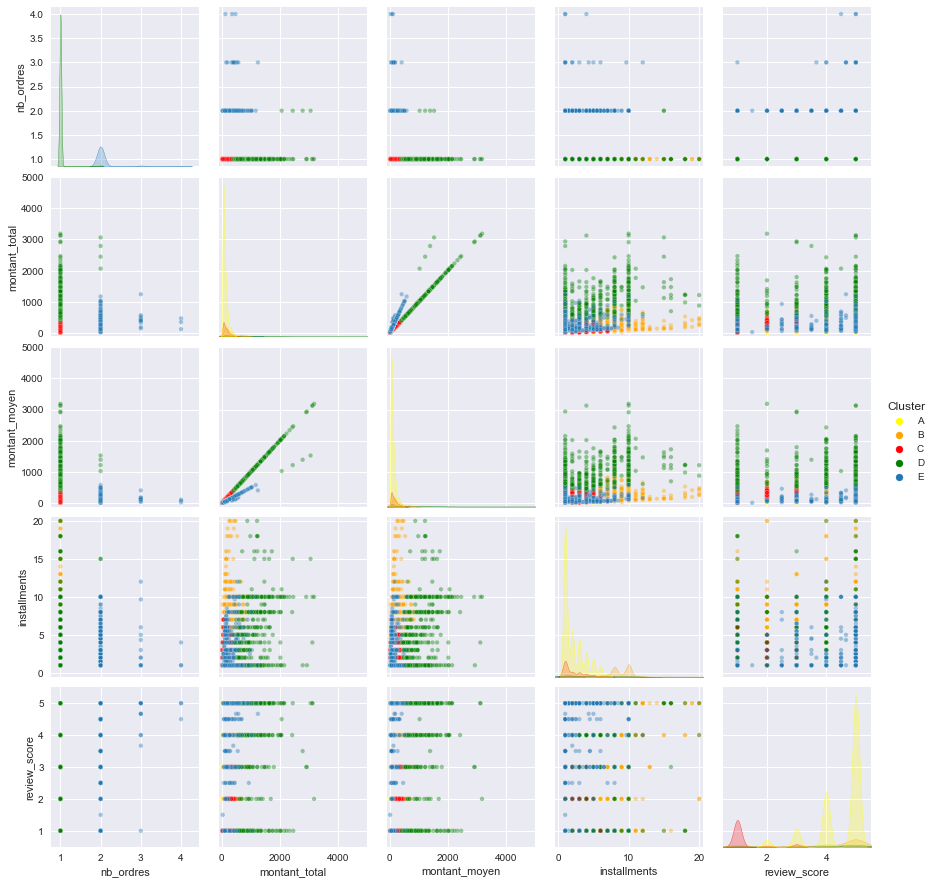

---------------------- Trimestre 4 ----------------------
Effectifs des clusters :
[('A', 12894), ('B', 4744), ('C', 1409), ('D', 662), ('E', 375)]


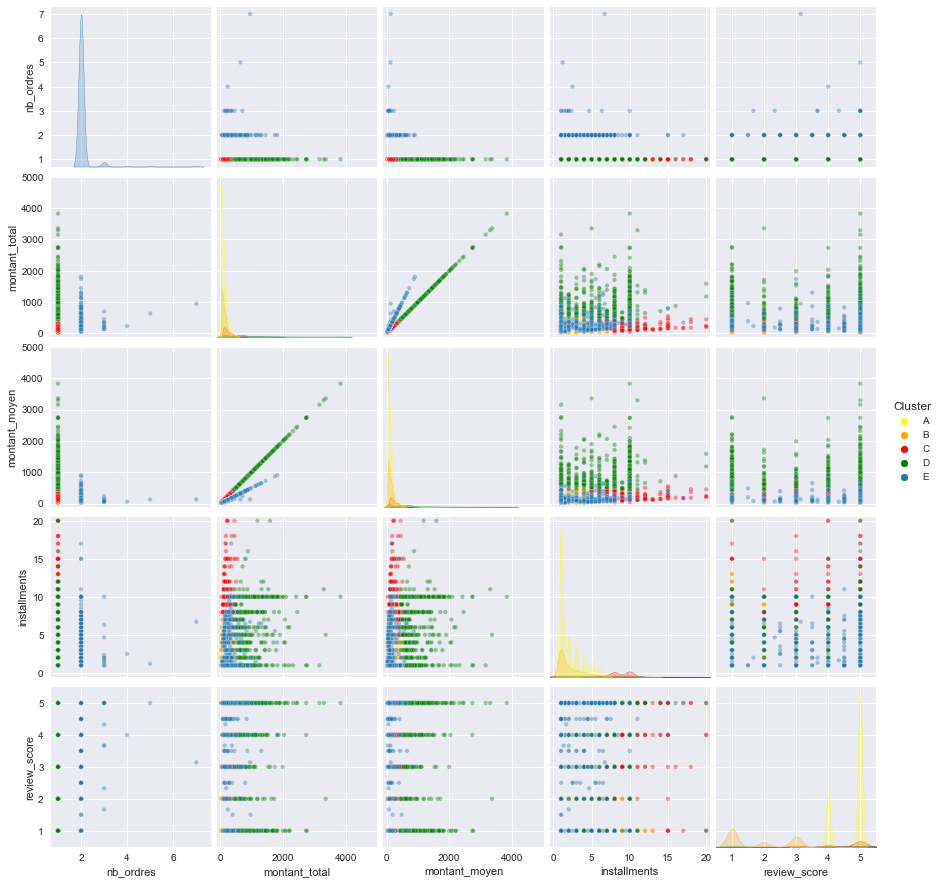

---------------------- Trimestre 5 ----------------------
Effectifs des clusters :
[('A', 13577), ('B', 3264), ('C', 2795), ('D', 746), ('E', 302)]


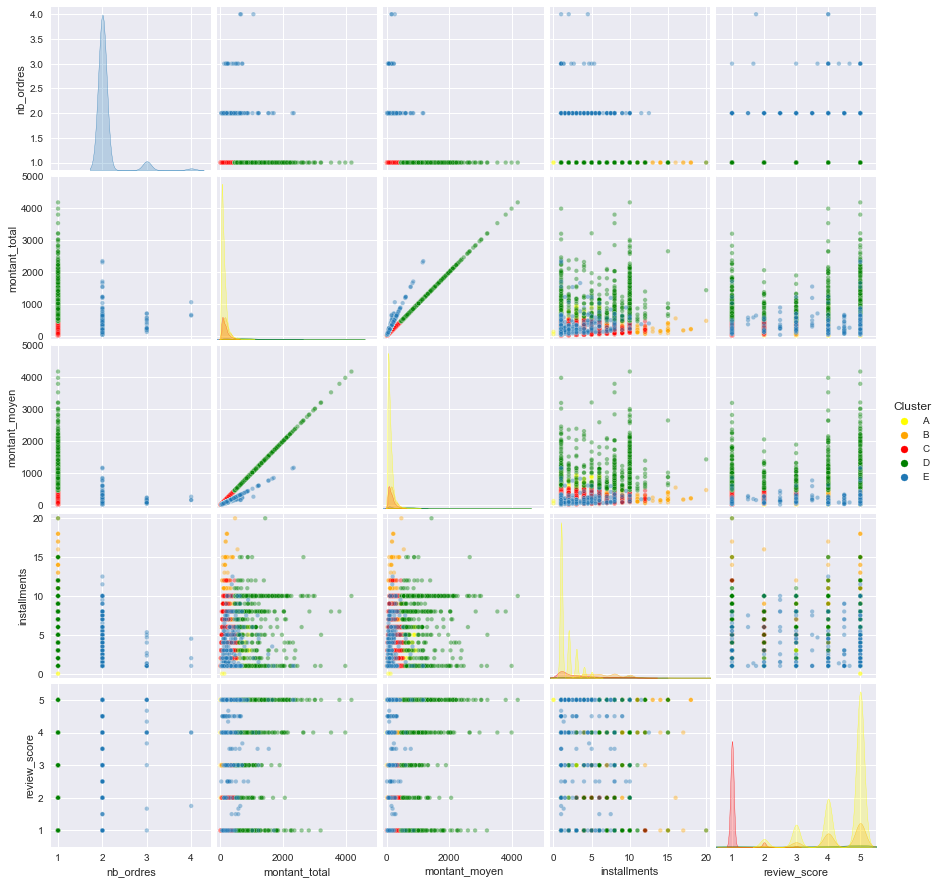

---------------------- Trimestre 6 ----------------------
Effectifs des clusters :
[('A', 12139), ('B', 4708), ('C', 1777), ('D', 224), ('E', 210)]


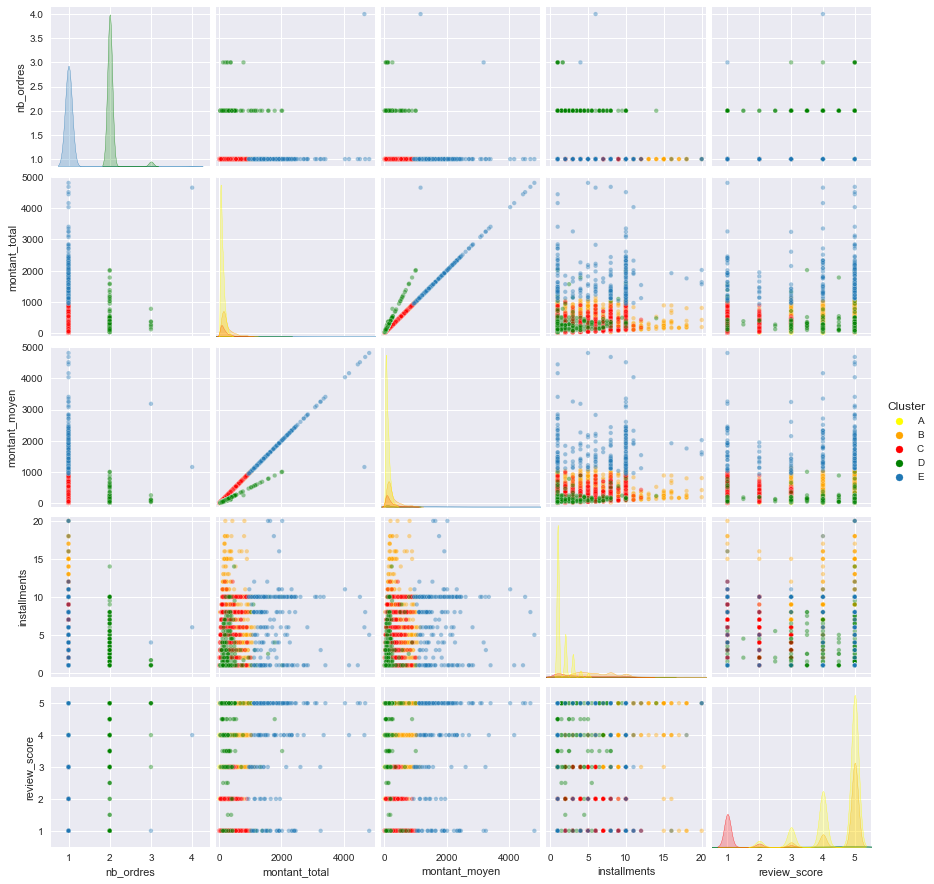

In [114]:
for trim in range(1, 7):
    print(f"---------------------- Trimestre {trim} ----------------------")
    affichage_pairplot_clustagglo(n_clusters=5, data_trim_X=data_trim[trim])

#### n_clusters = 6, trimestres 1 à 6

---------------------- Trimestre 1 ----------------------
Effectifs des clusters :
[('A', 4337), ('B', 2266), ('C', 906), ('D', 209), ('E', 154), ('F', 22)]


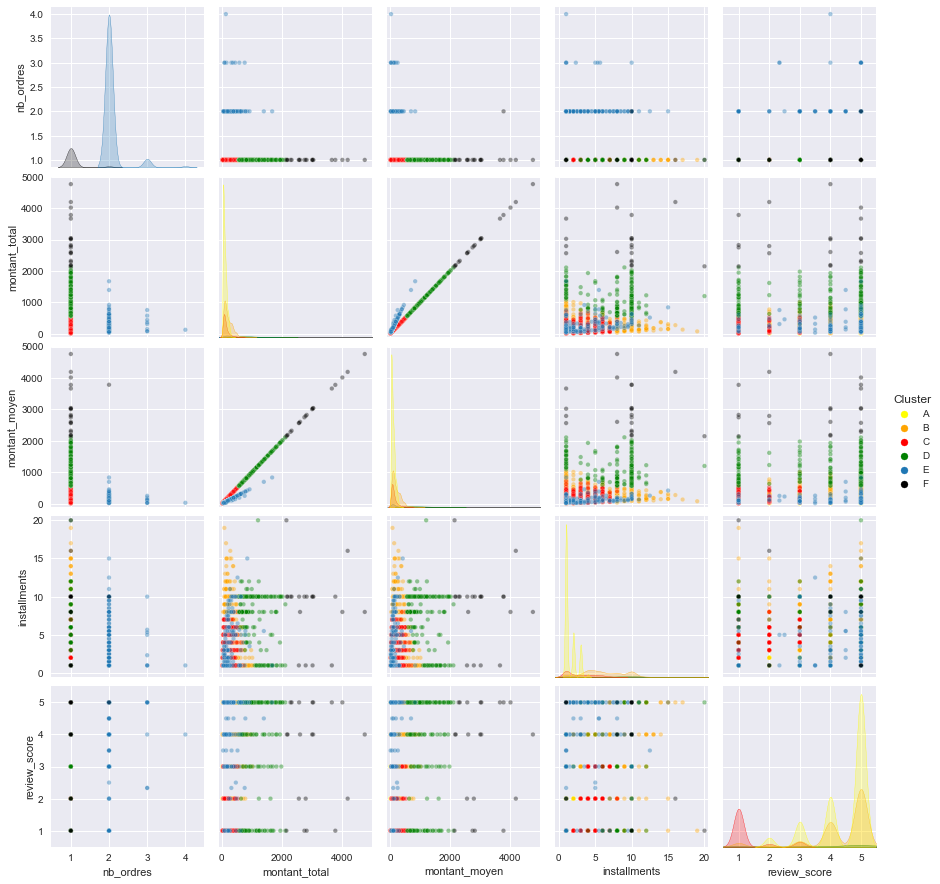

---------------------- Trimestre 2 ----------------------
Effectifs des clusters :
[('A', 6255), ('B', 2903), ('C', 1105), ('D', 395), ('E', 242), ('F', 36)]


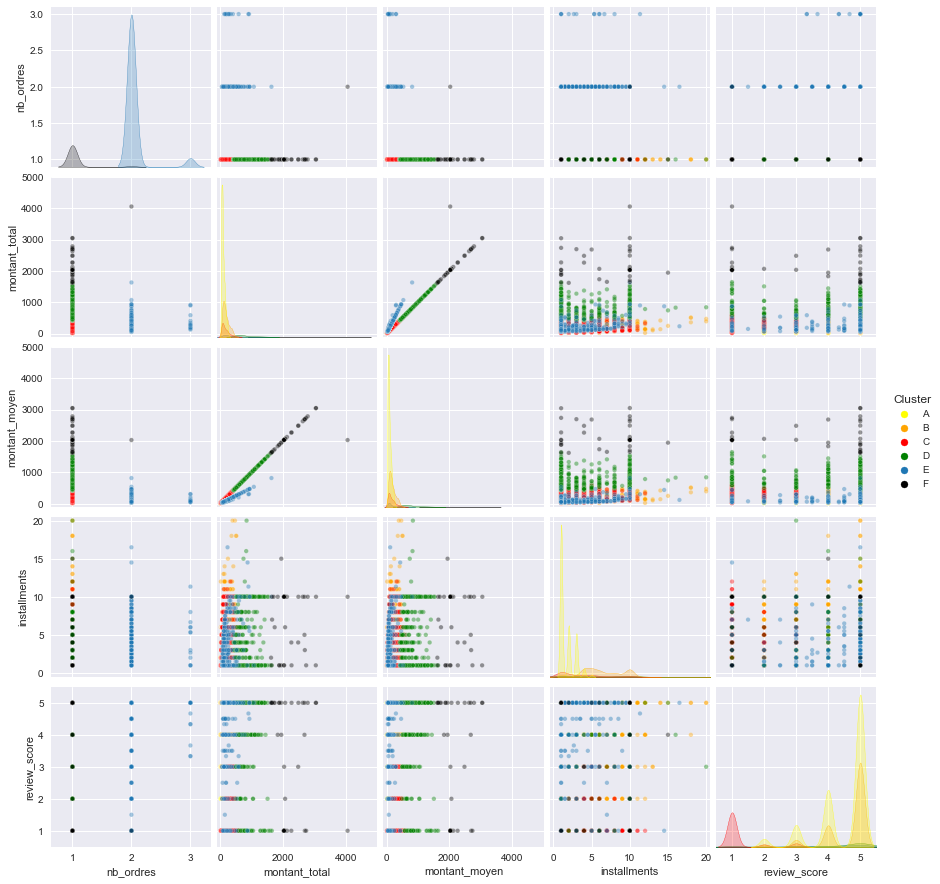

---------------------- Trimestre 3 ----------------------
Effectifs des clusters :
[('A', 10600), ('B', 1602), ('C', 1521), ('D', 550), ('E', 286), ('F', 1)]


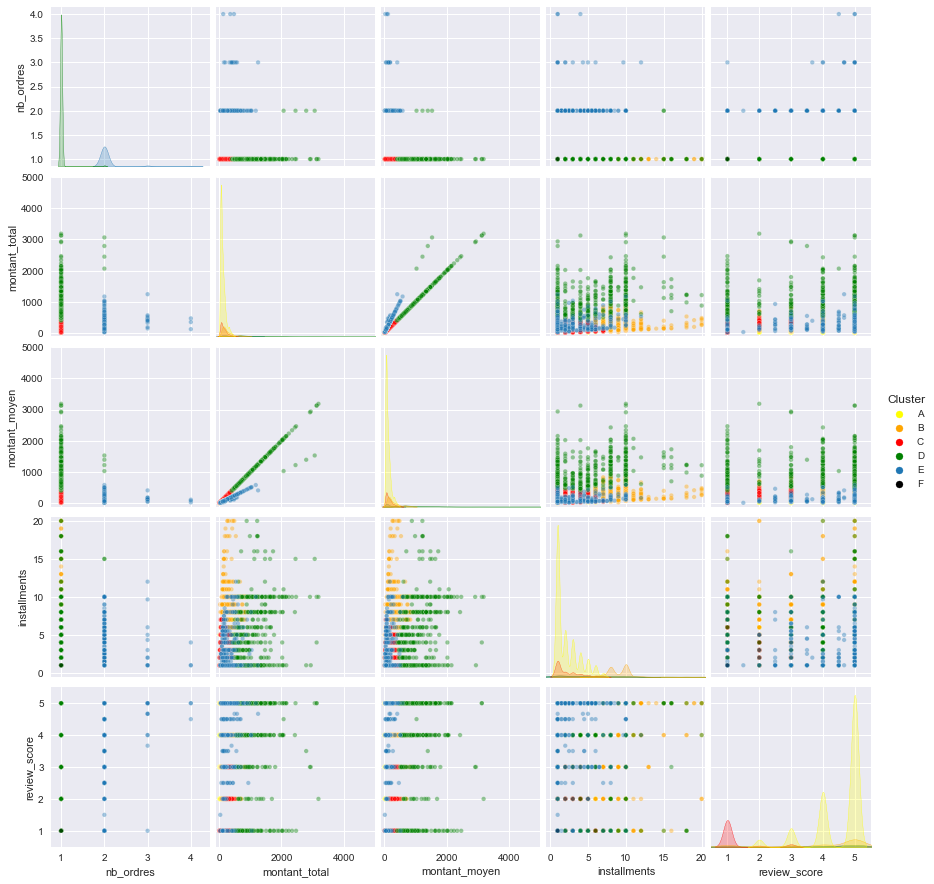

---------------------- Trimestre 4 ----------------------
Effectifs des clusters :
[('A', 12894), ('B', 4744), ('C', 1409), ('D', 552), ('E', 375), ('F', 110)]


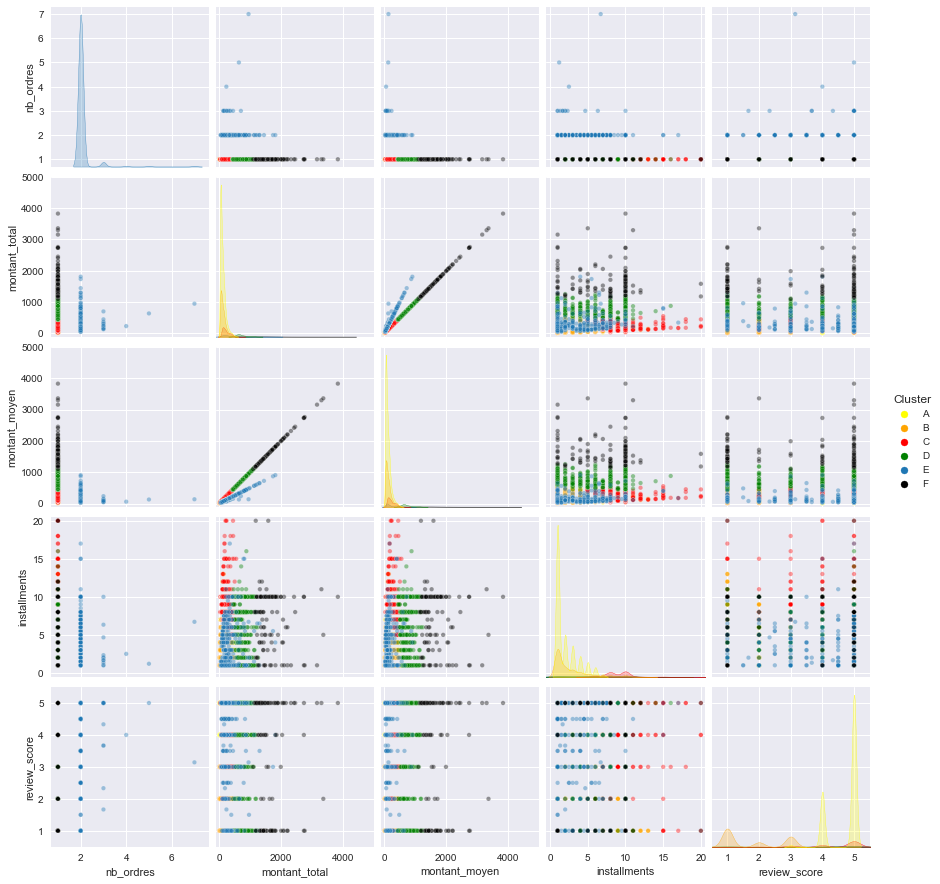

---------------------- Trimestre 5 ----------------------
Effectifs des clusters :
[('A', 13577), ('B', 3264), ('C', 2795), ('D', 668), ('E', 302), ('F', 78)]


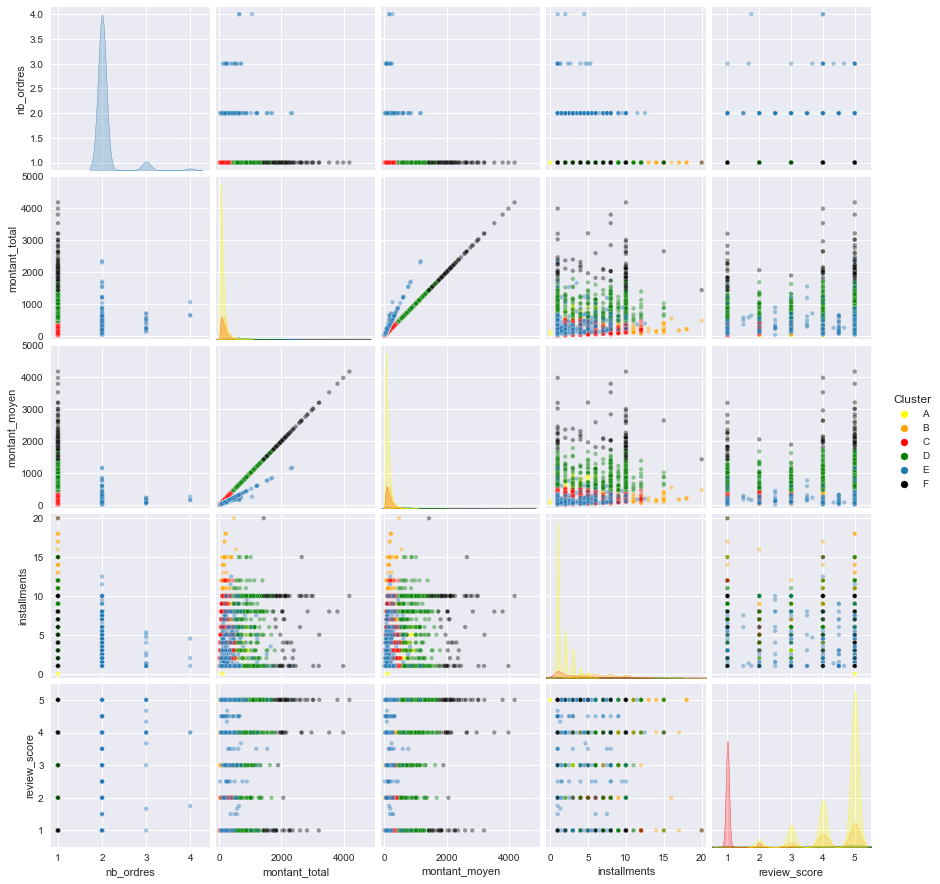

---------------------- Trimestre 6 ----------------------
Effectifs des clusters :
[('A', 12139), ('B', 3853), ('C', 1777), ('D', 855), ('E', 224), ('F', 210)]


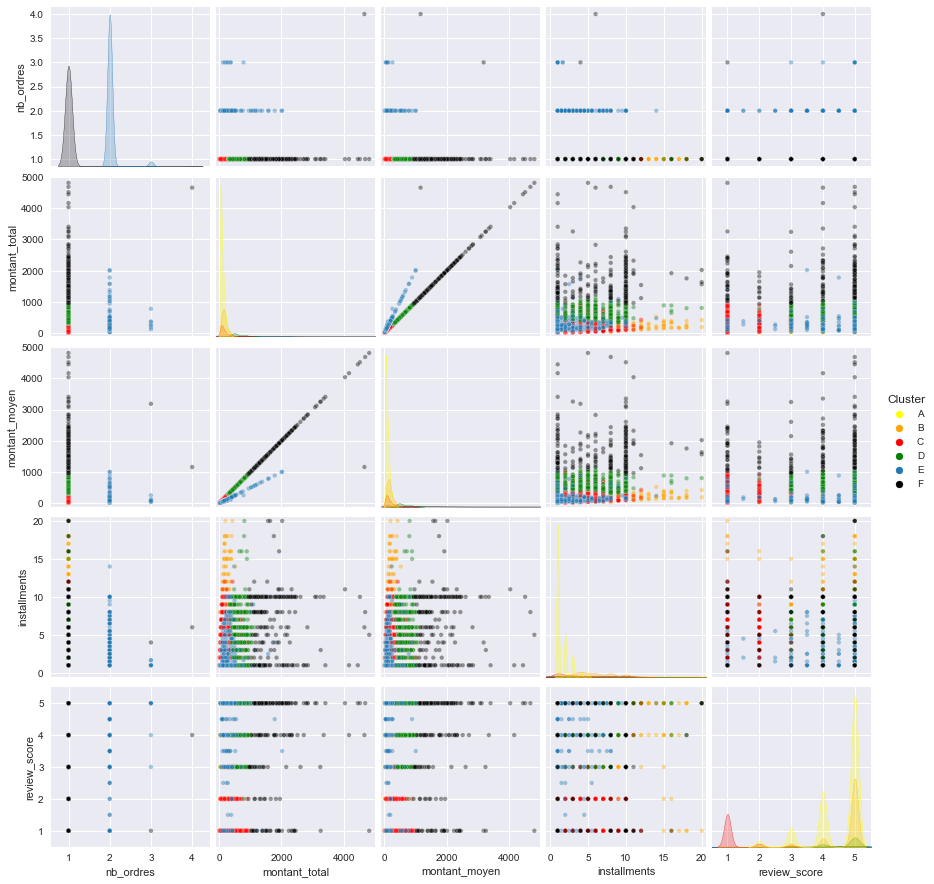

In [115]:
for trim in range(1, 7):
    print(f"---------------------- Trimestre {trim} ----------------------")
    affichage_pairplot_clustagglo(n_clusters=6, data_trim_X=data_trim[trim])

#### n_clusters = 7, trimestres 1 à 6

---------------------- Trimestre 1 ----------------------
Effectifs des clusters :
[('A', 4337), ('B', 1655), ('C', 906), ('D', 611), ('E', 209), ('F', 154), ('G', 22)]


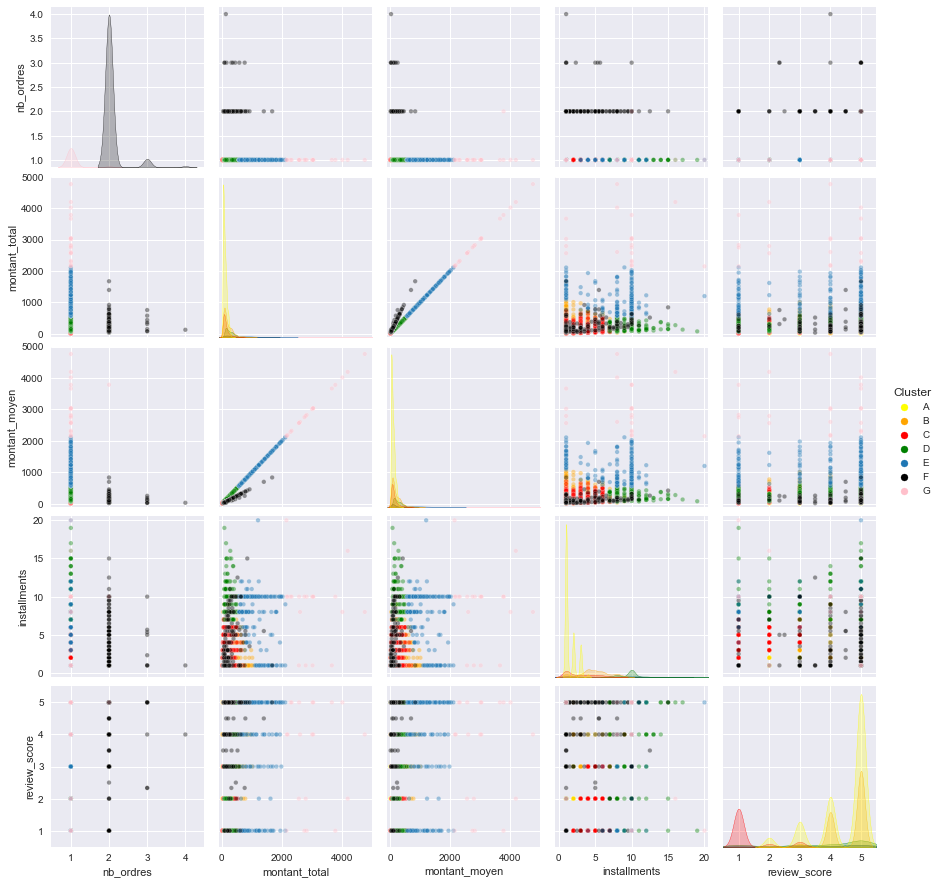

---------------------- Trimestre 2 ----------------------
Effectifs des clusters :
[('A', 3982), ('B', 2903), ('C', 2273), ('D', 1105), ('E', 395), ('F', 242), ('G', 36)]


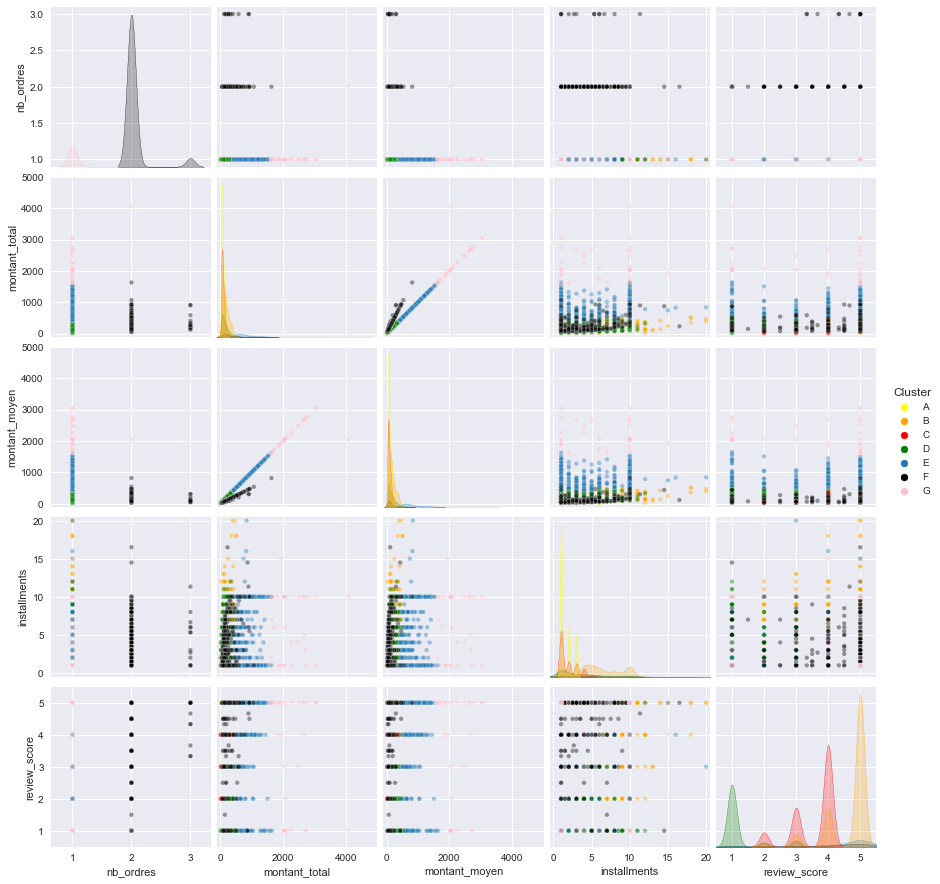

---------------------- Trimestre 3 ----------------------
Effectifs des clusters :
[('A', 10600), ('B', 1602), ('C', 1521), ('D', 340), ('E', 286), ('F', 210), ('G', 1)]


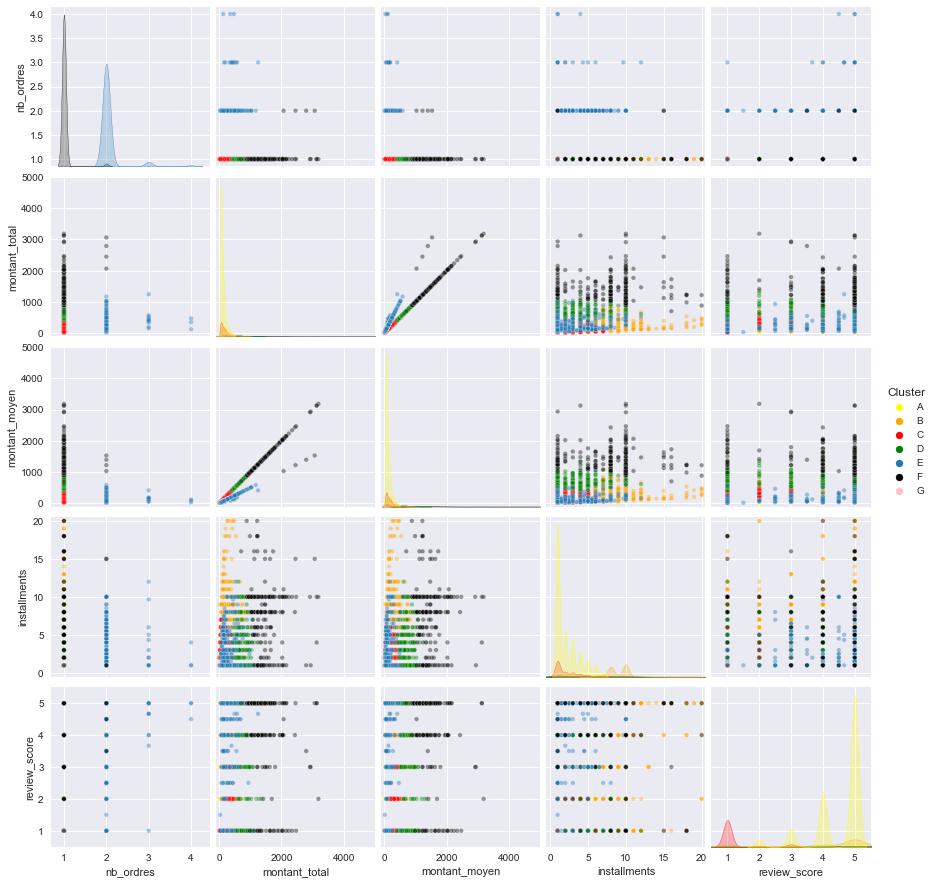

---------------------- Trimestre 4 ----------------------
Effectifs des clusters :
[('A', 10964), ('B', 4744), ('C', 1930), ('D', 1409), ('E', 552), ('F', 375), ('G', 110)]


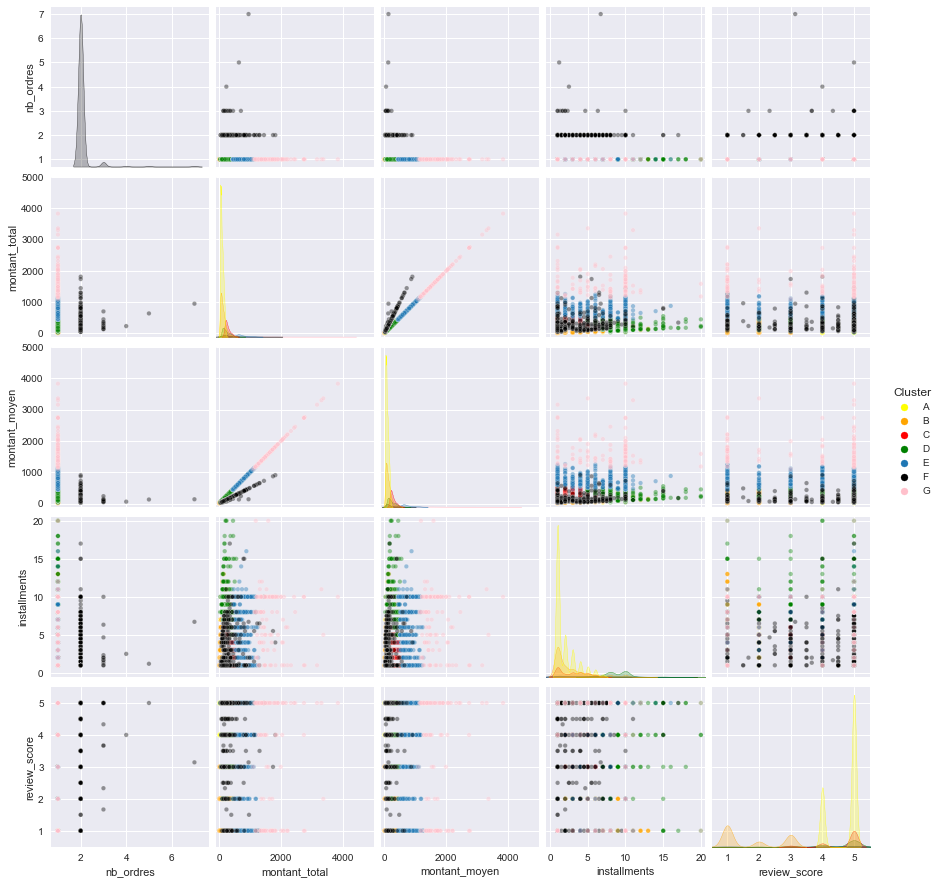

---------------------- Trimestre 5 ----------------------
Effectifs des clusters :
[('A', 12737), ('B', 3264), ('C', 2795), ('D', 840), ('E', 668), ('F', 302), ('G', 78)]


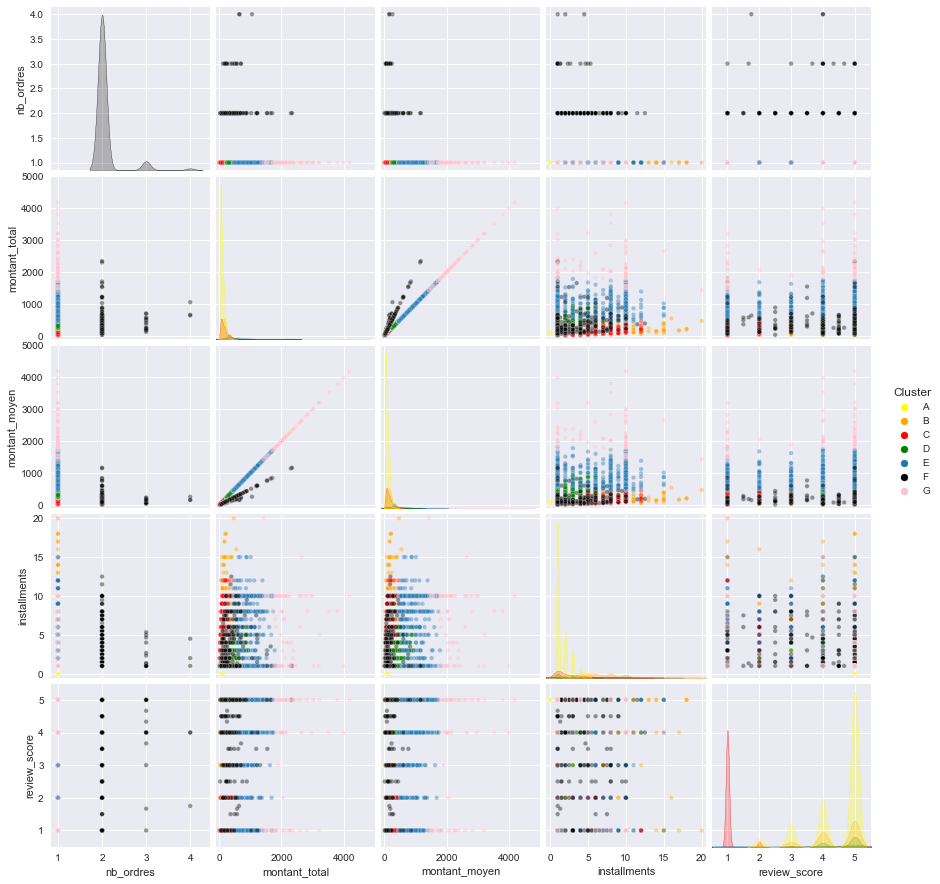

---------------------- Trimestre 6 ----------------------
Effectifs des clusters :
[('A', 12139), ('B', 3853), ('C', 1777), ('D', 855), ('E', 224), ('F', 200), ('G', 10)]


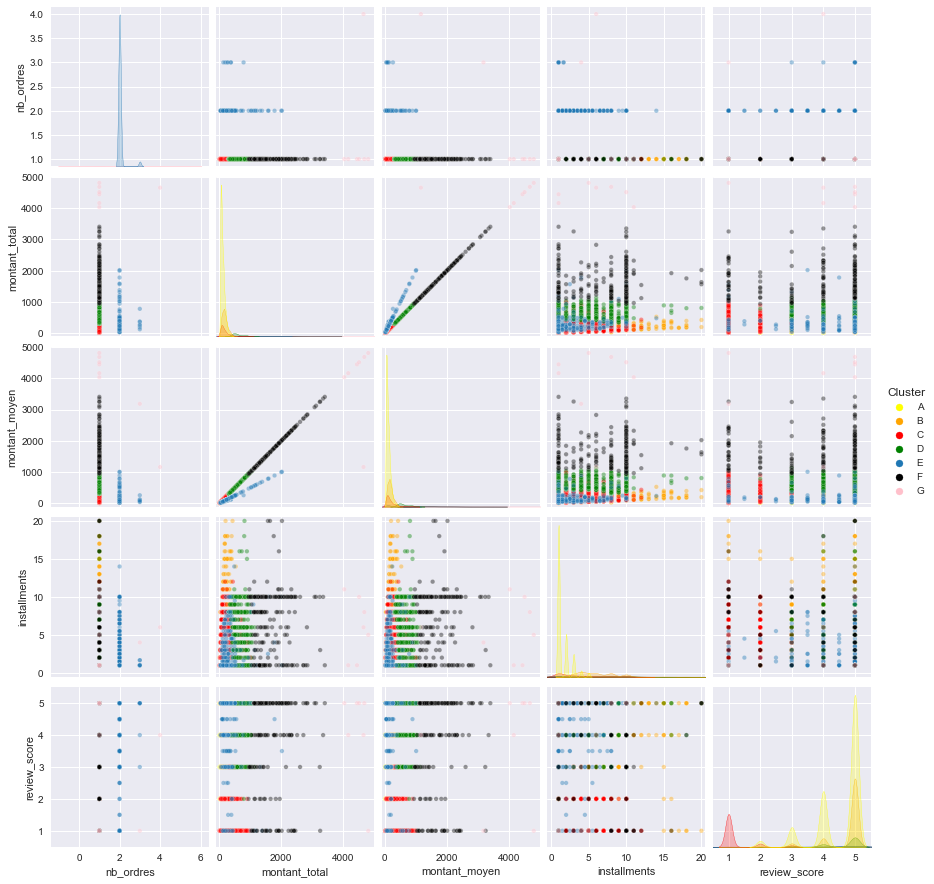

In [116]:
for trim in range(1, 7):
    print(f"---------------------- Trimestre {trim} ----------------------")
    affichage_pairplot_clustagglo(n_clusters=7, data_trim_X=data_trim[trim])

#### Analyse n_clusters = 4, 5, 6, 7

Lorsque n = 5, la taille des clusters est plus homogène que pour n=6.  
Cependant, avec n=6, on a l'avantage de garder toujours les mêmes clusters dans le même ordre (ordre défini par l'effectif du cluster).  
De plus, pour n=5, les clusters ne sont pas "attribuables" à des personae parlantes.  
Pour n=4, les clusters sont facilement attribuables à des personae.  
Pour n=7, les clusters sont difficilement attribuables à des personae.  

### Stabilité inter-trimestre des clusters

In [117]:
# Hyperparamètres utilisés
n_clusters = 6

Note : data_scaled_trim[0] est trop gros pour fclusterdata (MemoryError: unable to allocate array data), 

------------------- TRIMESTRE 1 -----------------------------
Effectifs des clusters :
[22, 209, 154, 906, 4337, 2266]
Proportion (%) :
[0.3, 2.6, 2.0, 11.5, 54.9, 28.7]


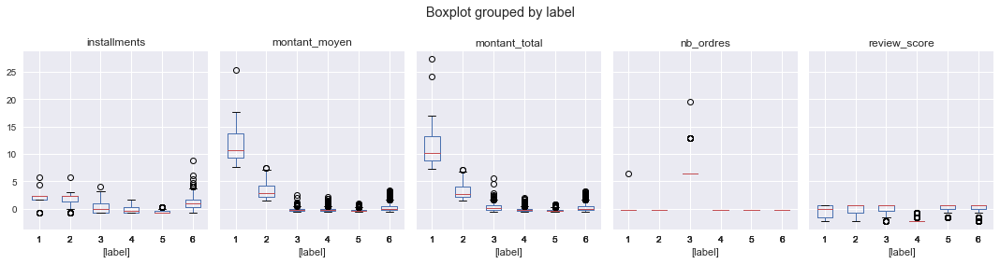

------------------- TRIMESTRE 2 -----------------------------
Effectifs des clusters :
[36, 395, 242, 1105, 2903, 6255]
Proportion (%) :
[0.3, 3.6, 2.2, 10.1, 26.5, 57.2]


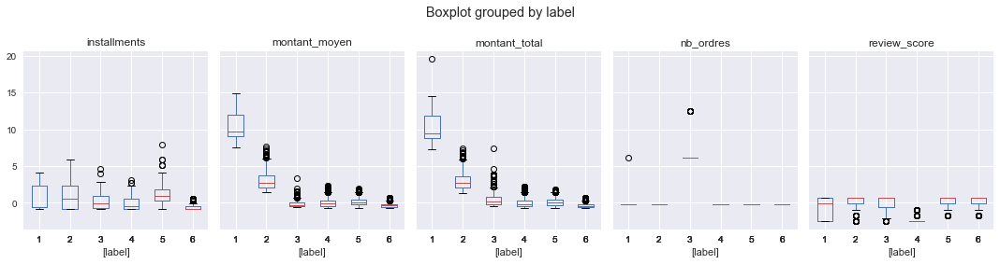

------------------- TRIMESTRE 3 -----------------------------
Effectifs des clusters :
[1521, 10600, 286, 1602, 550, 1]
Proportion (%) :
[10.4, 72.8, 2.0, 11.0, 3.8, 0.0]


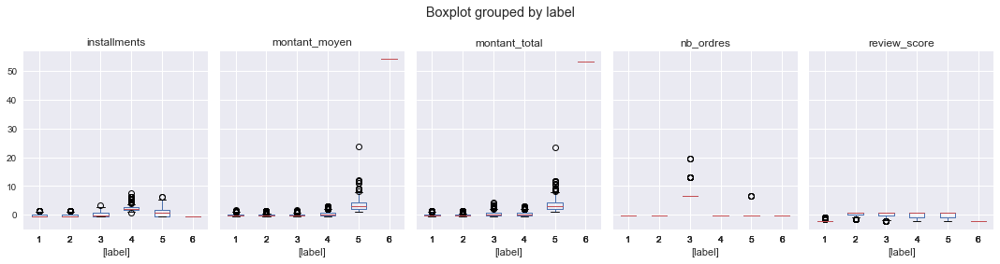

------------------- TRIMESTRE 4 -----------------------------
Effectifs des clusters :
[4744, 1409, 12894, 375, 552, 110]
Proportion (%) :
[23.6, 7.0, 64.2, 1.9, 2.7, 0.5]


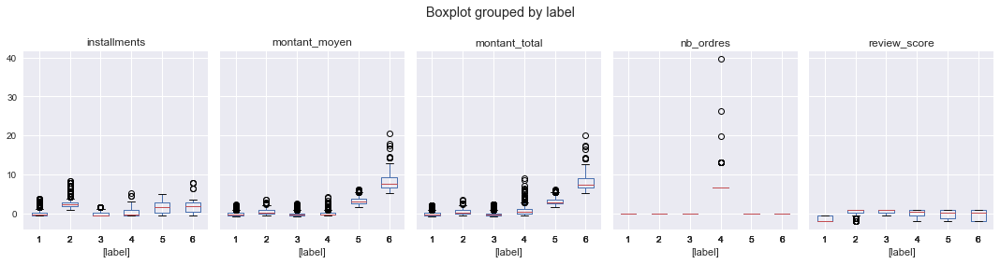

------------------- TRIMESTRE 5 -----------------------------
Effectifs des clusters :
[78, 668, 302, 2795, 3264, 13577]
Proportion (%) :
[0.4, 3.2, 1.5, 13.5, 15.8, 65.6]


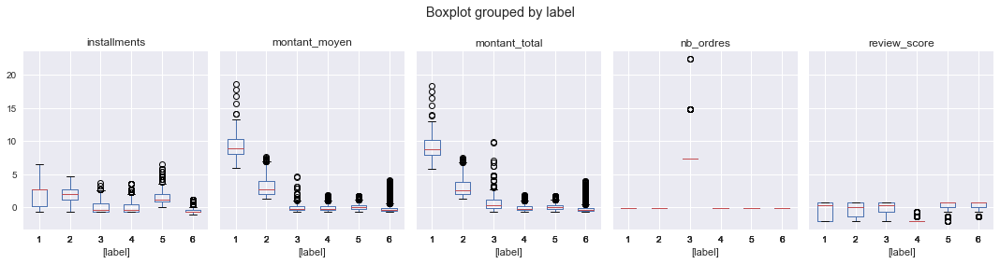

------------------- TRIMESTRE 6 -----------------------------
Effectifs des clusters :
[1777, 12139, 855, 3853, 224, 210]
Proportion (%) :
[9.3, 63.7, 4.5, 20.2, 1.2, 1.1]


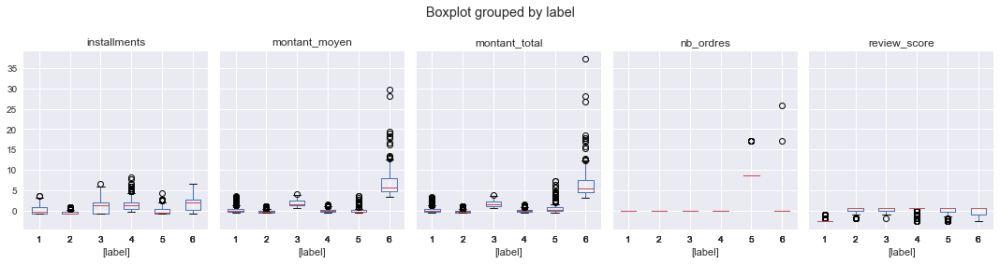

In [118]:
labels_trim = [trim
               for trim in range(7)]  # liste des labels de chaque trimestre
effectifs_trim = [trim for trim in range(7)]
frequence_trim = [trim for trim in range(7)]

for trim in range(1, 7):
    print(
        f"------------------- TRIMESTRE {trim} -----------------------------")
    labels = fclusterdata(data_scaled_trim[trim],
                          t=n_clusters,
                          criterion='maxclust',
                          method='ward')
    labels_trim[trim] = labels
    print("Effectifs des clusters :")
    bincounts = list(np.bincount(labels))
    del bincounts[0]
    effectifs_trim[trim] = bincounts
    print(bincounts)
    frequences = [bincount / sum(bincounts) * 100 for bincount in bincounts]
    frequence_trim[trim] = frequences
    print("Proportion (%) :")
    print([round(frequence * 10) / 10 for frequence in frequences])

    data_scaled_clustered_trim_X = pd.DataFrame(
        data_scaled_trim[trim],
        index=data_trim[trim].index,
        columns=data_trim[trim].columns)
    data_scaled_clustered_trim_X["label"] = labels
    data_scaled_clustered_trim_X.boxplot(by="label",
                                         figsize=(15, 4),
                                         layout=(1, 5))
    plt.tight_layout()
    plt.show()

Observations :  
\* on retrouve à chaque clustering les clusters suivants :  
\- cluster A : montant de commande très élevé (trim 1 : label 1 ; 2 : 1 ; 3 : 5 ; 4 : 6 ; 5 : 1 ; 6 : 6) : 0.3 à 1.1% des effectifs.  
\- cluster B : montant de commande élevé (trim 1 : label 2 ; 2 : 2 ; 3 : 4 ; 4 : 5 ; 5 : 2 ; 6 : 3) : 2.6%, 3.6%, 11.0%, 2.7%, 3.2%, 4.5% des effectifs.  
\- cluster C : review score faible (trim 1 : label 4 ; 2 : 4 ; 3 : 1 ; 4 : 1 ; 5 : 4 ; 6 : 1) : 11%, 10%, 10%, 24%, 14%, 9% des effectifs.  
\- cluster D : nb d'ordres élevé (trim 1 : label 3 ; 2 : 3 ; 3 : 3 ; 4 : 4 ; 5 : 3 ; 6 : 5) : 2.0%, 2.2%, 2.0%, 1.9%, 1.5%, 1.2% des effectifs.  
\- cluster E : client typique (trim 1 : label 5 ; 2 : 6 ; 3 : 2 ; 4 : 3 ; 5 : 6 ; 6 : 2) : 55%, 57%, 73%, 64%, 66%, 64% des effectifs.  
\- cluster F : client typique (mais se différencie de E par le nb d'installments) (trim 1 : label 6 ; 2 : 5 ; 3 : 6 ; 4 : 2 ; 5 : 5 ; 6 : 4) : 29%, 27%, 0.0%, 7.0%, 16%, 20% des effectifs. 
\- pas de cluster lié à l'installment.  

Une attribution des labels (1 à 6) de l'apprentissage supervisé aux clusters (A à F) a pu être faite.

### Comparaison avec k-means (k=6) pour le trimestre 6

Calcul des personnae en faisant les moyennes

In [119]:
data_trim_6_clusters_6 = data_trim[6].copy()
data_trim_6_clusters_6['label'] = labels_trim[6]
data_trim_6_clusters_6

,nb_ordres,montant_total,montant_moyen,installments,review_score,label
4,1.0,252.25,252.25,8.0,5.0,4
16,1.0,136.93,136.93,2.0,5.0,2
17,1.0,16.53,16.53,1.0,5.0,2
26,1.0,62.39,62.39,1.0,5.0,2
29,1.0,58.69,58.69,1.0,5.0,2
...,...,...,...,...,...,...
99407,1.0,121.04,121.04,1.0,3.0,2
99408,1.0,110.88,110.88,1.0,5.0,2
99415,1.0,107.96,107.96,2.0,4.0,2
99426,1.0,63.00,63.00,6.0,5.0,4


In [120]:
data_trim_6_clusters_6 = data_trim_6_clusters_6.groupby('label').mean()
data_trim_6_clusters_6['effectif'] = effectifs_trim[6]
data_trim_6_clusters_6['frequence%'] = frequence_trim[6]
data_trim_6_clusters_6.sort_values('effectif', ascending=False, inplace=True)
data_trim_6_clusters_6['cluster'] = ['A', 'B', 'C', 'D', 'E', 'F']

with pd.option_context('display.max_colwidth', 100, 'display.precision', 2):
    display(data_trim_6_clusters_6)

,nb_ordres,montant_total,montant_moyen,installments,review_score,effectif,frequence%,cluster
label,,,,,,,,
2,1.00,102.44,102.44,1.54,4.51,12139,63.70,A
4,1.00,171.93,171.93,6.00,4.79,3853,20.22,B
1,1.00,182.64,182.64,3.20,1.17,1777,9.32,C
3,1.00,595.02,595.02,5.58,4.68,855,4.49,D
5,2.03,311.27,153.88,2.83,4.19,224,1.18,E
6,1.02,1845.72,1798.76,6.74,3.88,210,1.10,F


### Conclusion sur le clustering hiérarchique

###### Points faibles

Absence de méthode "predict()" pour classifier des données non labellisées (en pratique ça semble faisable).  
Les grands clusters sont trop grands.  
La formation des clusters est chaotique (i.e. en enlevant/ajoutant une seule ligne du dataset, on peut obtenir des clusters très différents).

## Autres modèles de clustering envisagées

Certains modèles ont été écartés du fait de l'absence de méthode "predict()". Cette absence complique les tests de stabilité.

La liste des modèles envisagées et écartés est la suivante :  
\- DBSCAN  
\- OPTICS  
\- Spectral clustering  

Les modèles suivants disposent d'une méthode predict() et peuvent être testées :  
\- k-means
\- Affinity Propagation  
\- Mean Shift  
\- Birch  
\- K-Modes (module kmodes) pour data quali  
\- K-Prototypes (module kmodes) pour data quanti et quali

## Clustering par Affinity Propagation 

In [121]:
n_samples = 400
rng = np.random.default_rng(0)
data_scaled_trim_1_sample = data_scaled_trim[1][rng.choice(
    data_scaled_trim[1].shape[0], n_samples, replace=False)]

In [122]:
model = AffinityPropagation(random_state=0, max_iter=10000, preference=-50)
model.fit(data_scaled_trim_1_sample)

AffinityPropagation(max_iter=10000, preference=-50, random_state=0)

In [123]:
model.n_iter_

2199

In [124]:
labels = model.labels_
print("Nb de clusters :", len(np.unique(labels)) + 1)
print("Effectifs des clusters :")
bincounts = np.bincount(labels)
print(bincounts)
print("Fréquences :")
print([
    round(bincount / sum(bincounts) * 100 * 10) / 10 for bincount in bincounts
])

Nb de clusters : 10
Effectifs des clusters :
[ 60  10  19   5 160   1  34 100  11]
Fréquences :
[15.0, 2.5, 4.8, 1.2, 40.0, 0.2, 8.5, 25.0, 2.8]


Approche abandonnée car Affinity Propagation n'est adapté qu'à des échantillons de taille petite. Il faut 48s pour fitter un échantillon de 800 lignes et la complexité algorithmique est de type O(n3) voire O(n4).

## Clustering par Mean Shift

In [125]:
data_sample = data_scaled_trim[6]

In [126]:
model = MeanShift(bandwidth=None)
model.fit(data_sample)

MeanShift()

In [127]:
model.n_iter_

29

In [128]:
labels = model.labels_
print("Nb de clusters :", len(np.unique(labels)) + 1)
print("Effectifs des clusters :")
bincounts = np.bincount(labels)
print(bincounts)
print("Fréquences :")
print([
    round(bincount / sum(bincounts) * 100 * 10) / 10 for bincount in bincounts
])

Nb de clusters : 49
Effectifs des clusters :
[14860  3143   192   168   141    28    10    18   238     7    25     6     6   141     6     5     4     4     4     3     3     2     2     2     8     1     1
     1     1     1     1     1     1     1     1     8     1     1     1     1     1     1     1     1     1     3     1     1]
Fréquences :
[78.0, 16.5, 1.0, 0.9, 0.7, 0.1, 0.1, 0.1, 1.2, 0.0, 0.1, 0.0, 0.0, 0.7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


L'algo est lent, mais assez rapide pour traiter notre problème.  
Gros point faible de cet algo sur notre jeu de données : le plus gros cluster est systématiquement trop gros (il contient une proportion trop importante des effectifs) par rapport aux autres clusters.

## Clustering par BIRCH

In [129]:
model = Birch(n_clusters=6)
model.fit(data_scaled_trim[6])

Birch(n_clusters=6)

In [130]:
labels = model.labels_
print("Nb de clusters :", len(np.unique(labels)))
print("Effectifs des clusters :")
bincounts = np.bincount(labels)
print(bincounts)
print("Fréquences :")
print([
    round(bincount / sum(bincounts) * 100 * 10) / 10 for bincount in bincounts
])

Nb de clusters : 6
Effectifs des clusters :
[  209 18604   224    17     2     2]
Fréquences :
[1.1, 97.6, 1.2, 0.1, 0.0, 0.0]


L'algo est ultra-rapide.  
Gros point faible de cet algo sur notre jeu de données : le plus gros cluster est systématiquement trop gros (il contient une proportion trop importante des effectifs) par rapport aux autres clusters.  
Les clusters sont très différents de ceux obtenus par clustering hiérarchique agglomératif.